In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import category_encoders as ce
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [2]:
df1 = pd.read_csv("data/penguins_size.csv")
df1.dtypes

species               object
island                object
culmen_length_mm     float64
culmen_depth_mm      float64
flipper_length_mm    float64
body_mass_g          float64
sex                   object
dtype: object

In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            344 non-null    object 
 1   island             344 non-null    object 
 2   culmen_length_mm   342 non-null    float64
 3   culmen_depth_mm    342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [4]:
def calculate_missing_data(df1):
    total = df1.isnull().sum().sort_values(ascending=False)
    percent_1 = df1.isnull().sum() / df1.isnull().count() * 100
    percent_2 = (round(percent_1, 1)).sort_values(ascending=False)
    missing_data = pd.concat([total, percent_2], axis=1, keys=['Total', '%'])
    return missing_data
calculate_missing_data(df1)

,Total,%
sex,10,2.9
culmen_length_mm,2,0.6
culmen_depth_mm,2,0.6
flipper_length_mm,2,0.6
body_mass_g,2,0.6
species,0,0.0
island,0,0.0


In [5]:
df1

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


In [6]:
# this is a way to quickly make a new df and check if all 10 null rows for 'sex' happen to contain all the other null values as well
df = pd.DataFrame(df1)
filtered_df = df[df['sex'].isna()]
print(filtered_df)
# conveniently, they do

    species     island  culmen_length_mm  culmen_depth_mm  flipper_length_mm  \
3    Adelie  Torgersen               NaN              NaN                NaN   
8    Adelie  Torgersen              34.1             18.1              193.0   
9    Adelie  Torgersen              42.0             20.2              190.0   
10   Adelie  Torgersen              37.8             17.1              186.0   
11   Adelie  Torgersen              37.8             17.3              180.0   
47   Adelie      Dream              37.5             18.9              179.0   
246  Gentoo     Biscoe              44.5             14.3              216.0   
286  Gentoo     Biscoe              46.2             14.4              214.0   
324  Gentoo     Biscoe              47.3             13.8              216.0   
339  Gentoo     Biscoe               NaN              NaN                NaN   

     body_mass_g  sex  
3            NaN  NaN  
8         3475.0  NaN  
9         4250.0  NaN  
10        3300.0  NaN  

In [7]:
# dropping all null values
df1 = df1.dropna(subset=['sex'])
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            334 non-null    object 
 1   island             334 non-null    object 
 2   culmen_length_mm   334 non-null    float64
 3   culmen_depth_mm    334 non-null    float64
 4   flipper_length_mm  334 non-null    float64
 5   body_mass_g        334 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 20.9+ KB


In [8]:
df1 = df1.applymap(lambda x: x.lower() if isinstance(x, str) else x)
# df1.to_csv('Penguins_Cleaned.csv', index=False)
df1

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,adelie,torgersen,39.1,18.7,181.0,3750.0,male
1,adelie,torgersen,39.5,17.4,186.0,3800.0,female
2,adelie,torgersen,40.3,18.0,195.0,3250.0,female
4,adelie,torgersen,36.7,19.3,193.0,3450.0,female
5,adelie,torgersen,39.3,20.6,190.0,3650.0,male
...,...,...,...,...,...,...,...
338,gentoo,biscoe,47.2,13.7,214.0,4925.0,female
340,gentoo,biscoe,46.8,14.3,215.0,4850.0,female
341,gentoo,biscoe,50.4,15.7,222.0,5750.0,male
342,gentoo,biscoe,45.2,14.8,212.0,5200.0,female


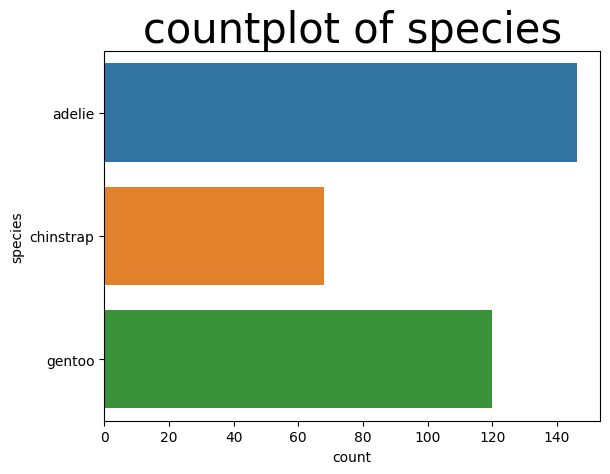

<Figure size 400x400 with 0 Axes>

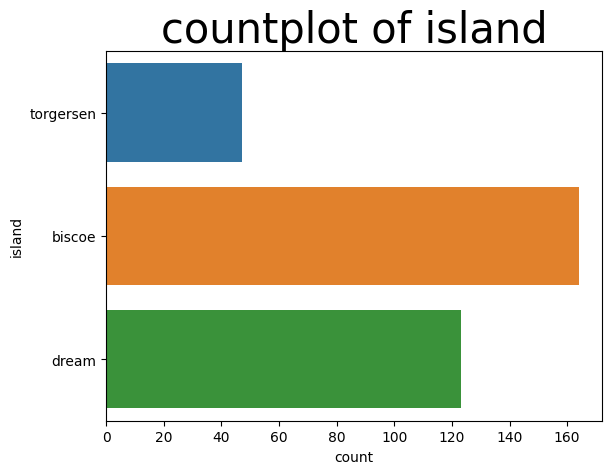

<Figure size 400x400 with 0 Axes>

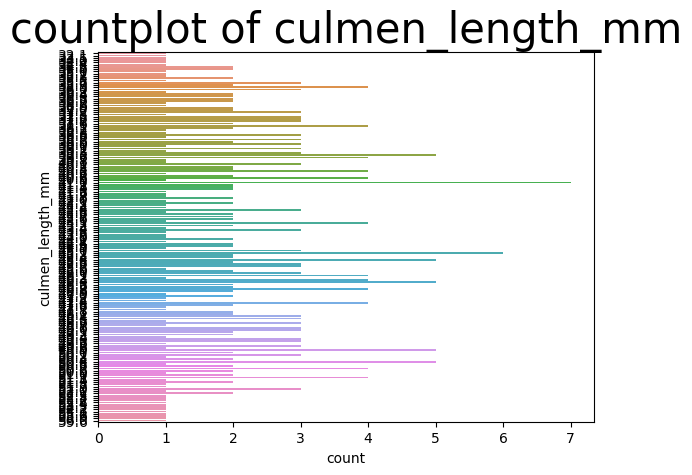

<Figure size 400x400 with 0 Axes>

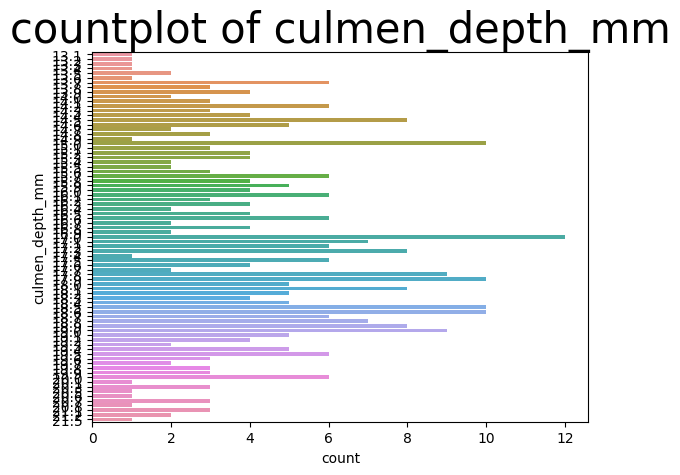

<Figure size 400x400 with 0 Axes>

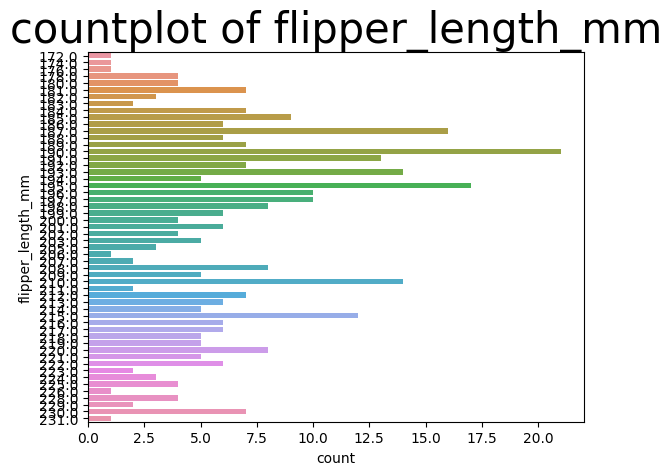

<Figure size 400x400 with 0 Axes>

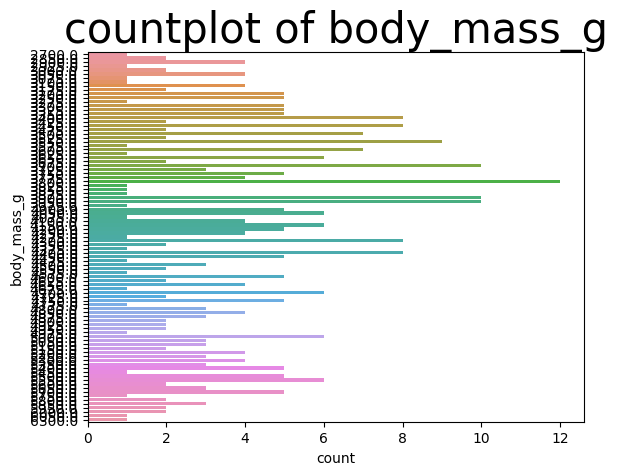

<Figure size 400x400 with 0 Axes>

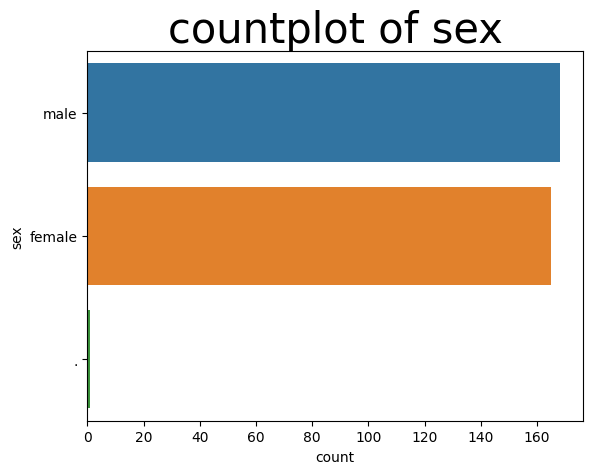

<Figure size 400x400 with 0 Axes>

In [9]:
# lets make a for loop to make value count plots for the categorical variables.
categorical = ['species', 'island', 
         'culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g',
       'sex']
categorical

for col in categorical:
  ax=sns.countplot(y=col,data=df1)
  plt.title(f"countplot of {col}", fontsize = 30)
  plt.show(plt.figure(figsize=(4, 4)))

In [10]:
unique_sex_values = df1['sex'].unique()
print("Unique values in the 'sex' column:")
for value in unique_sex_values:
    print(value)

Unique values in the 'sex' column:
male
female
.


In [11]:
# for some reason, 1 value in the 'sex' column is '.' so let'a drop it.
df1 = df1[df1['sex'] != '.']
df1

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,adelie,torgersen,39.1,18.7,181.0,3750.0,male
1,adelie,torgersen,39.5,17.4,186.0,3800.0,female
2,adelie,torgersen,40.3,18.0,195.0,3250.0,female
4,adelie,torgersen,36.7,19.3,193.0,3450.0,female
5,adelie,torgersen,39.3,20.6,190.0,3650.0,male
...,...,...,...,...,...,...,...
338,gentoo,biscoe,47.2,13.7,214.0,4925.0,female
340,gentoo,biscoe,46.8,14.3,215.0,4850.0,female
341,gentoo,biscoe,50.4,15.7,222.0,5750.0,male
342,gentoo,biscoe,45.2,14.8,212.0,5200.0,female


C:\Users\Scott Libby\AppData\Local\Temp\ipykernel_27924\2910242127.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x='counts', y='unique_values', data=counts, ci=None, palette='muted')


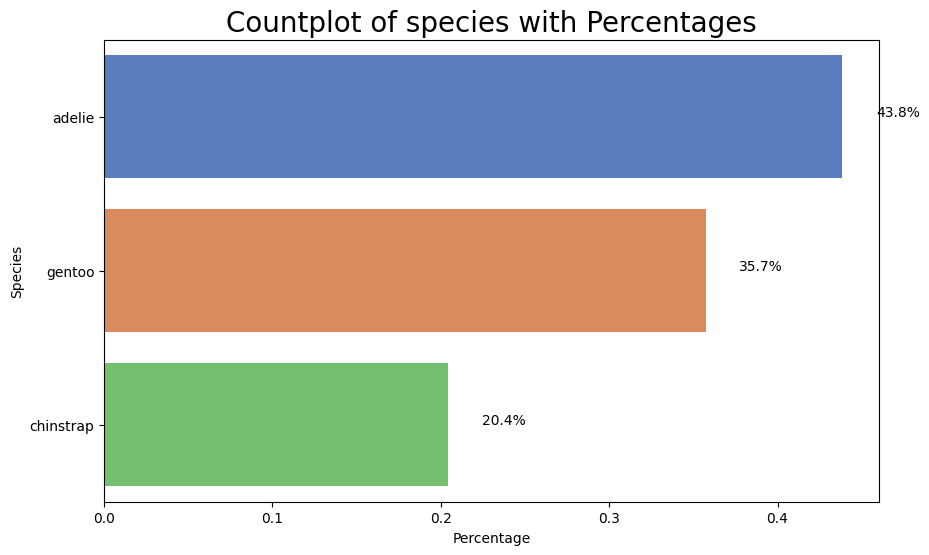

C:\Users\Scott Libby\AppData\Local\Temp\ipykernel_27924\2910242127.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x='counts', y='unique_values', data=counts, ci=None, palette='muted')


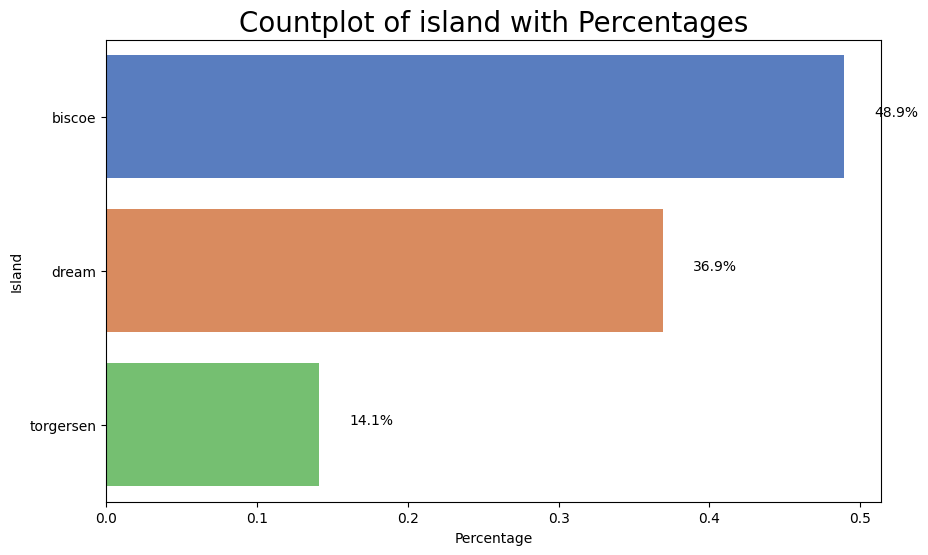

C:\Users\Scott Libby\AppData\Local\Temp\ipykernel_27924\2910242127.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x='counts', y='unique_values', data=counts, ci=None, palette='muted')


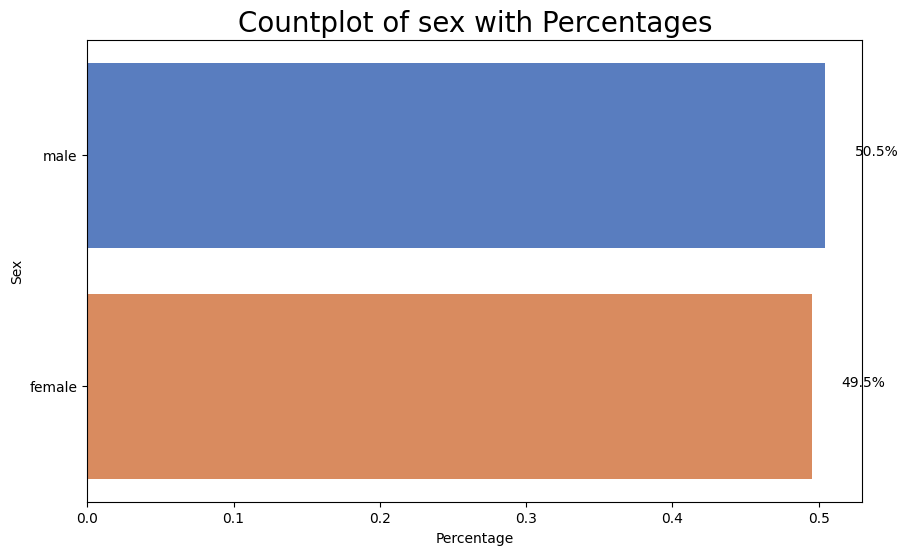

In [12]:
categorical = ['species', 'island', 'sex']

for col in categorical:
    total = len(df1[col]) 
    counts = df1[col].value_counts(normalize=True).rename_axis('unique_values').reset_index(name='counts')
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x='counts', y='unique_values', data=counts, ci=None, palette='muted')
    ax.set_title(f"Countplot of {col} with Percentages", fontsize=20)
    ax.set_xlabel('Percentage')
    ax.set_ylabel(col.capitalize())
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width())
        x = p.get_x() + p.get_width() + 0.02 
        y = p.get_y() + p.get_height() / 2
        ax.annotate(percentage, (x, y))
    
    plt.show()

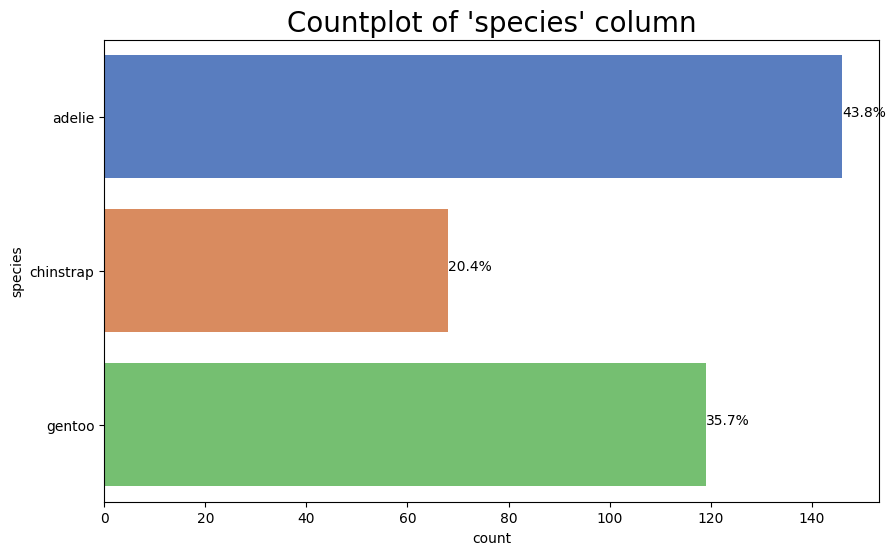

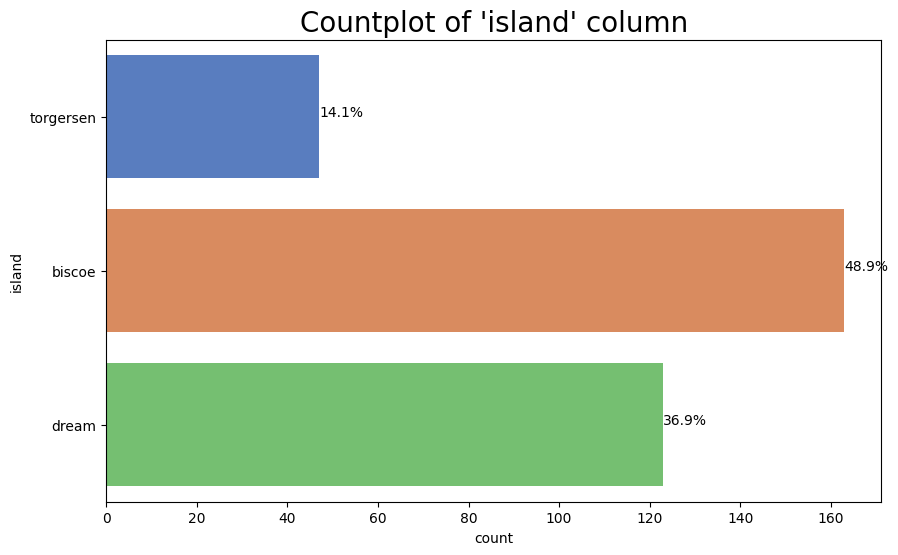

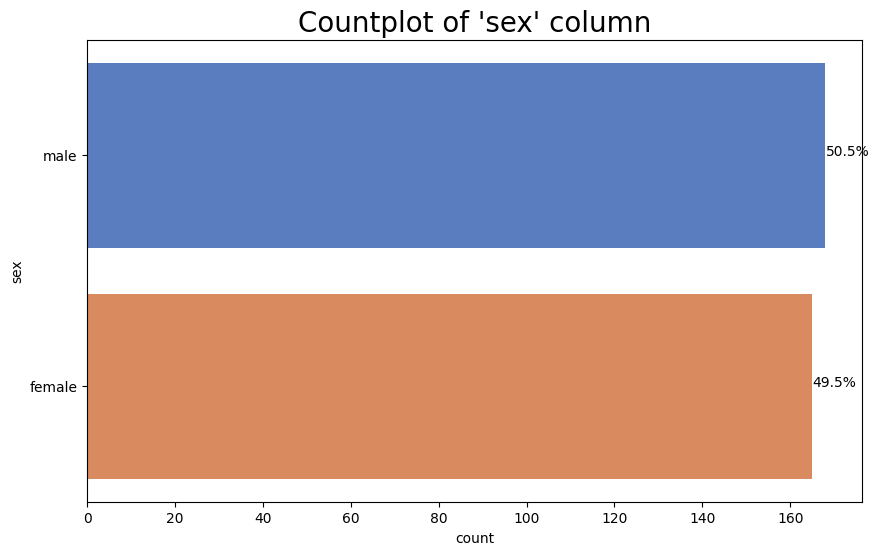

In [13]:
categorical = ['species', 'island', 'sex']

for col in categorical:
    plt.figure(figsize=(10, 6))

    ax = sns.countplot(y=col, data=df1, palette='muted')
    plt.title(f"Countplot of '{col}' column", fontsize=20)

    total = float(len(df1[col]))
    

    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width() / total)
        x = p.get_width() + 0.02  
        y = p.get_y() + p.get_height() / 2
        ax.annotate(percentage, (x, y))
    
    plt.show()

In [14]:
def create_species_dfs(df):
    species_list = df['species'].unique()
    species_dfs = {species: df[df['species'] == species] for species in species_list}
    return species_list, species_dfs

species_list, species_dfs = create_species_dfs(df1)

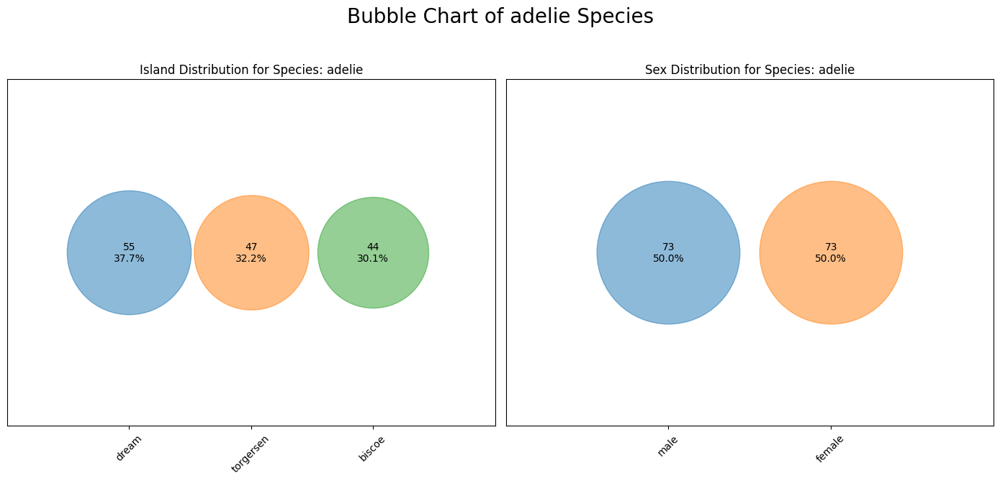

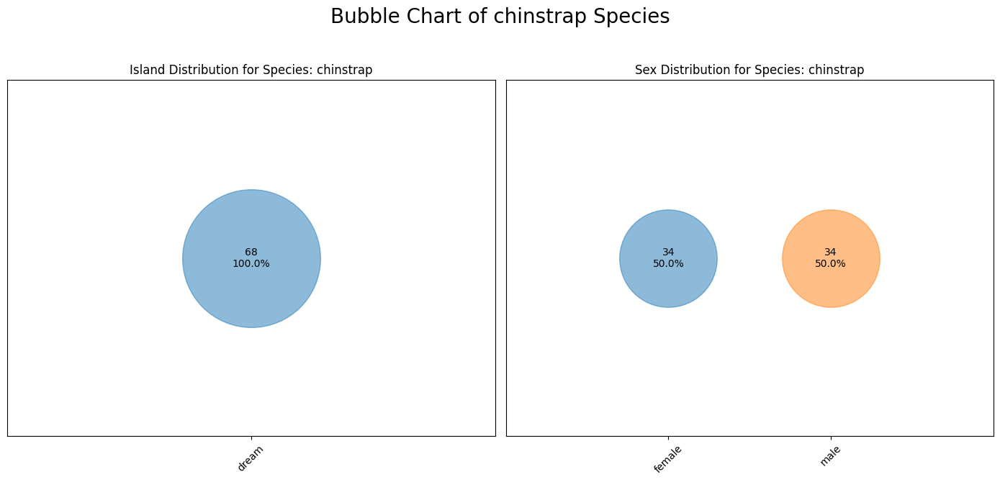

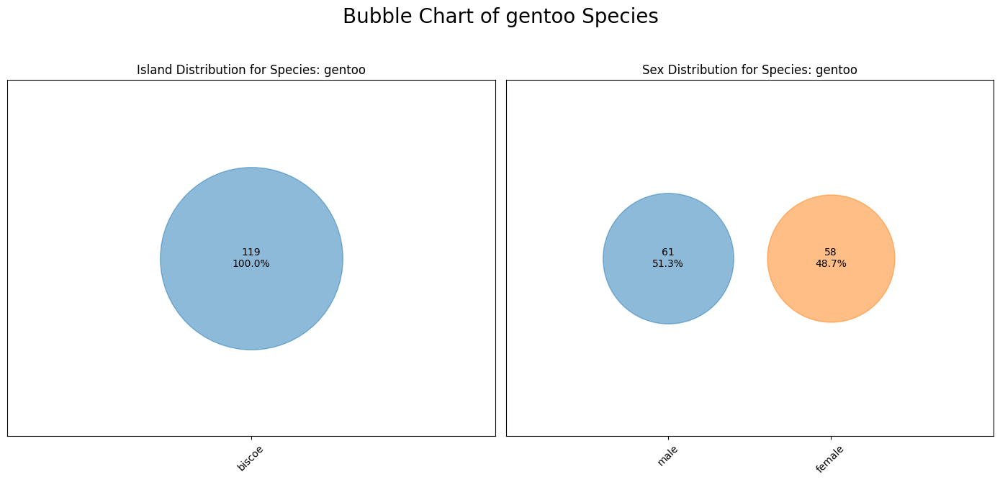

In [15]:
def plot_bubble_chart(df, column, ax, title):
    counts = df[column].value_counts()
    percentages = df[column].value_counts(normalize=True) * 100
    unique_values = counts.index
    sizes = counts * 280  
    
    for i, value in enumerate(unique_values):
        ax.scatter(value, 0, s=sizes[i], alpha=0.5) 
   
        ax.text(value, 0, f"{counts[i]}\n{percentages[i]:.1f}%", ha='center', va='center')
    
    ax.set_title(title)
    ax.get_yaxis().set_visible(False) 
    ax.get_xaxis().set_tick_params(rotation=45)
    ax.set_xlim(-1, len(unique_values))  
columns_to_compare = ['island', 'sex']
for species, df in species_dfs.items():
    fig, axs = plt.subplots(1, len(columns_to_compare), figsize=(14, 7))
    fig.suptitle(f"Bubble Chart of {species} Species", fontsize=20)
    
    if len(columns_to_compare) == 1: 
        axs = [axs]
    
    for ax, col in zip(axs, columns_to_compare):
        plot_bubble_chart(df, col, ax, f"{col.capitalize()} Distribution for Species: {species}")
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
    plt.show()

In [16]:
def create_island_dfs(df):
    island_list = df['island'].unique()
    island_dfs = {island: df[df['island'] == island] for island in island_list}
    return island_list, island_dfs

island_list, island_dfs = create_island_dfs(df1)

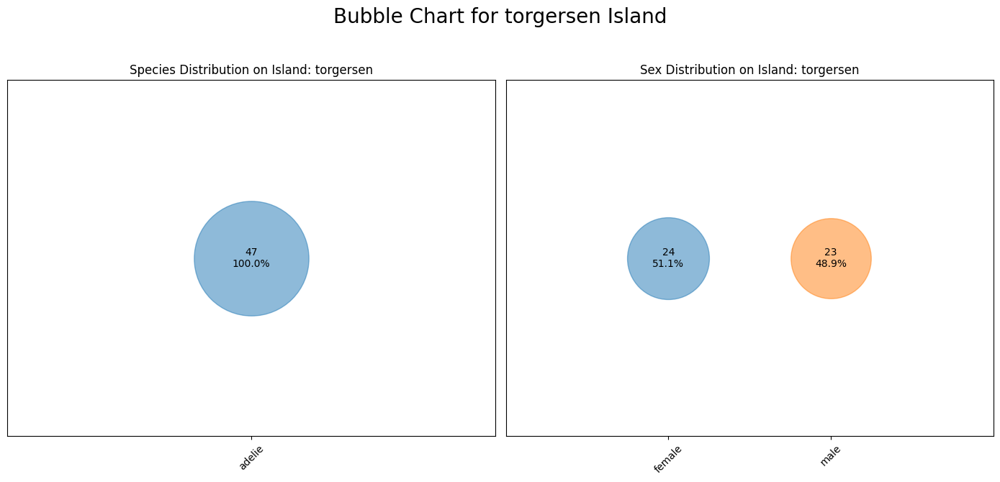

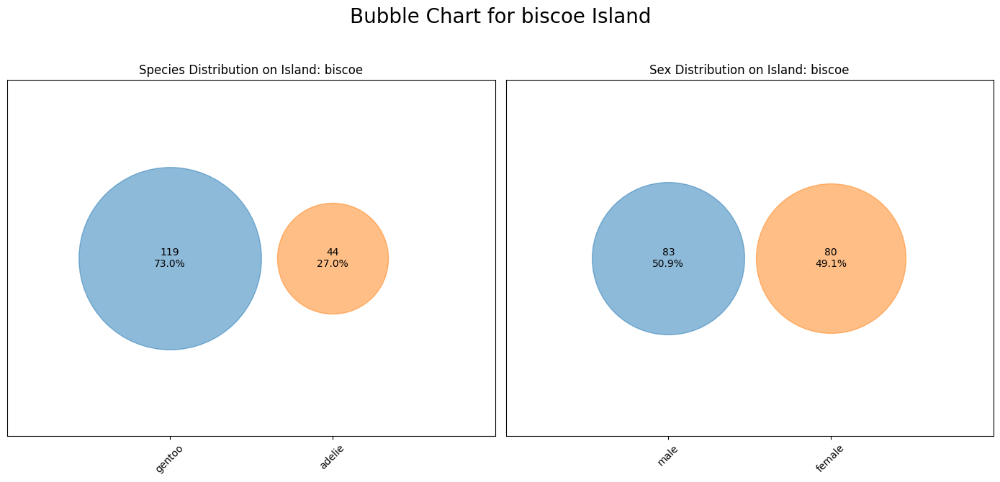

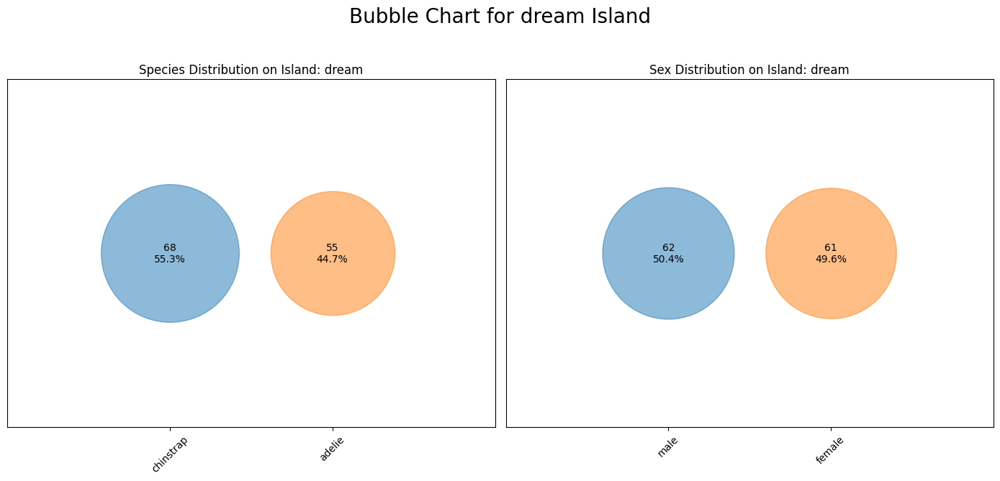

In [17]:
def plot_bubble_chart(df, column, ax, title):
    counts = df[column].value_counts()
    percentages = df[column].value_counts(normalize=True) * 100
    unique_values = counts.index

    sizes = counts * 280  
    
    for i, value in enumerate(unique_values):
        ax.scatter(value, 0, s=sizes[i], alpha=0.5)  

        ax.text(value, 0, f"{counts[i]}\n{percentages[i]:.1f}%", ha='center', va='center')
    
    ax.set_title(title)
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_tick_params(rotation=45)
    ax.set_xlim(-1, len(unique_values))
columns_to_compare = ['species', 'sex']

for island, df in island_dfs.items():
    fig, axs = plt.subplots(1, len(columns_to_compare), figsize=(14, 7))
    fig.suptitle(f"Bubble Chart for {island} Island", fontsize=20)
    
    if len(columns_to_compare) == 1:
        axs = [axs]
    
    for ax, col in zip(axs, columns_to_compare):
        plot_bubble_chart(df, col, ax, f"{col.capitalize()} Distribution on Island: {island}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [18]:
def plot_pie_chart(df, column, ax, title):
    counts = df[column].value_counts()
    percentages = df[column].value_counts(normalize=True) * 100
    labels = [f'{index}' for index in counts.index]
    wedges, texts, autotexts = ax.pie(counts, labels=labels, startangle=90, counterclock=False, autopct='%1.1f%%')
    for autotext, count, percentage in zip(autotexts, counts, percentages):
        autotext.set_text(f'{count}\n({percentage:.1f}%)')
    ax.set_title(title)
    detailed_labels = [f'{label} - {count} ({percentage:.1f}%)' for label, count, percentage in zip(counts.index, counts, percentages)]
    ax.legend(wedges, detailed_labels, title=column.capitalize(), loc="center left", bbox_to_anchor=(1, 0.5))

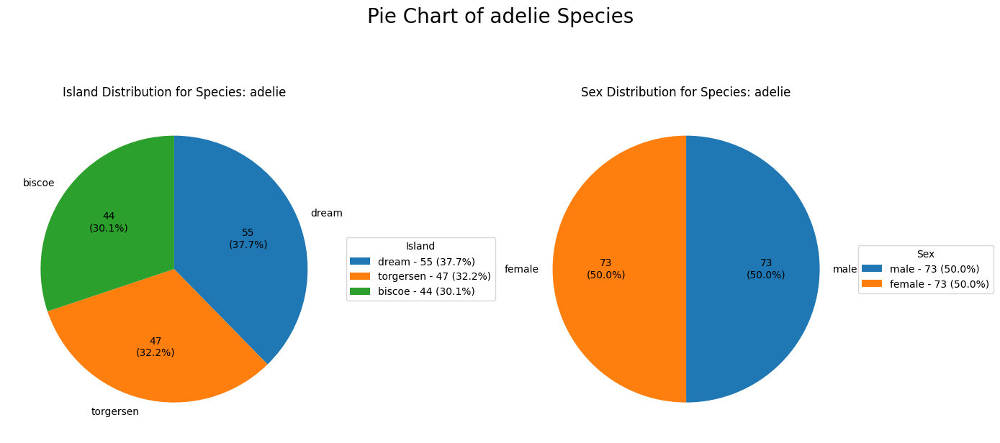

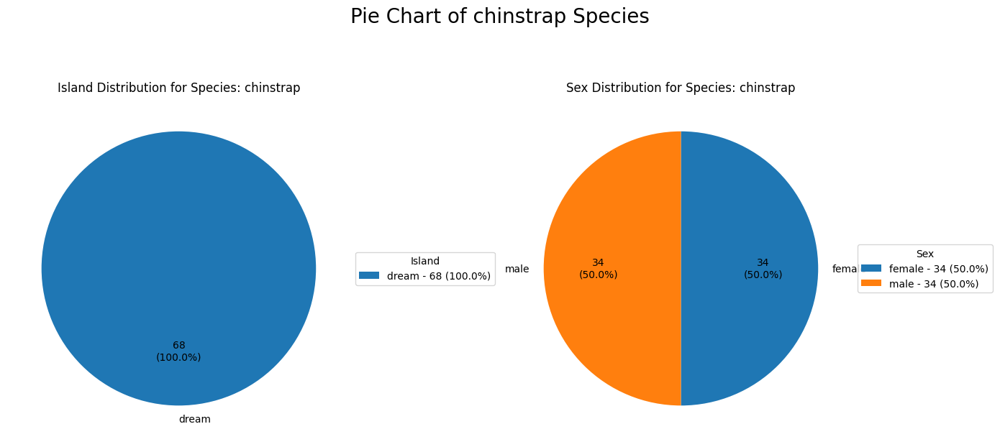

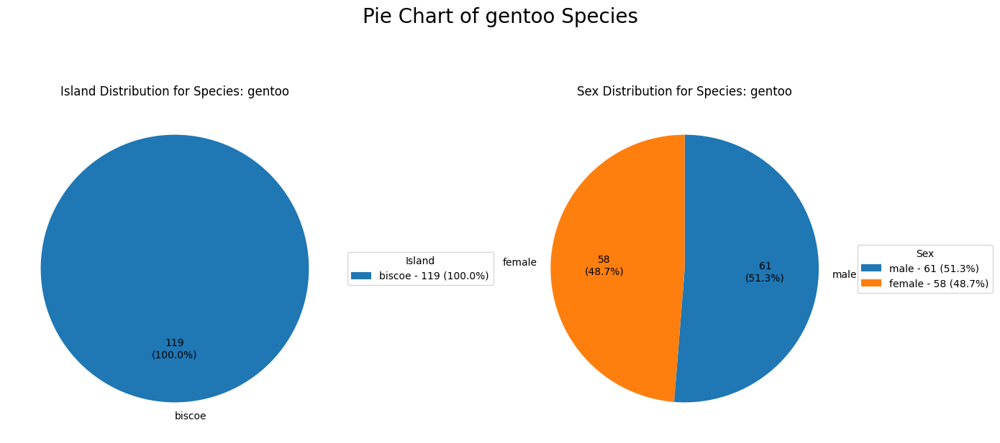

In [19]:
columns_to_compare = ['island', 'sex']
for species, df in species_dfs.items():
    fig, axs = plt.subplots(1, len(columns_to_compare), figsize=(14, 7))
    fig.suptitle(f"Pie Chart of {species} Species", fontsize=20)
    if len(columns_to_compare) == 1:
        axs = [axs]
    for ax, col in zip(axs, columns_to_compare):
        plot_pie_chart(df, col, ax, f"{col.capitalize()} Distribution for Species: {species}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

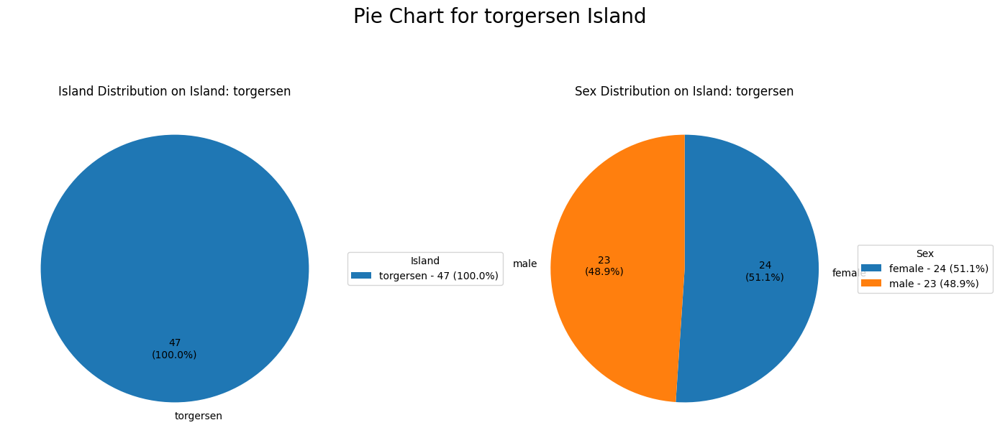

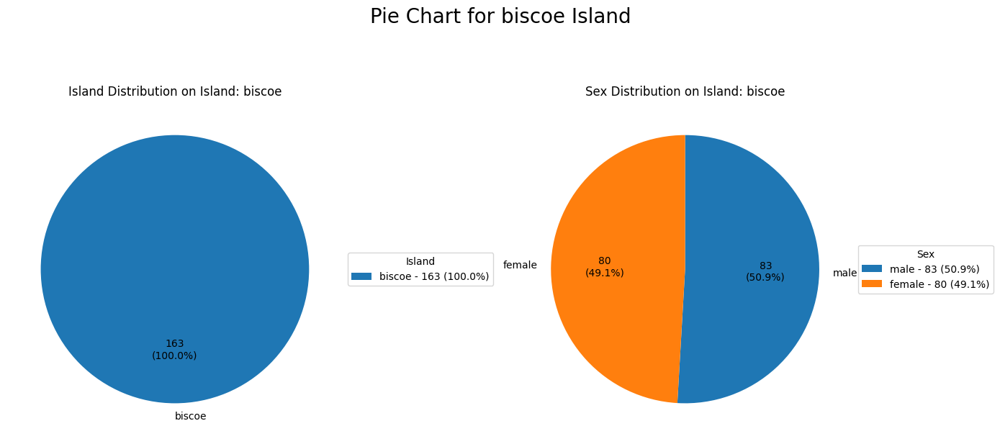

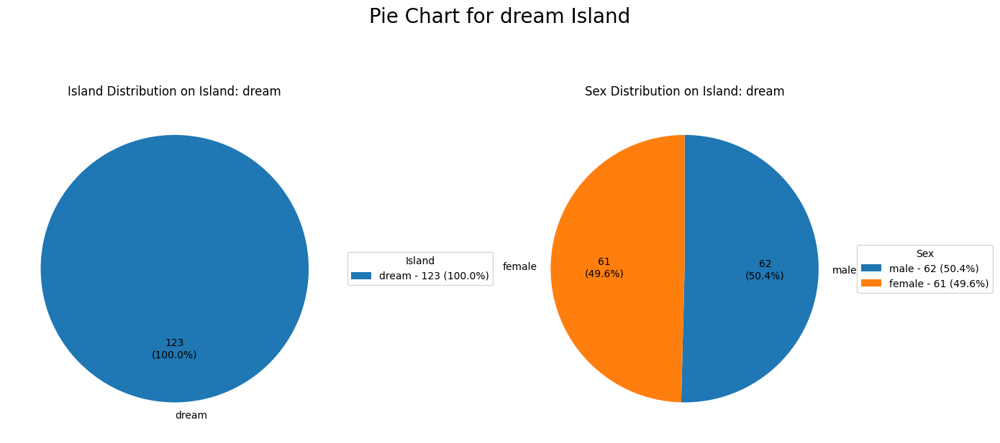

In [20]:
for island, df in island_dfs.items():
    fig, axs = plt.subplots(1, len(columns_to_compare), figsize=(14, 7))
    fig.suptitle(f"Pie Chart for {island} Island", fontsize=20)
    if len(columns_to_compare) == 1:  # Adjust for a single column
        axs = [axs]
    for ax, col in zip(axs, columns_to_compare):
        plot_pie_chart(df, col, ax, f"{col.capitalize()} Distribution on Island: {island}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

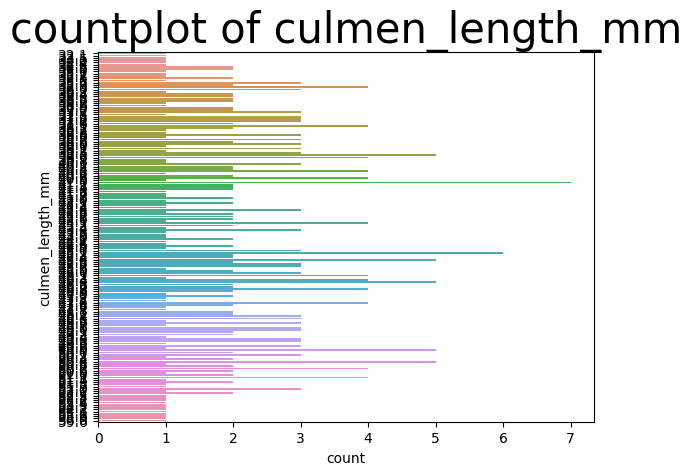

<Figure size 400x400 with 0 Axes>

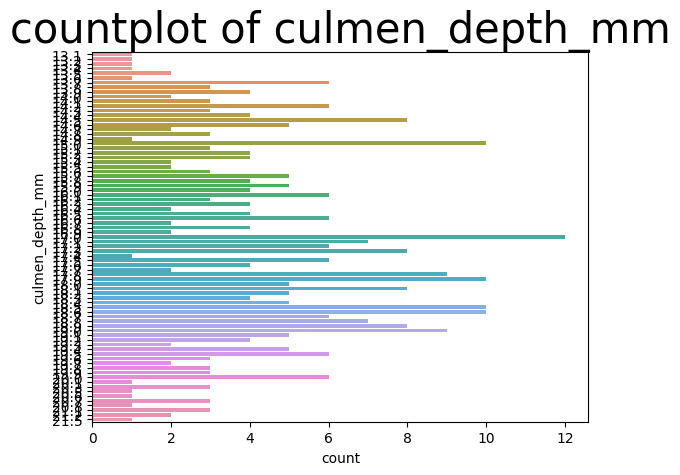

<Figure size 400x400 with 0 Axes>

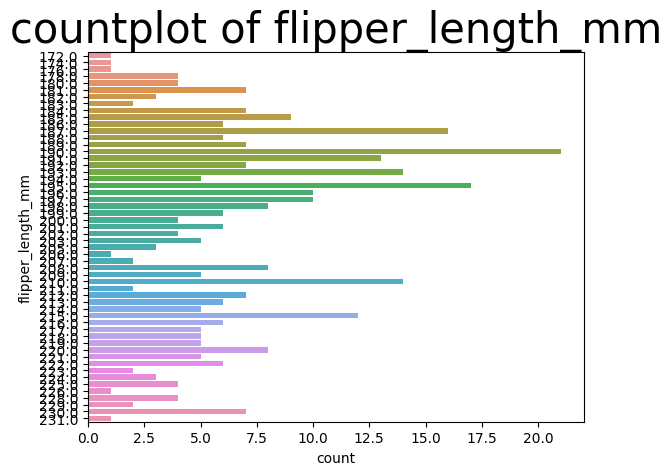

<Figure size 400x400 with 0 Axes>

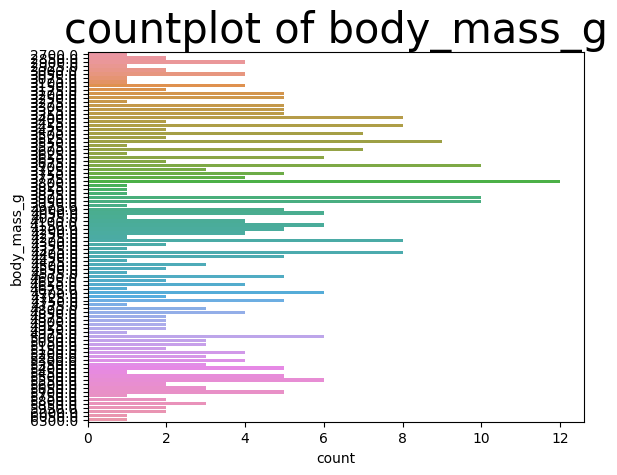

<Figure size 400x400 with 0 Axes>

In [21]:
categorical = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g',]
categorical
for col in categorical:
  ax=sns.countplot(y=col,data=df1)
  plt.title(f"countplot of {col}", fontsize = 30)
  plt.show(plt.figure(figsize=(4, 4)))

Visualizations for torgersen:


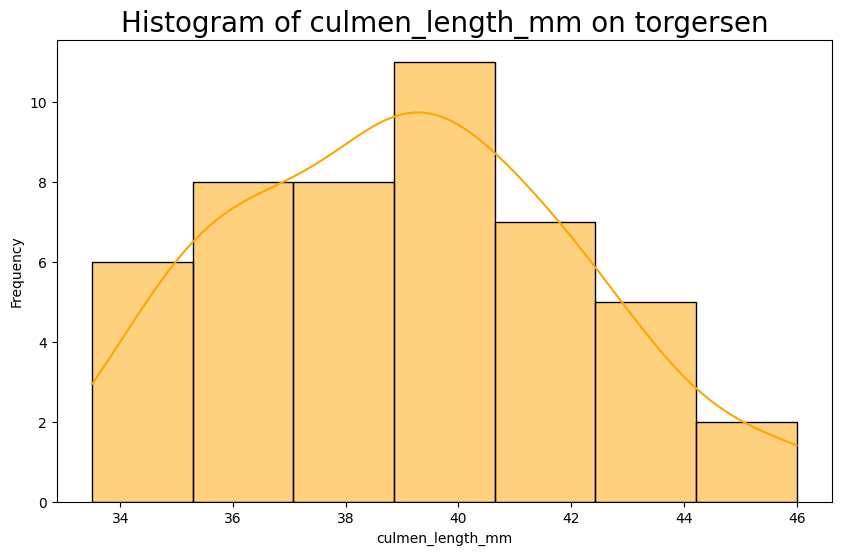

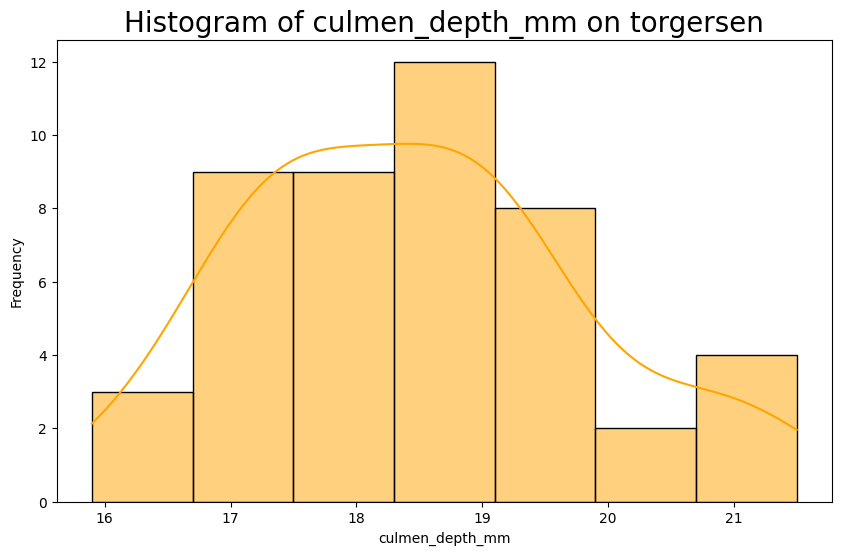

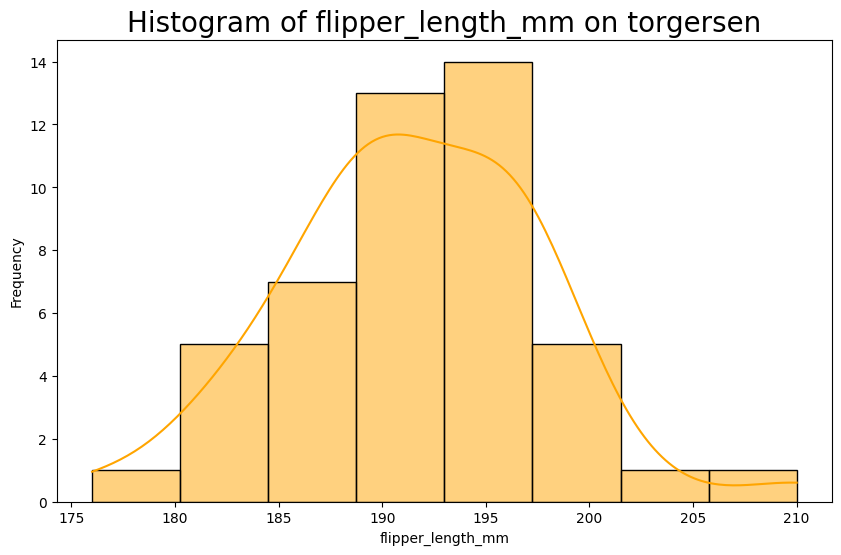

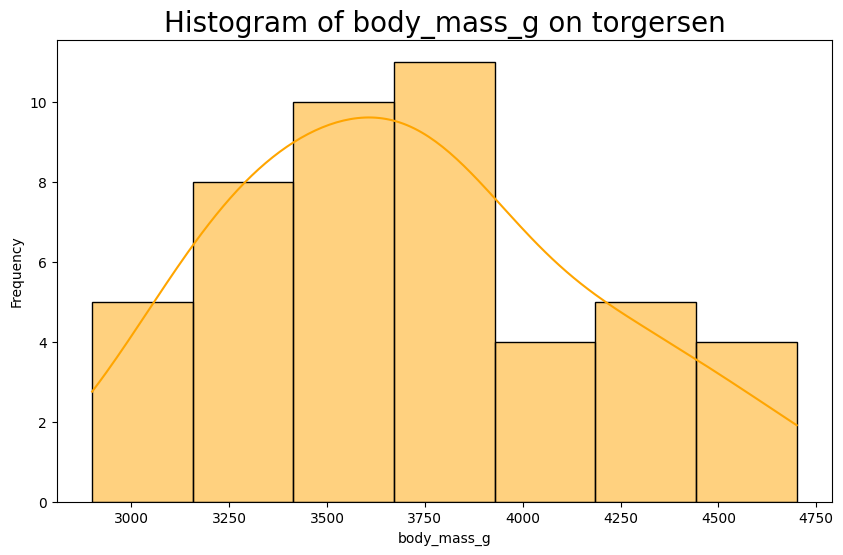

Visualizations for biscoe:


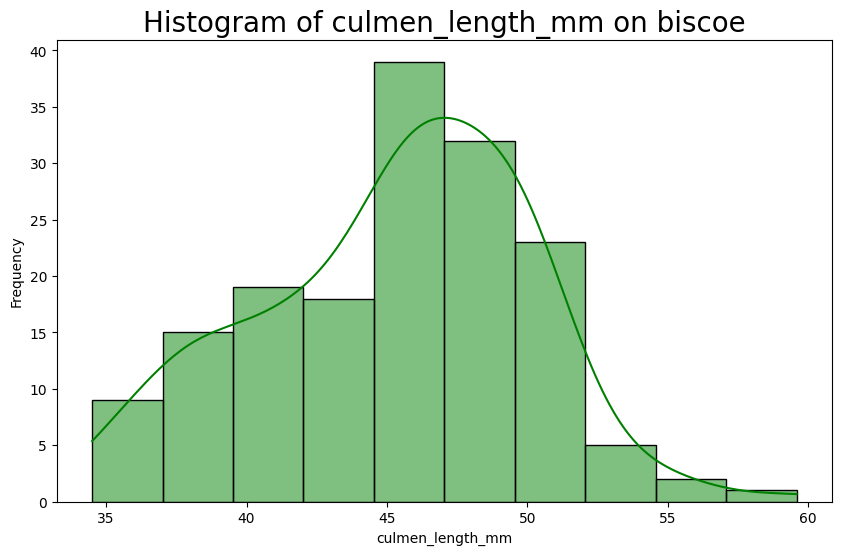

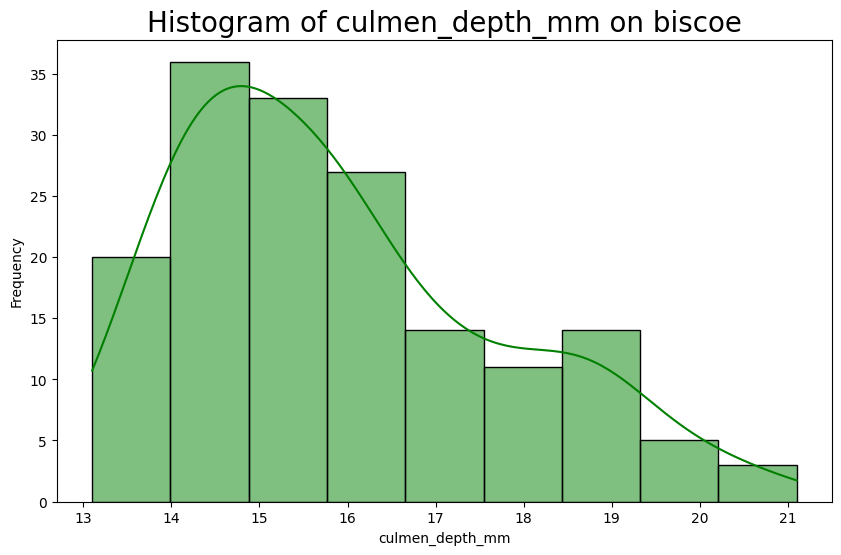

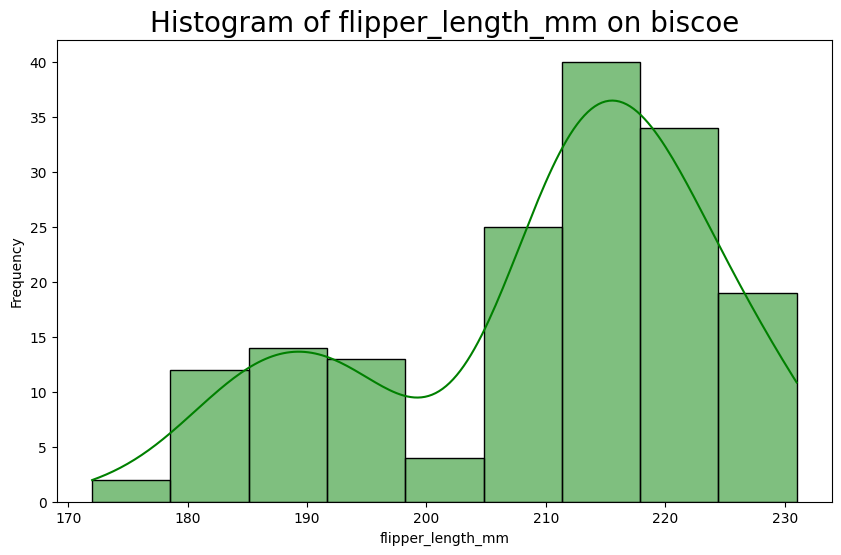

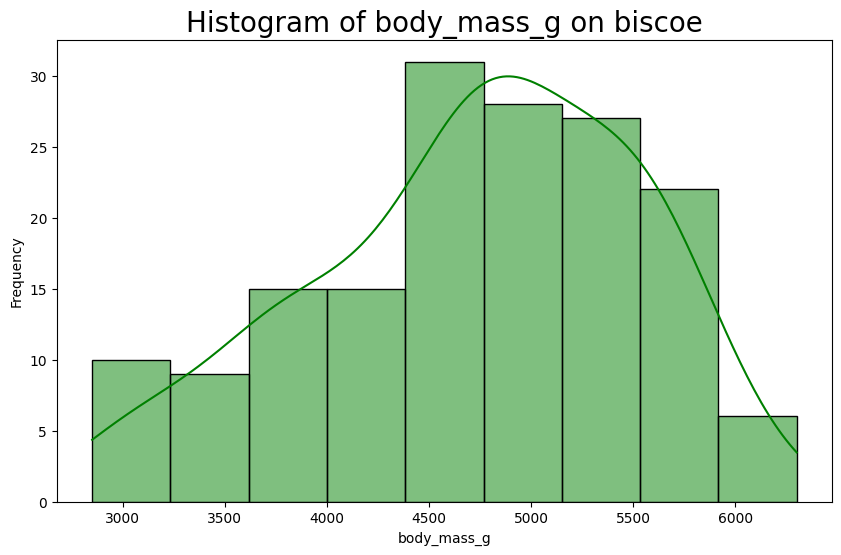

Visualizations for dream:


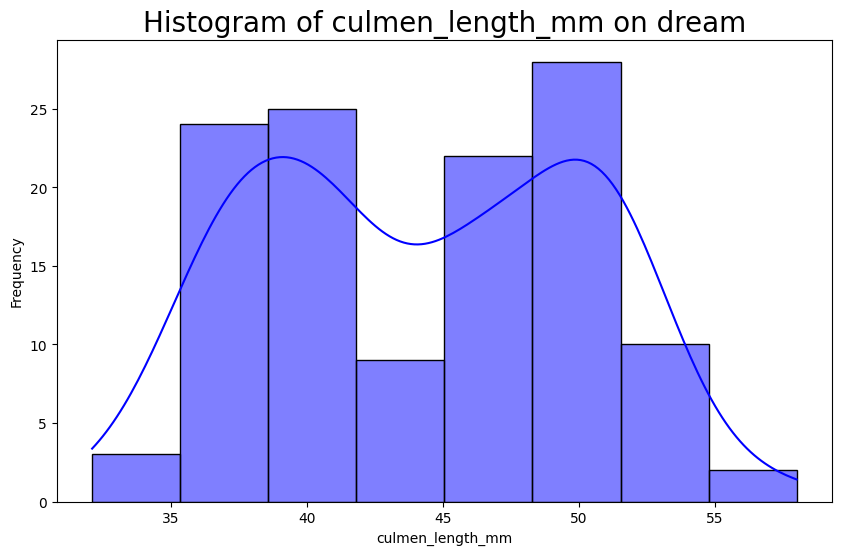

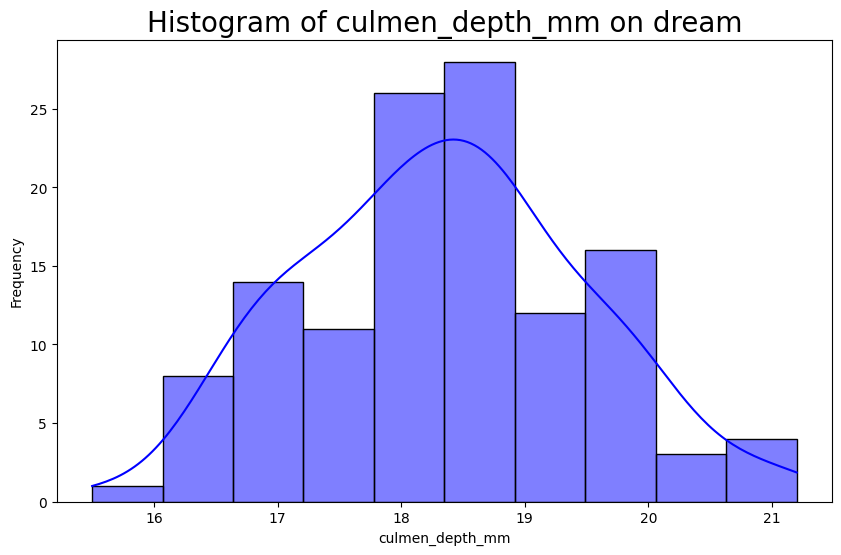

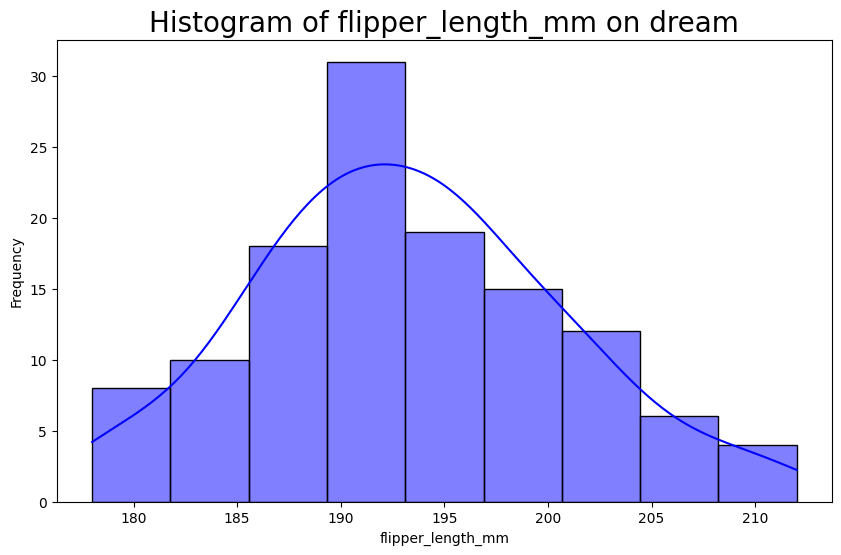

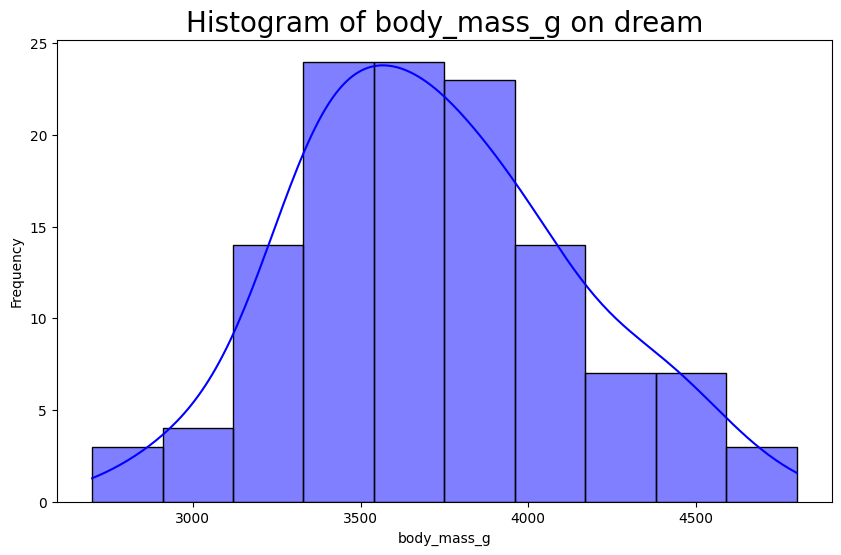

In [22]:
numerical_columns = [
    'culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g'
]
colors = {
    "dream": "blue",
    "torgersen": "orange",
    "biscoe": "green"
}
for island, df in island_dfs.items():
    print(f"Visualizations for {island}:")
    for col in numerical_columns:
        plt.figure(figsize=(10, 6))  
        sns.histplot(df[col], kde=True, color=colors[island])  
        plt.title(f"Histogram of {col} on {island}", fontsize=20)
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

In [23]:
def create_species_dfs(df):
    species_list = df['species'].unique()
    species_dfs = {species: df[df['species'] == species] for species in species_list}
    return species_list, species_dfs

species_list, species_dfs = create_species_dfs(df1)

Visualizations for adelie species:


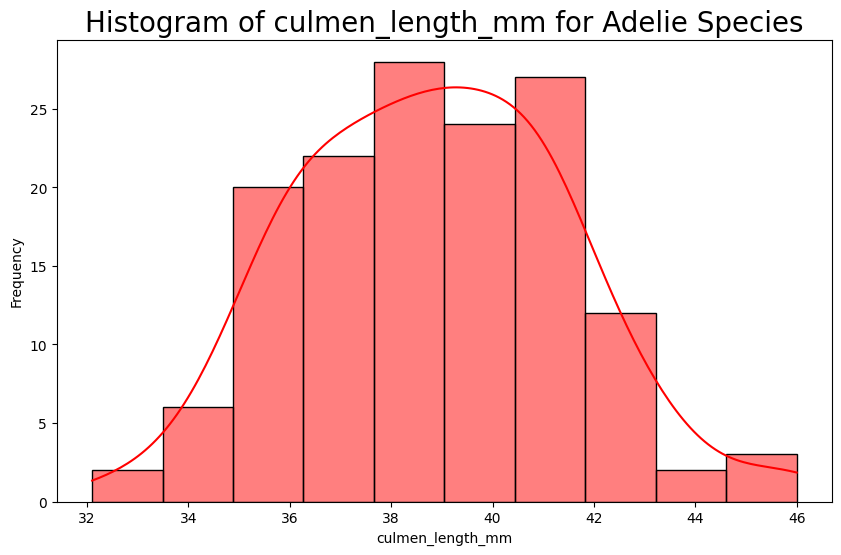

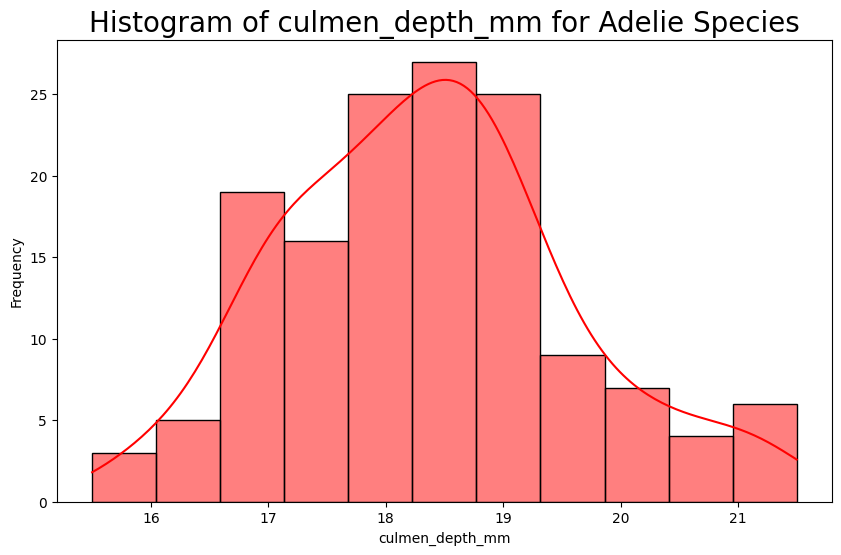

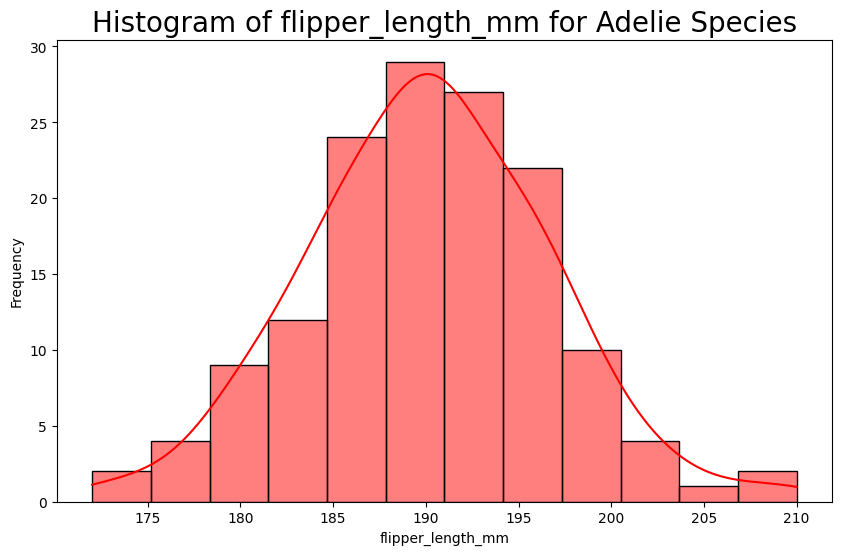

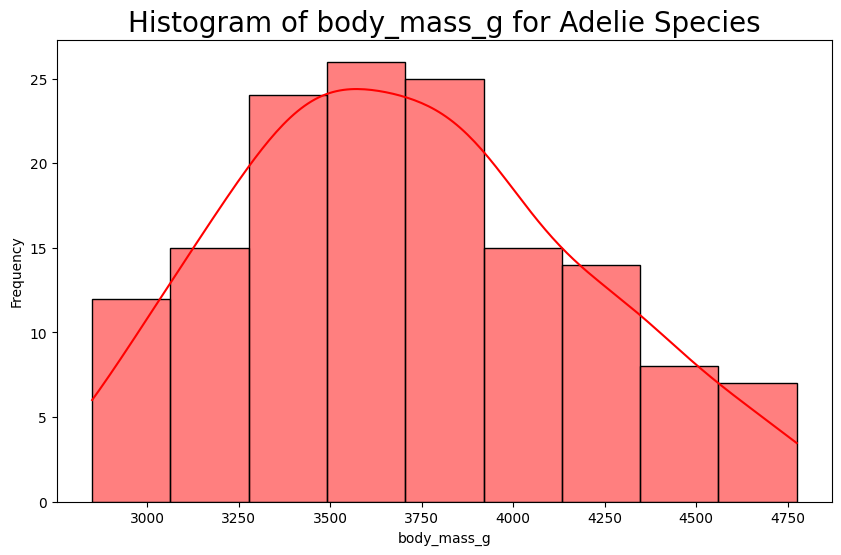

Visualizations for chinstrap species:


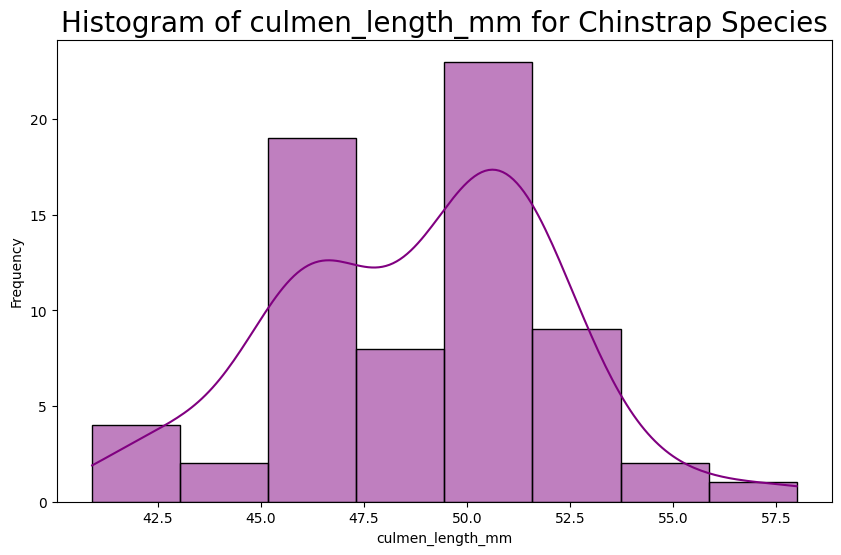

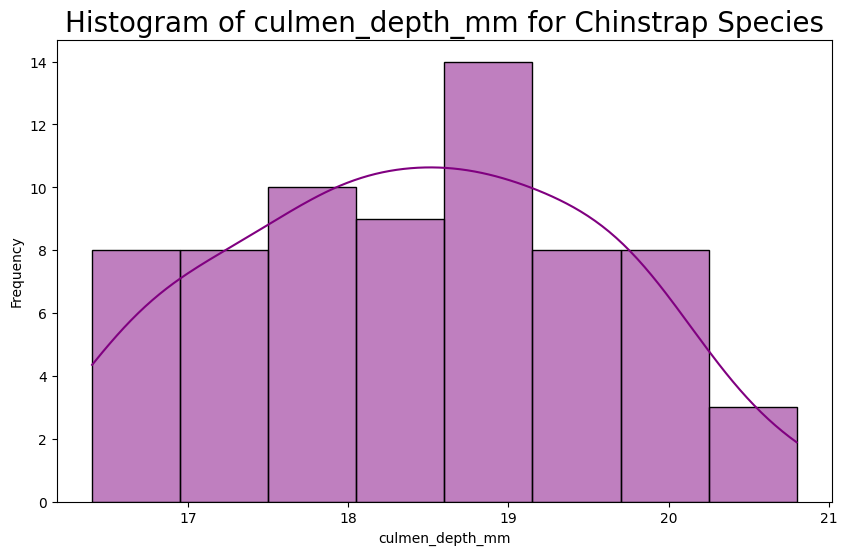

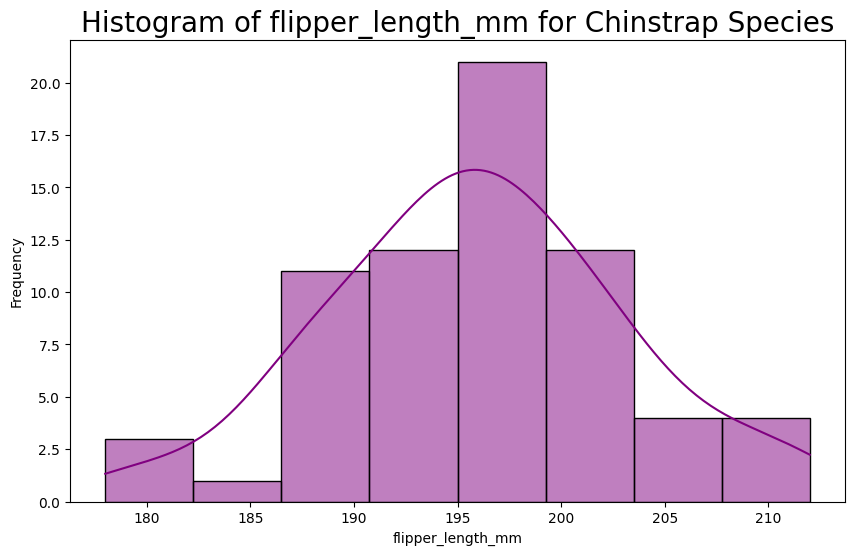

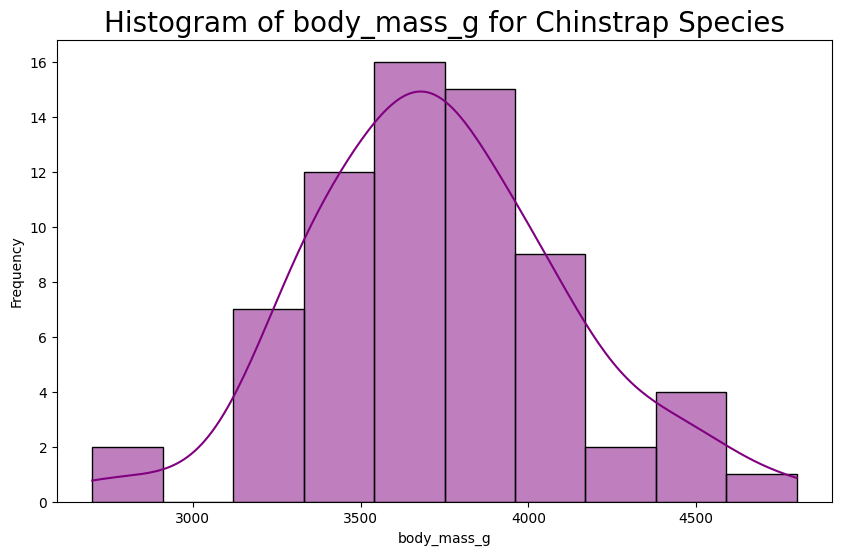

Visualizations for gentoo species:


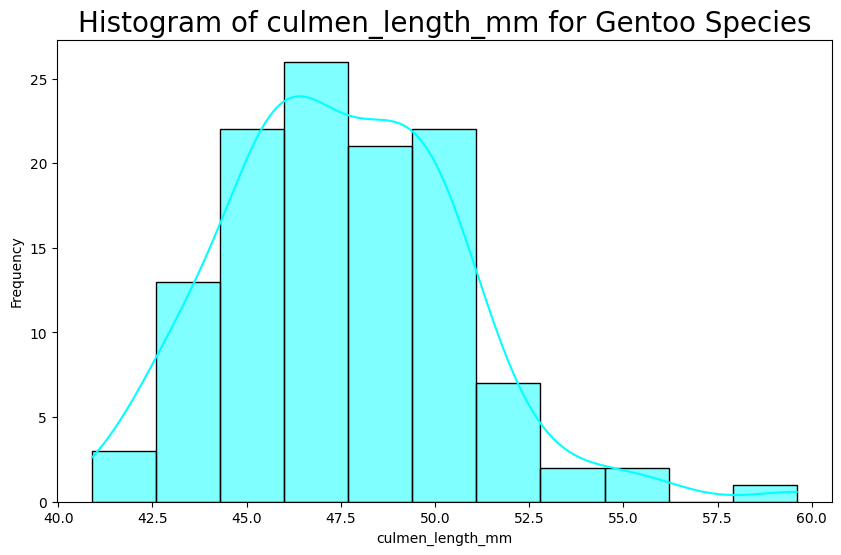

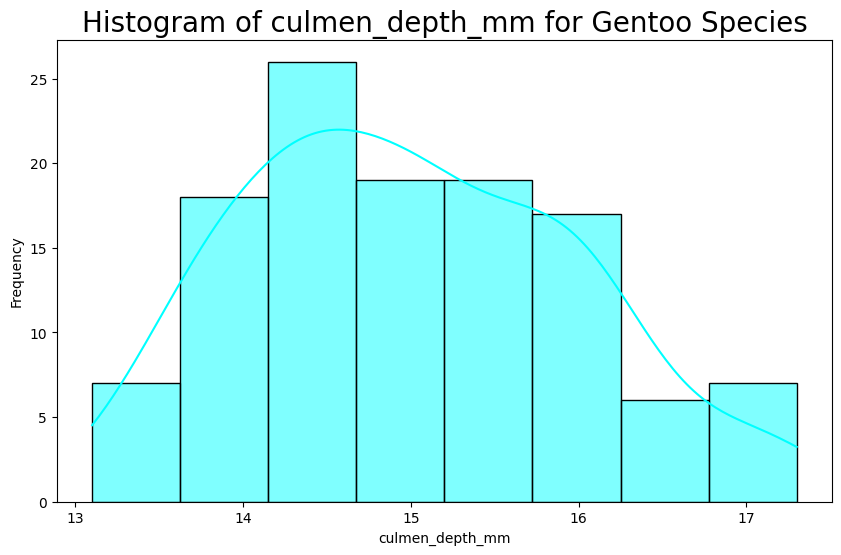

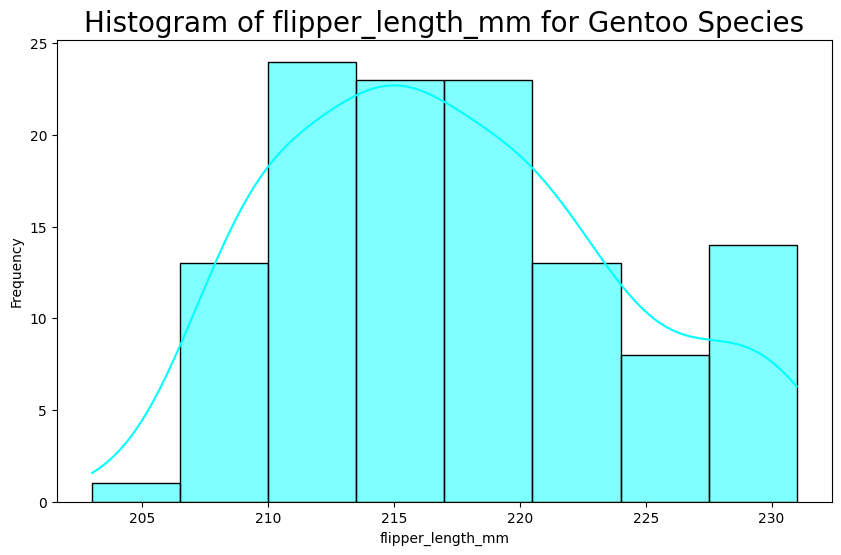

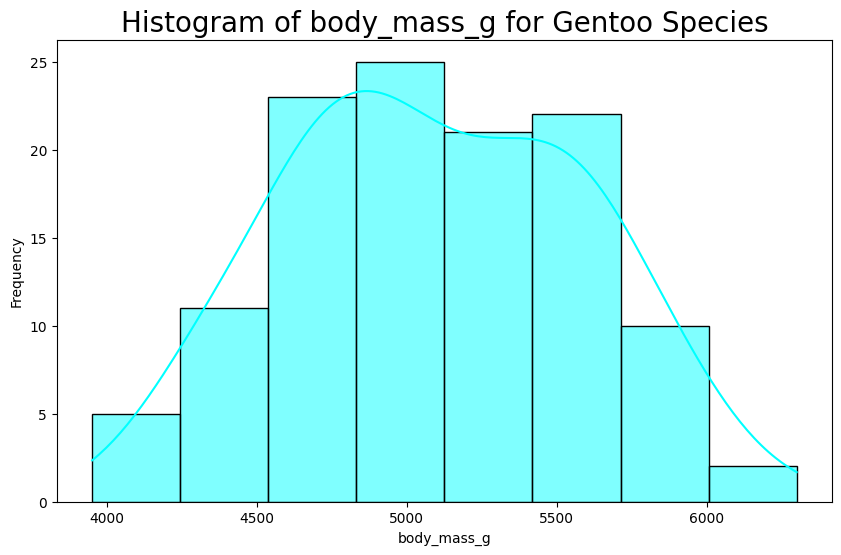

In [24]:
numerical_columns = [
    'culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g'
]
colors = {
    "adelie": "red",
    "chinstrap": "purple",
    "gentoo": "cyan"
}
for species, df in species_dfs.items():
    print(f"Visualizations for {species} species:")
    for col in numerical_columns:
        plt.figure(figsize=(10, 6)) 
        sns.histplot(df[col], kde=True, color=colors[species])  
        plt.title(f"Histogram of {col} for {species.capitalize()} Species", fontsize=20)
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

In [25]:
def create_species_gender_dfs(df):
    species_gender_dfs = {}
    for species in df['species'].unique():
        for gender in df['sex'].unique():
            key = f"{species}_{gender}"
            species_gender_dfs[key] = df[(df['species'] == species) & (df['sex'] == gender)]
    return species_gender_dfs

species_gender_dfs = create_species_gender_dfs(df1)

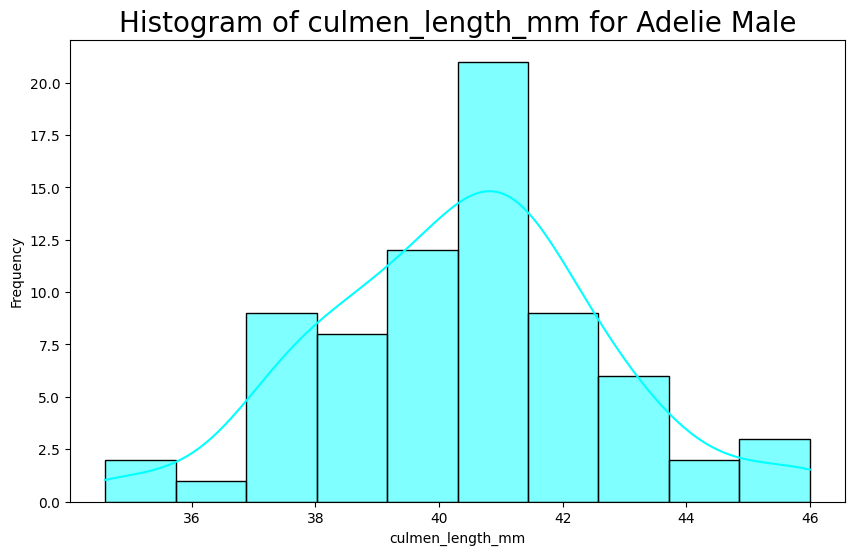

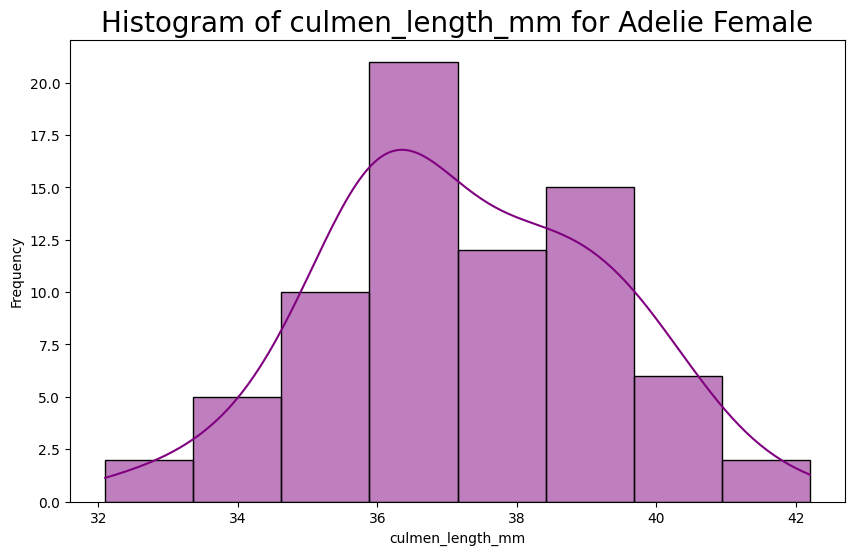

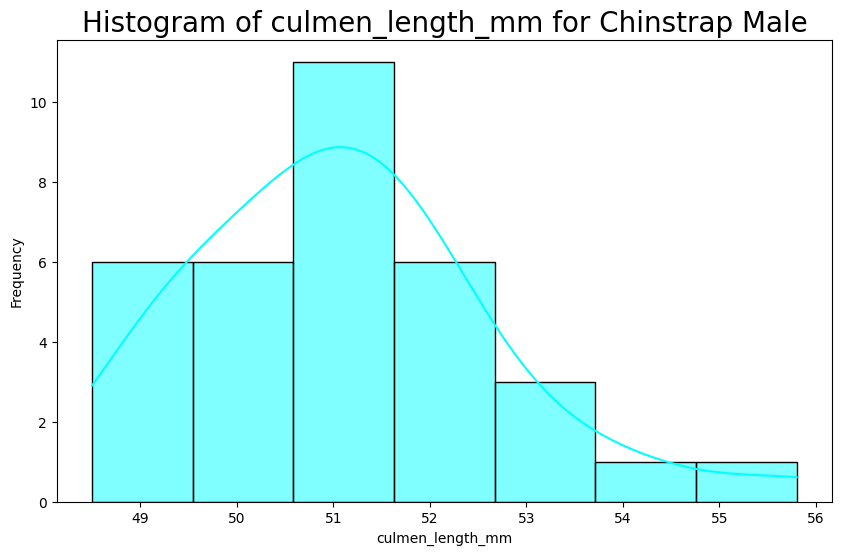

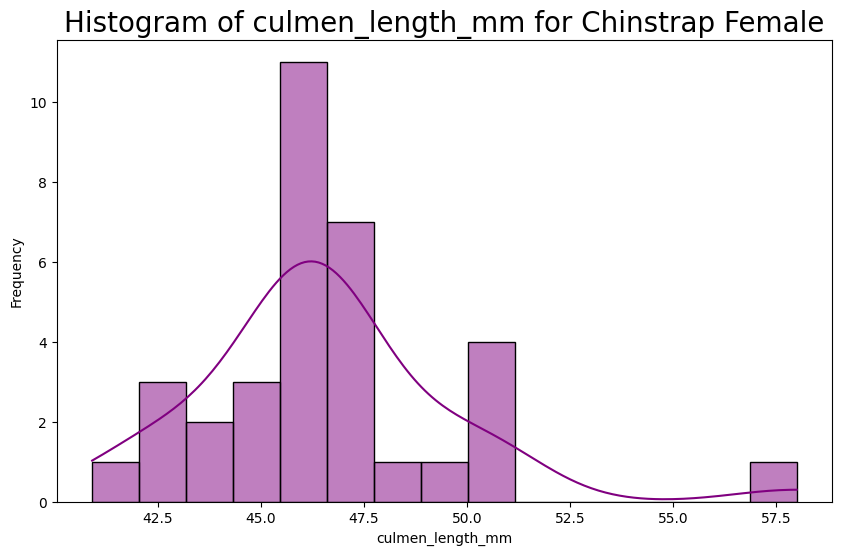

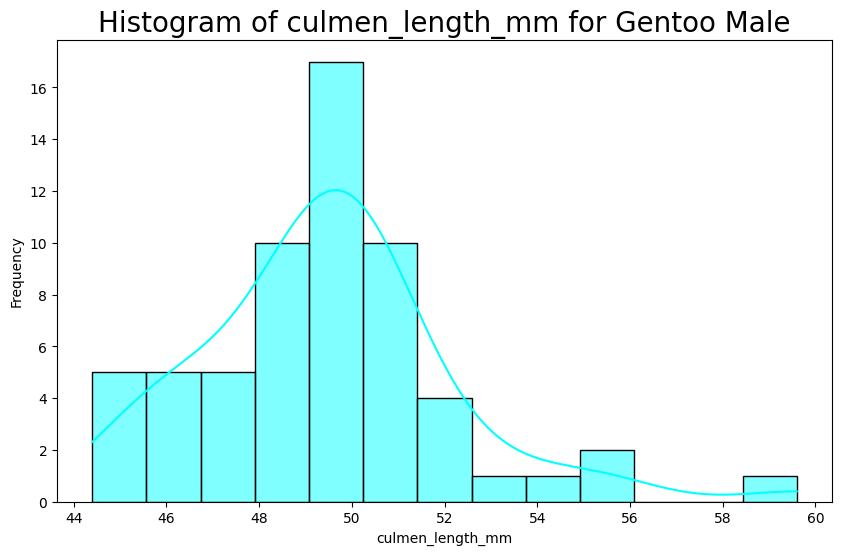

...

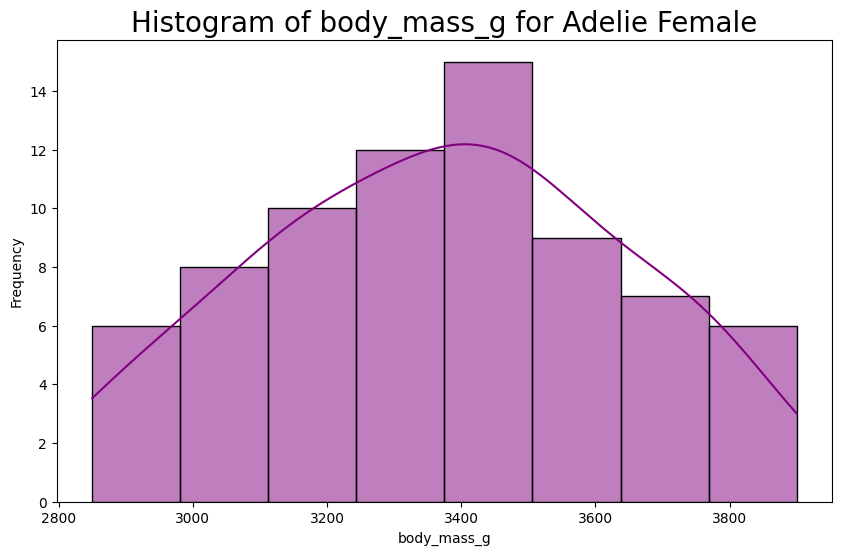

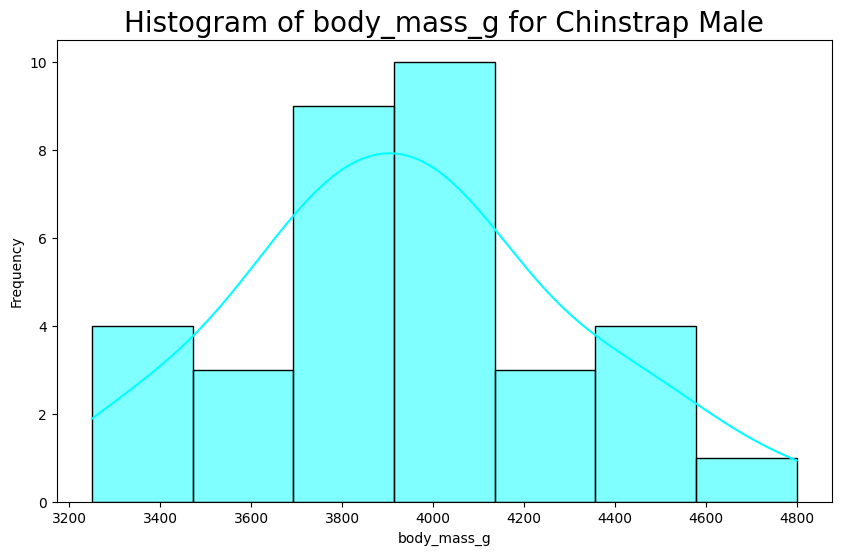

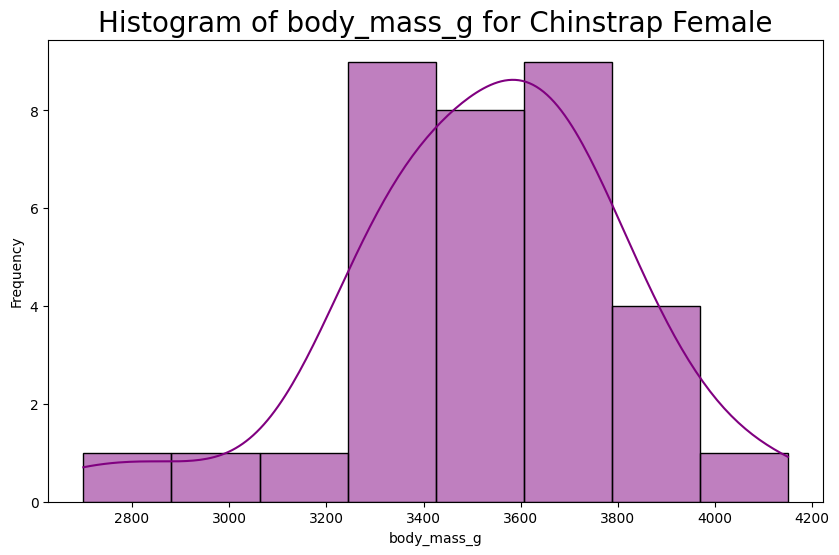

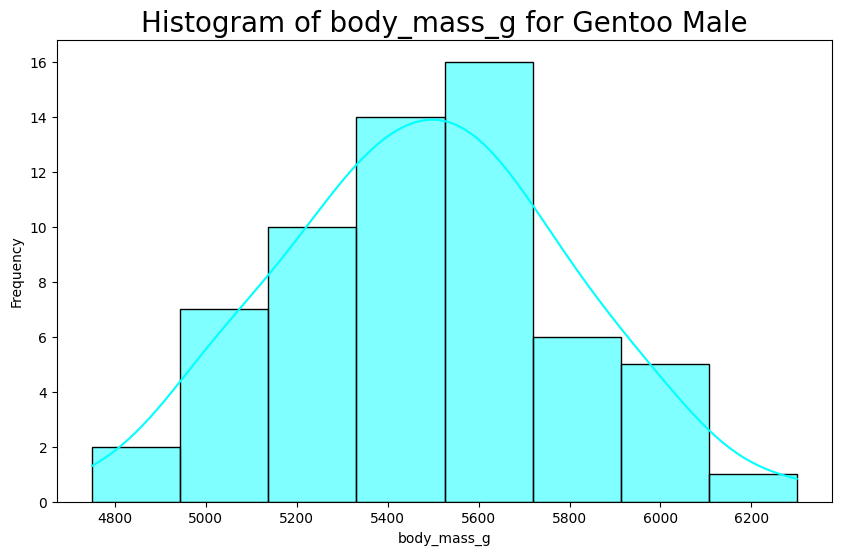

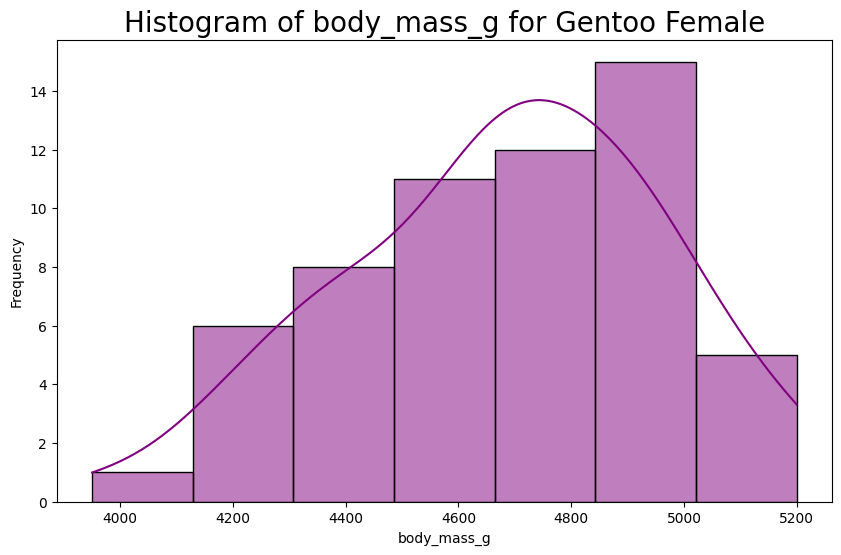

In [26]:
numerical_columns = [
    'culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g'
]
gender_colors = {
    "male": "cyan",
    "female": "purple"
}

for col in numerical_columns:
    for species in df1['species'].unique():
        for gender in ["male", "female"]:
            key = f"{species}_{gender}"
            df = species_gender_dfs.get(key)
            if df is not None and not df.empty:
                plt.figure(figsize=(10, 6))
                sns.histplot(df[col], kde=True, color=gender_colors[gender])
                plt.title(f"Histogram of {col} for {species.capitalize()} {gender.capitalize()}", fontsize=20)
                plt.xlabel(col)
                plt.ylabel('Frequency')
                plt.show()

In [27]:
def create_species_island_gender_dfs(df):
    species_island_gender_dfs = {}
    for species in df['species'].unique():
        for island in df['island'].unique():
            for gender in df['sex'].unique():
                key = f"{species}_{island}_{gender}"
                species_island_gender_dfs[key] = df[(df['species'] == species) & (df['island'] == island) & (df['sex'] == gender)]
    return species_island_gender_dfs
species_island_gender_dfs = create_species_island_gender_dfs(df1)

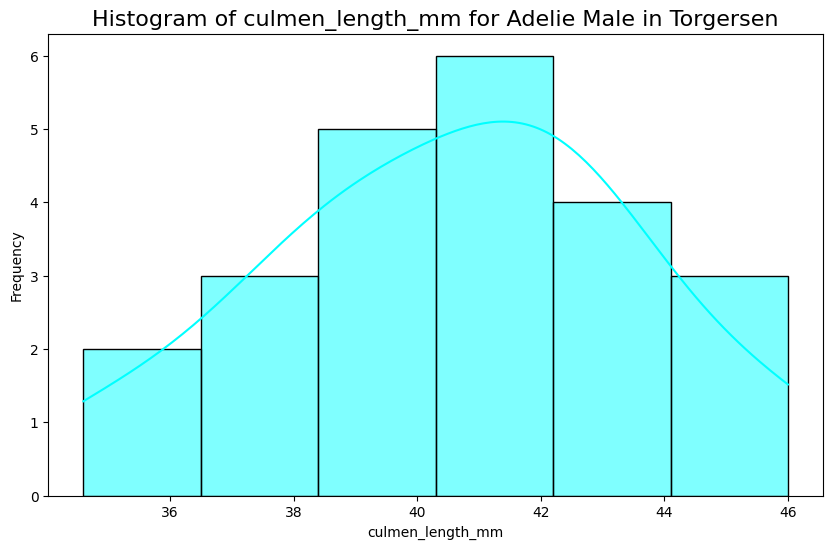

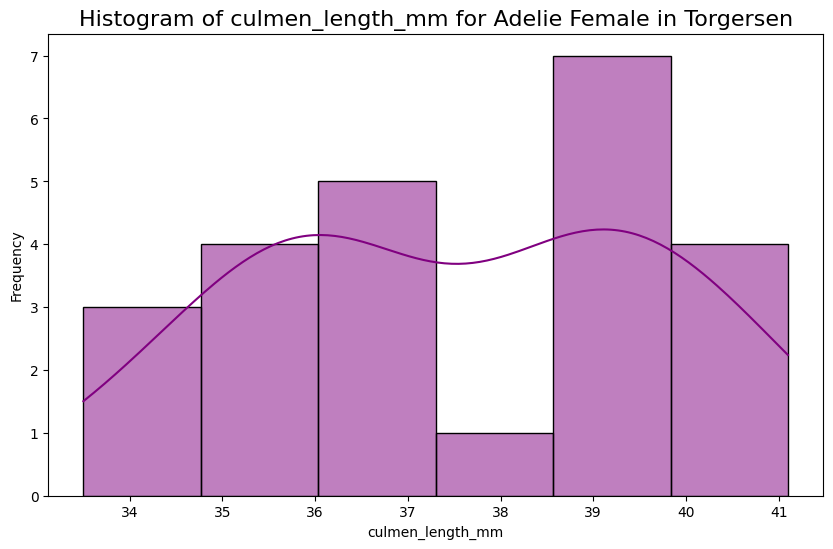

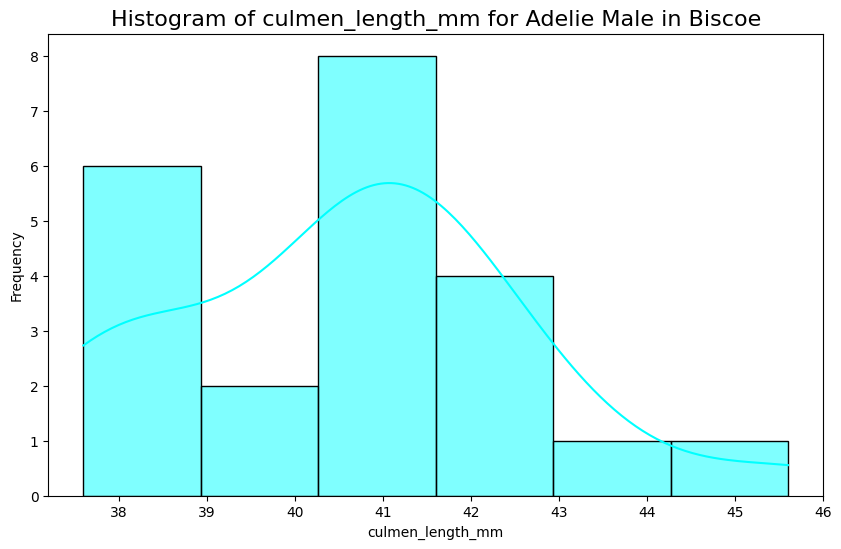

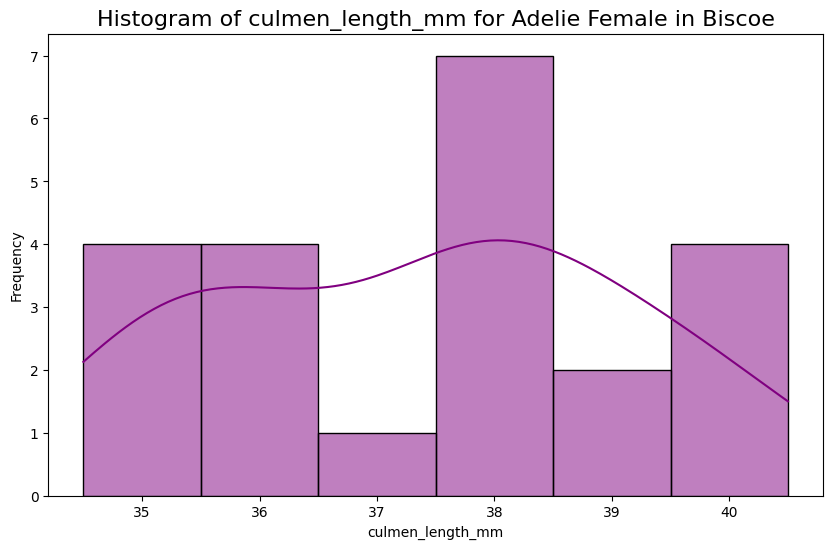

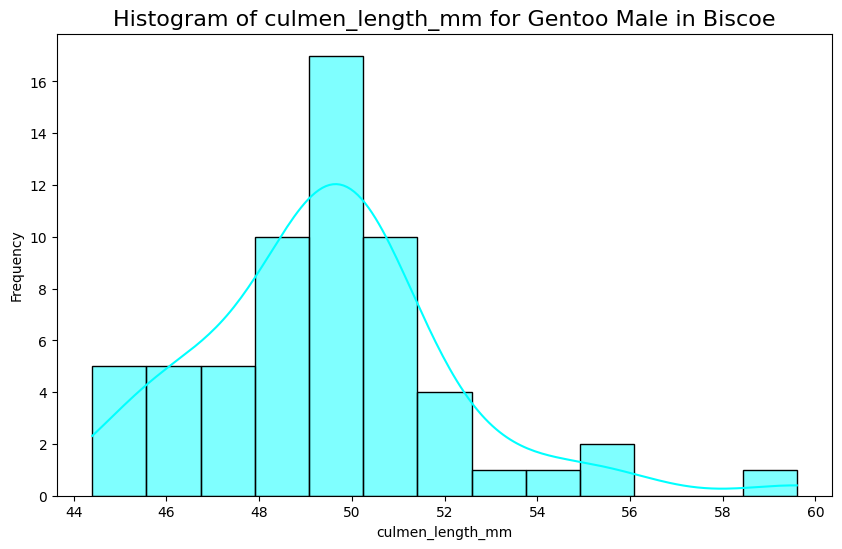

...

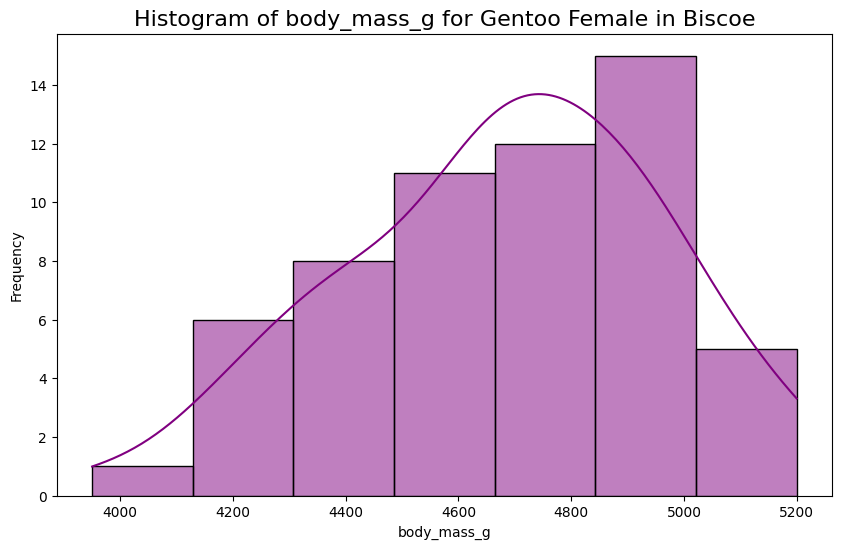

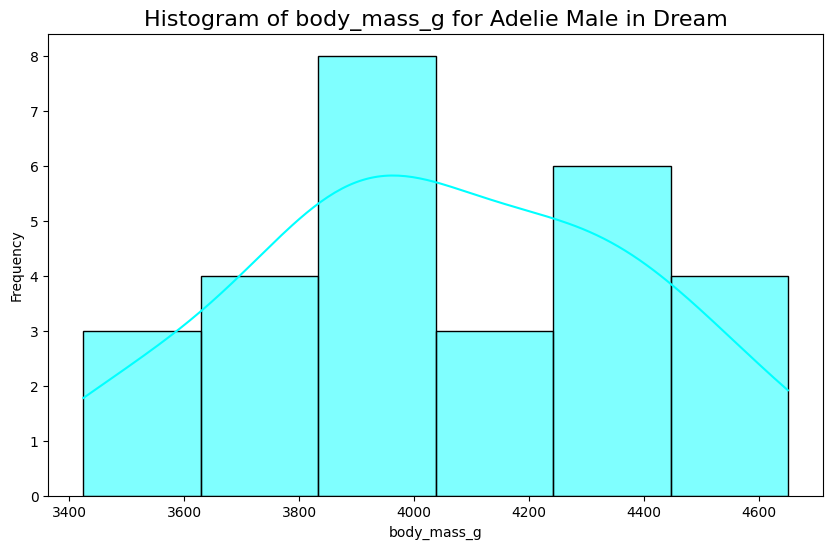

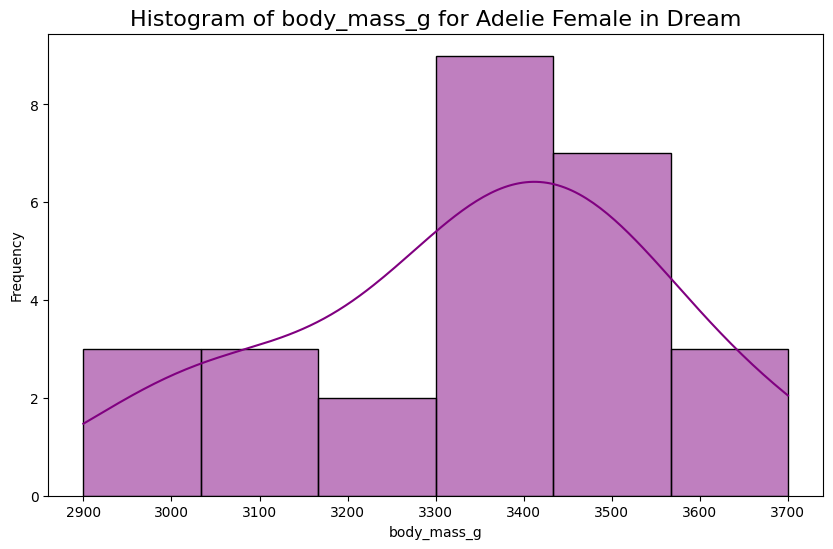

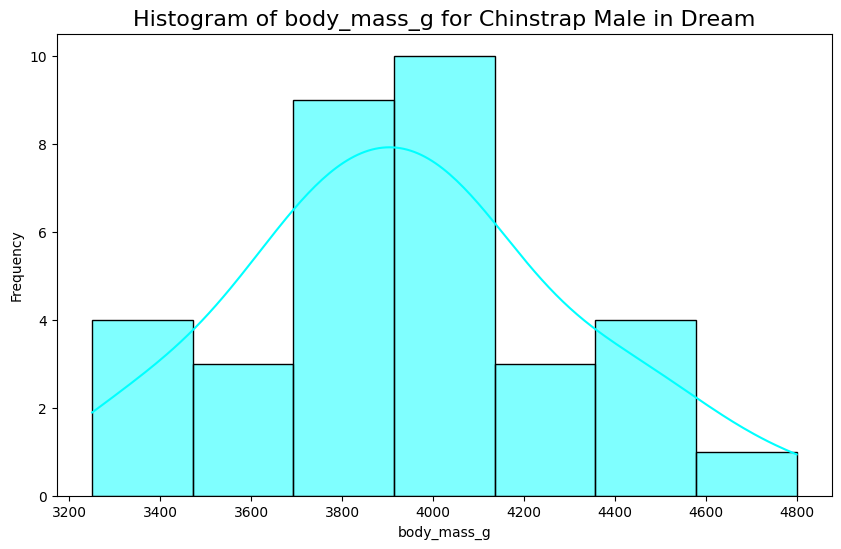

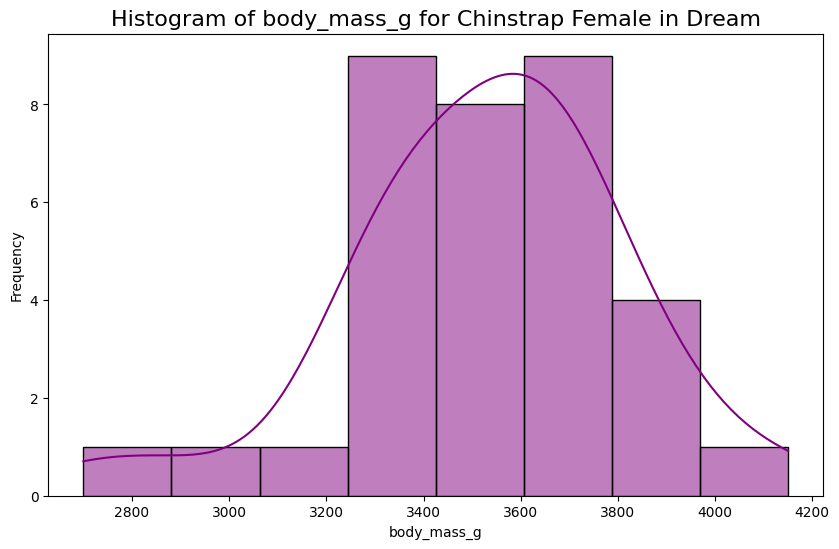

In [28]:
numerical_columns = [
    'culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g'
]
gender_colors = {
    "male": "cyan",
    "female": "purple"
}
for col in numerical_columns:
    for island in df1['island'].unique():
        for species in df1['species'].unique():
            for gender in ["male", "female"]:
                key = f"{species}_{island}_{gender}"
                df = species_island_gender_dfs.get(key)
                if df is not None and not df.empty:
                    plt.figure(figsize=(10, 6))
                    sns.histplot(df[col], kde=True, color=gender_colors[gender])
                    plt.title(f"Histogram of {col} for {species.capitalize()} {gender.capitalize()} in {island.capitalize()}", fontsize=16)
                    plt.xlabel(col)
                    plt.ylabel('Frequency')
                    plt.show()

# Statistical Analysis

In [29]:
def column_statistics(column):
    if not isinstance(column, pd.Series):
        column = pd.Series(column)
    
    mean = column.mean()
    median = column.median()
    mode = column.mode().tolist()  # Mode can be multi-modal
    std_dev = column.std()
    variance = column.var()
    data_range = column.max() - column.min()
    minimum = column.min()
    maximum = column.max()
    quartiles = column.quantile([0.25, 0.5, 0.75]).tolist()
    
    # Z-scores of each value per column
#    z_scores = stats.zscore(column)
    
    print(f"Mean: {mean}")
    print(f"Median: {median}")
    print(f"Mode: {mode}")
    print(f"Standard Deviation: {std_dev}")
    print(f"Variance: {variance}")
    print(f"Range: {data_range}")
    print(f"Minimum: {minimum}")
    print(f"Maximum: {maximum}")
    print(f"Quartiles (25%, 50%, 75%): {quartiles}")
#    print(f"Z-scores: [array] (Note: Z-scores represent how many standard deviations away each value is from the mean)")

    # Optional: return values in a structured form
    return {
        "mean": mean,
        "median": median,
        "mode": mode,
        "std_dev": std_dev,
        "variance": variance,
        "range": data_range,
        "min": minimum,
        "max": maximum,
        "quartiles": quartiles,
#        "z_scores": z_scores
    }

In [30]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [31]:
print("Statistics for the entire dataset (df1):")
for col in numerical_columns:
    print(f"\nColumn: {col}")
    column_statistics(df1[col])

Statistics for the entire dataset (df1):

Column: culmen_length_mm
Mean: 43.99279279279279
Median: 44.5
Mode: [41.1]
Standard Deviation: 5.468668342647559
Variance: 29.906333441875603
Range: 27.5
Minimum: 32.1
Maximum: 59.6
Quartiles (25%, 50%, 75%): [39.5, 44.5, 48.6]


{'mean': 43.99279279279279,
 'median': 44.5,
 'mode': [41.1],
 'std_dev': 5.468668342647559,
 'variance': 29.906333441875603,
 'range': 27.5,
 'min': 32.1,
 'max': 59.6,
 'quartiles': [39.5, 44.5, 48.6]}


Column: culmen_depth_mm
Mean: 17.164864864864864
Median: 17.3
Mode: [17.0]
Standard Deviation: 1.9692354633199007
Variance: 3.877888309996744
Range: 8.4
Minimum: 13.1
Maximum: 21.5
Quartiles (25%, 50%, 75%): [15.6, 17.3, 18.7]


{'mean': 17.164864864864864,
 'median': 17.3,
 'mode': [17.0],
 'std_dev': 1.9692354633199007,
 'variance': 3.877888309996744,
 'range': 8.4,
 'min': 13.1,
 'max': 21.5,
 'quartiles': [15.6, 17.3, 18.7]}


Column: flipper_length_mm
Mean: 200.96696696696696
Median: 197.0
Mode: [190.0]
Standard Deviation: 14.015765288287879
Variance: 196.44167661637542
Range: 59.0
Minimum: 172.0
Maximum: 231.0
Quartiles (25%, 50%, 75%): [190.0, 197.0, 213.0]


{'mean': 200.96696696696696,
 'median': 197.0,
 'mode': [190.0],
 'std_dev': 14.015765288287879,
 'variance': 196.44167661637542,
 'range': 59.0,
 'min': 172.0,
 'max': 231.0,
 'quartiles': [190.0, 197.0, 213.0]}


Column: body_mass_g
Mean: 4207.057057057057
Median: 4050.0
Mode: [3800.0]
Standard Deviation: 805.2158019428965
Variance: 648372.487698542
Range: 3600.0
Minimum: 2700.0
Maximum: 6300.0
Quartiles (25%, 50%, 75%): [3550.0, 4050.0, 4775.0]


{'mean': 4207.057057057057,
 'median': 4050.0,
 'mode': [3800.0],
 'std_dev': 805.2158019428965,
 'variance': 648372.487698542,
 'range': 3600.0,
 'min': 2700.0,
 'max': 6300.0,
 'quartiles': [3550.0, 4050.0, 4775.0]}

In [32]:
print("\nStatistics per species:")
for species, df in species_dfs.items():
    print(f"\nSpecies: {species}")
    for col in numerical_columns:
        print(f"Column: {col}")
        column_statistics(df[col])


Statistics per species:

Species: adelie
Column: culmen_length_mm
Mean: 38.82397260273973
Median: 38.849999999999994
Mode: [41.1]
Standard Deviation: 2.662596730819061
Variance: 7.089421350968352
Range: 13.899999999999999
Minimum: 32.1
Maximum: 46.0
Quartiles (25%, 50%, 75%): [36.725, 38.849999999999994, 40.775]


{'mean': 38.82397260273973,
 'median': 38.849999999999994,
 'mode': [41.1],
 'std_dev': 2.662596730819061,
 'variance': 7.089421350968352,
 'range': 13.899999999999999,
 'min': 32.1,
 'max': 46.0,
 'quartiles': [36.725, 38.849999999999994, 40.775]}

Column: culmen_depth_mm
Mean: 18.3472602739726
Median: 18.4
Mode: [18.5]
Standard Deviation: 1.2193381588318202
Variance: 1.486785545583373
Range: 6.0
Minimum: 15.5
Maximum: 21.5
Quartiles (25%, 50%, 75%): [17.5, 18.4, 19.0]


{'mean': 18.3472602739726,
 'median': 18.4,
 'mode': [18.5],
 'std_dev': 1.2193381588318202,
 'variance': 1.486785545583373,
 'range': 6.0,
 'min': 15.5,
 'max': 21.5,
 'quartiles': [17.5, 18.4, 19.0]}

Column: flipper_length_mm
Mean: 190.1027397260274
Median: 190.0
Mode: [190.0]
Standard Deviation: 6.521824847286749
Variance: 42.534199338686825
Range: 38.0
Minimum: 172.0
Maximum: 210.0
Quartiles (25%, 50%, 75%): [186.0, 190.0, 195.0]


{'mean': 190.1027397260274,
 'median': 190.0,
 'mode': [190.0],
 'std_dev': 6.521824847286749,
 'variance': 42.534199338686825,
 'range': 38.0,
 'min': 172.0,
 'max': 210.0,
 'quartiles': [186.0, 190.0, 195.0]}

Column: body_mass_g
Mean: 3706.1643835616437
Median: 3700.0
Mode: [3550.0, 3800.0, 3900.0]
Standard Deviation: 458.6201347129236
Variance: 210332.42796410015
Range: 1925.0
Minimum: 2850.0
Maximum: 4775.0
Quartiles (25%, 50%, 75%): [3362.5, 3700.0, 4000.0]


{'mean': 3706.1643835616437,
 'median': 3700.0,
 'mode': [3550.0, 3800.0, 3900.0],
 'std_dev': 458.6201347129236,
 'variance': 210332.42796410015,
 'range': 1925.0,
 'min': 2850.0,
 'max': 4775.0,
 'quartiles': [3362.5, 3700.0, 4000.0]}


Species: chinstrap
Column: culmen_length_mm
Mean: 48.83382352941177
Median: 49.55
Mode: [51.3, 52.0]
Standard Deviation: 3.3392558959358865
Variance: 11.15062993854258
Range: 17.1
Minimum: 40.9
Maximum: 58.0
Quartiles (25%, 50%, 75%): [46.35, 49.55, 51.075]


{'mean': 48.83382352941177,
 'median': 49.55,
 'mode': [51.3, 52.0],
 'std_dev': 3.3392558959358865,
 'variance': 11.15062993854258,
 'range': 17.1,
 'min': 40.9,
 'max': 58.0,
 'quartiles': [46.35, 49.55, 51.075]}

Column: culmen_depth_mm
Mean: 18.42058823529412
Median: 18.45
Mode: [17.3]
Standard Deviation: 1.1353951016604091
Variance: 1.289122036874451
Range: 4.400000000000002
Minimum: 16.4
Maximum: 20.8
Quartiles (25%, 50%, 75%): [17.5, 18.45, 19.4]


{'mean': 18.42058823529412,
 'median': 18.45,
 'mode': [17.3],
 'std_dev': 1.1353951016604091,
 'variance': 1.289122036874451,
 'range': 4.400000000000002,
 'min': 16.4,
 'max': 20.8,
 'quartiles': [17.5, 18.45, 19.4]}

Column: flipper_length_mm
Mean: 195.8235294117647
Median: 196.0
Mode: [187.0, 195.0]
Standard Deviation: 7.131894258578147
Variance: 50.863915715539946
Range: 34.0
Minimum: 178.0
Maximum: 212.0
Quartiles (25%, 50%, 75%): [191.0, 196.0, 201.0]


{'mean': 195.8235294117647,
 'median': 196.0,
 'mode': [187.0, 195.0],
 'std_dev': 7.131894258578147,
 'variance': 50.863915715539946,
 'range': 34.0,
 'min': 178.0,
 'max': 212.0,
 'quartiles': [191.0, 196.0, 201.0]}

Column: body_mass_g
Mean: 3733.0882352941176
Median: 3700.0
Mode: [3400.0, 3650.0, 3700.0, 3800.0, 3950.0, 4050.0]
Standard Deviation: 384.3350813871914
Variance: 147713.45478489902
Range: 2100.0
Minimum: 2700.0
Maximum: 4800.0
Quartiles (25%, 50%, 75%): [3487.5, 3700.0, 3950.0]


{'mean': 3733.0882352941176,
 'median': 3700.0,
 'mode': [3400.0, 3650.0, 3700.0, 3800.0, 3950.0, 4050.0],
 'std_dev': 384.3350813871914,
 'variance': 147713.45478489902,
 'range': 2100.0,
 'min': 2700.0,
 'max': 4800.0,
 'quartiles': [3487.5, 3700.0, 3950.0]}


Species: gentoo
Column: culmen_length_mm
Mean: 47.568067226890754
Median: 47.4
Mode: [45.2, 45.5, 46.5, 50.0]
Standard Deviation: 3.1061156944496857
Variance: 9.647954707306653
Range: 18.700000000000003
Minimum: 40.9
Maximum: 59.6
Quartiles (25%, 50%, 75%): [45.349999999999994, 47.4, 49.6]


{'mean': 47.568067226890754,
 'median': 47.4,
 'mode': [45.2, 45.5, 46.5, 50.0],
 'std_dev': 3.1061156944496857,
 'variance': 9.647954707306653,
 'range': 18.700000000000003,
 'min': 40.9,
 'max': 59.6,
 'quartiles': [45.349999999999994, 47.4, 49.6]}

Column: culmen_depth_mm
Mean: 14.996638655462187
Median: 15.0
Mode: [15.0]
Standard Deviation: 0.9859979692891081
Variance: 0.9721919954422449
Range: 4.200000000000001
Minimum: 13.1
Maximum: 17.3
Quartiles (25%, 50%, 75%): [14.2, 15.0, 15.75]


{'mean': 14.996638655462187,
 'median': 15.0,
 'mode': [15.0],
 'std_dev': 0.9859979692891081,
 'variance': 0.9721919954422449,
 'range': 4.200000000000001,
 'min': 13.1,
 'max': 17.3,
 'quartiles': [14.2, 15.0, 15.75]}

Column: flipper_length_mm
Mean: 217.23529411764707
Median: 216.0
Mode: [215.0]
Standard Deviation: 6.5854306093881805
Variance: 43.36789631106679
Range: 28.0
Minimum: 203.0
Maximum: 231.0
Quartiles (25%, 50%, 75%): [212.0, 216.0, 221.5]


{'mean': 217.23529411764707,
 'median': 216.0,
 'mode': [215.0],
 'std_dev': 6.5854306093881805,
 'variance': 43.36789631106679,
 'range': 28.0,
 'min': 203.0,
 'max': 231.0,
 'quartiles': [212.0, 216.0, 221.5]}

Column: body_mass_g
Mean: 5092.436974789916
Median: 5050.0
Mode: [5000.0, 5550.0]
Standard Deviation: 501.47615382844185
Variance: 251478.3328585671
Range: 2350.0
Minimum: 3950.0
Maximum: 6300.0
Quartiles (25%, 50%, 75%): [4700.0, 5050.0, 5500.0]


{'mean': 5092.436974789916,
 'median': 5050.0,
 'mode': [5000.0, 5550.0],
 'std_dev': 501.47615382844185,
 'variance': 251478.3328585671,
 'range': 2350.0,
 'min': 3950.0,
 'max': 6300.0,
 'quartiles': [4700.0, 5050.0, 5500.0]}

In [33]:
print("\nStatistics per island:")
for island, df in island_dfs.items():
    print(f"\nIsland: {island}")
    for col in numerical_columns:
        print(f"Column: {col}")
        column_statistics(df[col])



Statistics per island:

Island: torgersen
Column: culmen_length_mm
Mean: 39.038297872340415
Median: 39.0
Mode: [34.6, 36.2, 36.7, 38.6, 41.1]
Standard Deviation: 3.028096919324323
Variance: 9.169370952821456
Range: 12.5
Minimum: 33.5
Maximum: 46.0
Quartiles (25%, 50%, 75%): [36.650000000000006, 39.0, 41.1]


{'mean': 39.038297872340415,
 'median': 39.0,
 'mode': [34.6, 36.2, 36.7, 38.6, 41.1],
 'std_dev': 3.028096919324323,
 'variance': 9.169370952821456,
 'range': 12.5,
 'min': 33.5,
 'max': 46.0,
 'quartiles': [36.650000000000006, 39.0, 41.1]}

Column: culmen_depth_mm
Mean: 18.451063829787234
Median: 18.4
Mode: [17.0, 17.2, 17.6, 19.0, 19.4]
Standard Deviation: 1.3464724186176473
Variance: 1.812987974098057
Range: 5.6
Minimum: 15.9
Maximum: 21.5
Quartiles (25%, 50%, 75%): [17.45, 18.4, 19.25]


{'mean': 18.451063829787234,
 'median': 18.4,
 'mode': [17.0, 17.2, 17.6, 19.0, 19.4],
 'std_dev': 1.3464724186176473,
 'variance': 1.812987974098057,
 'range': 5.6,
 'min': 15.9,
 'max': 21.5,
 'quartiles': [17.45, 18.4, 19.25]}

Column: flipper_length_mm
Mean: 191.53191489361703
Median: 191.0
Mode: [190.0, 195.0]
Standard Deviation: 6.220062434433566
Variance: 38.68917668825162
Range: 34.0
Minimum: 176.0
Maximum: 210.0
Quartiles (25%, 50%, 75%): [187.5, 191.0, 195.5]


{'mean': 191.53191489361703,
 'median': 191.0,
 'mode': [190.0, 195.0],
 'std_dev': 6.220062434433566,
 'variance': 38.68917668825162,
 'range': 34.0,
 'min': 176.0,
 'max': 210.0,
 'quartiles': [187.5, 191.0, 195.5]}

Column: body_mass_g
Mean: 3708.5106382978724
Median: 3700.0
Mode: [3050.0, 3325.0, 3450.0, 3700.0, 3800.0, 4000.0]
Standard Deviation: 451.8463509694045
Variance: 204165.1248843663
Range: 1800.0
Minimum: 2900.0
Maximum: 4700.0
Quartiles (25%, 50%, 75%): [3337.5, 3700.0, 4000.0]


{'mean': 3708.5106382978724,
 'median': 3700.0,
 'mode': [3050.0, 3325.0, 3450.0, 3700.0, 3800.0, 4000.0],
 'std_dev': 451.8463509694045,
 'variance': 204165.1248843663,
 'range': 1800.0,
 'min': 2900.0,
 'max': 4700.0,
 'quartiles': [3337.5, 3700.0, 4000.0]}


Island: biscoe
Column: culmen_length_mm
Mean: 45.24846625766871
Median: 45.8
Mode: [45.2, 45.5, 46.5, 50.0]
Standard Deviation: 4.827318809895711
Variance: 23.303006892372945
Range: 25.1
Minimum: 34.5
Maximum: 59.6
Quartiles (25%, 50%, 75%): [41.85, 45.8, 48.75]


{'mean': 45.24846625766871,
 'median': 45.8,
 'mode': [45.2, 45.5, 46.5, 50.0],
 'std_dev': 4.827318809895711,
 'variance': 23.303006892372945,
 'range': 25.1,
 'min': 34.5,
 'max': 59.6,
 'quartiles': [41.85, 45.8, 48.75]}

Column: culmen_depth_mm
Mean: 15.907361963190182
Median: 15.6
Mode: [15.0]
Standard Deviation: 1.8276530954504748
Variance: 3.3403158373097024
Range: 8.000000000000002
Minimum: 13.1
Maximum: 21.1
Quartiles (25%, 50%, 75%): [14.5, 15.6, 17.0]


{'mean': 15.907361963190182,
 'median': 15.6,
 'mode': [15.0],
 'std_dev': 1.8276530954504748,
 'variance': 3.3403158373097024,
 'range': 8.000000000000002,
 'min': 13.1,
 'max': 21.1,
 'quartiles': [14.5, 15.6, 17.0]}

Column: flipper_length_mm
Mean: 209.55828220858896
Median: 213.0
Mode: [215.0]
Standard Deviation: 14.282467089644571
Variance: 203.98886616678027
Range: 59.0
Minimum: 172.0
Maximum: 231.0
Quartiles (25%, 50%, 75%): [198.5, 213.0, 220.0]


{'mean': 209.55828220858896,
 'median': 213.0,
 'mode': [215.0],
 'std_dev': 14.282467089644571,
 'variance': 203.98886616678027,
 'range': 59.0,
 'min': 172.0,
 'max': 231.0,
 'quartiles': [198.5, 213.0, 220.0]}

Column: body_mass_g
Mean: 4719.171779141105
Median: 4800.0
Mode: [5000.0, 5550.0]
Standard Deviation: 790.8600693688636
Variance: 625459.6493221237
Range: 3450.0
Minimum: 2850.0
Maximum: 6300.0
Quartiles (25%, 50%, 75%): [4200.0, 4800.0, 5350.0]


{'mean': 4719.171779141105,
 'median': 4800.0,
 'mode': [5000.0, 5550.0],
 'std_dev': 790.8600693688636,
 'variance': 625459.6493221237,
 'range': 3450.0,
 'min': 2850.0,
 'max': 6300.0,
 'quartiles': [4200.0, 4800.0, 5350.0]}


Island: dream
Column: culmen_length_mm
Mean: 44.221951219512206
Median: 45.2
Mode: [36.0]
Standard Deviation: 5.947068937587711
Variance: 35.36762894842063
Range: 25.9
Minimum: 32.1
Maximum: 58.0
Quartiles (25%, 50%, 75%): [39.2, 45.2, 49.9]


{'mean': 44.221951219512206,
 'median': 45.2,
 'mode': [36.0],
 'std_dev': 5.947068937587711,
 'variance': 35.36762894842063,
 'range': 25.9,
 'min': 32.1,
 'max': 58.0,
 'quartiles': [39.2, 45.2, 49.9]}

Column: culmen_depth_mm
Mean: 18.339837398373977
Median: 18.4
Mode: [18.5]
Standard Deviation: 1.1366285952358974
Variance: 1.2919245635079297
Range: 5.699999999999999
Minimum: 15.5
Maximum: 21.2
Quartiles (25%, 50%, 75%): [17.5, 18.4, 19.0]


{'mean': 18.339837398373977,
 'median': 18.4,
 'mode': [18.5],
 'std_dev': 1.1366285952358974,
 'variance': 1.2919245635079297,
 'range': 5.699999999999999,
 'min': 15.5,
 'max': 21.2,
 'quartiles': [17.5, 18.4, 19.0]}

Column: flipper_length_mm
Mean: 193.1869918699187
Median: 193.0
Mode: [190.0]
Standard Deviation: 7.428731985323567
Variance: 55.18605890976942
Range: 34.0
Minimum: 178.0
Maximum: 212.0
Quartiles (25%, 50%, 75%): [188.0, 193.0, 198.0]


{'mean': 193.1869918699187,
 'median': 193.0,
 'mode': [190.0],
 'std_dev': 7.428731985323567,
 'variance': 55.18605890976942,
 'range': 34.0,
 'min': 178.0,
 'max': 212.0,
 'quartiles': [188.0, 193.0, 198.0]}

Column: body_mass_g
Mean: 3718.9024390243903
Median: 3700.0
Mode: [3400.0]
Standard Deviation: 412.935580548016
Variance: 170515.793682527
Range: 2100.0
Minimum: 2700.0
Maximum: 4800.0
Quartiles (25%, 50%, 75%): [3412.5, 3700.0, 3962.5]


{'mean': 3718.9024390243903,
 'median': 3700.0,
 'mode': [3400.0],
 'std_dev': 412.935580548016,
 'variance': 170515.793682527,
 'range': 2100.0,
 'min': 2700.0,
 'max': 4800.0,
 'quartiles': [3412.5, 3700.0, 3962.5]}

In [34]:
print("\nStatistics for species by gender:")
for key, df in species_gender_dfs.items():
    species, gender = key.split("_")
    print(f"\nSpecies: {species}, Gender: {gender}")
    for col in numerical_columns:
        print(f"Column: {col}")
        column_statistics(df[col])



Statistics for species by gender:

Species: adelie, Gender: male
Column: culmen_length_mm
Mean: 40.39041095890411
Median: 40.6
Mode: [41.1]
Standard Deviation: 2.2771305276330196
Variance: 5.185323439878234
Range: 11.399999999999999
Minimum: 34.6
Maximum: 46.0
Quartiles (25%, 50%, 75%): [39.0, 40.6, 41.5]


{'mean': 40.39041095890411,
 'median': 40.6,
 'mode': [41.1],
 'std_dev': 2.2771305276330196,
 'variance': 5.185323439878234,
 'range': 11.399999999999999,
 'min': 34.6,
 'max': 46.0,
 'quartiles': [39.0, 40.6, 41.5]}

Column: culmen_depth_mm
Mean: 19.072602739726026
Median: 18.9
Mode: [18.5, 18.9]
Standard Deviation: 1.018885594108229
Variance: 1.0381278538812788
Range: 4.5
Minimum: 17.0
Maximum: 21.5
Quartiles (25%, 50%, 75%): [18.5, 18.9, 19.6]


{'mean': 19.072602739726026,
 'median': 18.9,
 'mode': [18.5, 18.9],
 'std_dev': 1.018885594108229,
 'variance': 1.0381278538812788,
 'range': 4.5,
 'min': 17.0,
 'max': 21.5,
 'quartiles': [18.5, 18.9, 19.6]}

Column: flipper_length_mm
Mean: 192.41095890410958
Median: 193.0
Mode: [190.0]
Standard Deviation: 6.599317339354874
Variance: 43.5509893455099
Range: 32.0
Minimum: 178.0
Maximum: 210.0
Quartiles (25%, 50%, 75%): [189.0, 193.0, 197.0]


{'mean': 192.41095890410958,
 'median': 193.0,
 'mode': [190.0],
 'std_dev': 6.599317339354874,
 'variance': 43.5509893455099,
 'range': 32.0,
 'min': 178.0,
 'max': 210.0,
 'quartiles': [189.0, 193.0, 197.0]}

Column: body_mass_g
Mean: 4043.4931506849316
Median: 4000.0
Mode: [3900.0]
Standard Deviation: 346.8115531879778
Variance: 120278.25342465754
Range: 1450.0
Minimum: 3325.0
Maximum: 4775.0
Quartiles (25%, 50%, 75%): [3800.0, 4000.0, 4300.0]


{'mean': 4043.4931506849316,
 'median': 4000.0,
 'mode': [3900.0],
 'std_dev': 346.8115531879778,
 'variance': 120278.25342465754,
 'range': 1450.0,
 'min': 3325.0,
 'max': 4775.0,
 'quartiles': [3800.0, 4000.0, 4300.0]}


Species: adelie, Gender: female
Column: culmen_length_mm
Mean: 37.25753424657535
Median: 37.0
Mode: [36.0, 38.1]
Standard Deviation: 2.0288829581419083
Variance: 4.116366057838661
Range: 10.100000000000001
Minimum: 32.1
Maximum: 42.2
Quartiles (25%, 50%, 75%): [35.9, 37.0, 38.8]


{'mean': 37.25753424657535,
 'median': 37.0,
 'mode': [36.0, 38.1],
 'std_dev': 2.0288829581419083,
 'variance': 4.116366057838661,
 'range': 10.100000000000001,
 'min': 32.1,
 'max': 42.2,
 'quartiles': [35.9, 37.0, 38.8]}

Column: culmen_depth_mm
Mean: 17.621917808219177
Median: 17.6
Mode: [17.0]
Standard Deviation: 0.9429926615925235
Variance: 0.8892351598173516
Range: 5.199999999999999
Minimum: 15.5
Maximum: 20.7
Quartiles (25%, 50%, 75%): [17.0, 17.6, 18.3]


{'mean': 17.621917808219177,
 'median': 17.6,
 'mode': [17.0],
 'std_dev': 0.9429926615925235,
 'variance': 0.8892351598173516,
 'range': 5.199999999999999,
 'min': 15.5,
 'max': 20.7,
 'quartiles': [17.0, 17.6, 18.3]}

Column: flipper_length_mm
Mean: 187.7945205479452
Median: 188.0
Mode: [187.0]
Standard Deviation: 5.595034763345456
Variance: 31.304414003044144
Range: 30.0
Minimum: 172.0
Maximum: 202.0
Quartiles (25%, 50%, 75%): [185.0, 188.0, 191.0]


{'mean': 187.7945205479452,
 'median': 188.0,
 'mode': [187.0],
 'std_dev': 5.595034763345456,
 'variance': 31.304414003044144,
 'range': 30.0,
 'min': 172.0,
 'max': 202.0,
 'quartiles': [185.0, 188.0, 191.0]}

Column: body_mass_g
Mean: 3368.8356164383563
Median: 3400.0
Mode: [3450.0]
Standard Deviation: 269.38010184385627
Variance: 72565.63926940638
Range: 1050.0
Minimum: 2850.0
Maximum: 3900.0
Quartiles (25%, 50%, 75%): [3175.0, 3400.0, 3550.0]


{'mean': 3368.8356164383563,
 'median': 3400.0,
 'mode': [3450.0],
 'std_dev': 269.38010184385627,
 'variance': 72565.63926940638,
 'range': 1050.0,
 'min': 2850.0,
 'max': 3900.0,
 'quartiles': [3175.0, 3400.0, 3550.0]}


Species: chinstrap, Gender: male
Column: culmen_length_mm
Mean: 51.09411764705882
Median: 50.95
Mode: [51.3, 52.0]
Standard Deviation: 1.5645584480149346
Variance: 2.447843137254901
Range: 7.299999999999997
Minimum: 48.5
Maximum: 55.8
Quartiles (25%, 50%, 75%): [50.05, 50.95, 51.975]


{'mean': 51.09411764705882,
 'median': 50.95,
 'mode': [51.3, 52.0],
 'std_dev': 1.5645584480149346,
 'variance': 2.447843137254901,
 'range': 7.299999999999997,
 'min': 48.5,
 'max': 55.8,
 'quartiles': [50.05, 50.95, 51.975]}

Column: culmen_depth_mm
Mean: 19.25294117647059
Median: 19.299999999999997
Mode: [19.0]
Standard Deviation: 0.7612729746217732
Variance: 0.579536541889483
Range: 3.3000000000000007
Minimum: 17.5
Maximum: 20.8
Quartiles (25%, 50%, 75%): [18.8, 19.299999999999997, 19.8]


{'mean': 19.25294117647059,
 'median': 19.299999999999997,
 'mode': [19.0],
 'std_dev': 0.7612729746217732,
 'variance': 0.579536541889483,
 'range': 3.3000000000000007,
 'min': 17.5,
 'max': 20.8,
 'quartiles': [18.8, 19.299999999999997, 19.8]}

Column: flipper_length_mm
Mean: 199.91176470588235
Median: 200.5
Mode: [197.0, 201.0]
Standard Deviation: 5.976558486026753
Variance: 35.719251336898395
Range: 25.0
Minimum: 187.0
Maximum: 212.0
Quartiles (25%, 50%, 75%): [196.0, 200.5, 203.0]


{'mean': 199.91176470588235,
 'median': 200.5,
 'mode': [197.0, 201.0],
 'std_dev': 5.976558486026753,
 'variance': 35.719251336898395,
 'range': 25.0,
 'min': 187.0,
 'max': 212.0,
 'quartiles': [196.0, 200.5, 203.0]}

Column: body_mass_g
Mean: 3938.970588235294
Median: 3950.0
Mode: [4050.0]
Standard Deviation: 362.1375500681205
Variance: 131143.6051693405
Range: 1550.0
Minimum: 3250.0
Maximum: 4800.0
Quartiles (25%, 50%, 75%): [3731.25, 3950.0, 4100.0]


{'mean': 3938.970588235294,
 'median': 3950.0,
 'mode': [4050.0],
 'std_dev': 362.1375500681205,
 'variance': 131143.6051693405,
 'range': 1550.0,
 'min': 3250.0,
 'max': 4800.0,
 'quartiles': [3731.25, 3950.0, 4100.0]}


Species: chinstrap, Gender: female
Column: culmen_length_mm
Mean: 46.57352941176471
Median: 46.3
Mode: [42.5, 45.2, 45.7, 46.4]
Standard Deviation: 3.1086690929418275
Variance: 9.663823529411765
Range: 17.1
Minimum: 40.9
Maximum: 58.0
Quartiles (25%, 50%, 75%): [45.425, 46.3, 47.375]


{'mean': 46.57352941176471,
 'median': 46.3,
 'mode': [42.5, 45.2, 45.7, 46.4],
 'std_dev': 3.1086690929418275,
 'variance': 9.663823529411765,
 'range': 17.1,
 'min': 40.9,
 'max': 58.0,
 'quartiles': [45.425, 46.3, 47.375]}

Column: culmen_depth_mm
Mean: 17.588235294117652
Median: 17.65
Mode: [17.3]
Standard Deviation: 0.7811276642185232
Variance: 0.6101604278074859
Range: 3.0
Minimum: 16.4
Maximum: 19.4
Quartiles (25%, 50%, 75%): [17.0, 17.65, 18.05]


{'mean': 17.588235294117652,
 'median': 17.65,
 'mode': [17.3],
 'std_dev': 0.7811276642185232,
 'variance': 0.6101604278074859,
 'range': 3.0,
 'min': 16.4,
 'max': 19.4,
 'quartiles': [17.0, 17.65, 18.05]}

Column: flipper_length_mm
Mean: 191.73529411764707
Median: 192.0
Mode: [187.0]
Standard Deviation: 5.754096425021848
Variance: 33.10962566844921
Range: 24.0
Minimum: 178.0
Maximum: 202.0
Quartiles (25%, 50%, 75%): [187.25, 192.0, 195.75]


{'mean': 191.73529411764707,
 'median': 192.0,
 'mode': [187.0],
 'std_dev': 5.754096425021848,
 'variance': 33.10962566844921,
 'range': 24.0,
 'min': 178.0,
 'max': 202.0,
 'quartiles': [187.25, 192.0, 195.75]}

Column: body_mass_g
Mean: 3527.205882352941
Median: 3550.0
Mode: [3400.0, 3650.0, 3700.0]
Standard Deviation: 285.333911718307
Variance: 81415.44117647059
Range: 1450.0
Minimum: 2700.0
Maximum: 4150.0
Quartiles (25%, 50%, 75%): [3362.5, 3550.0, 3693.75]


{'mean': 3527.205882352941,
 'median': 3550.0,
 'mode': [3400.0, 3650.0, 3700.0],
 'std_dev': 285.333911718307,
 'variance': 81415.44117647059,
 'range': 1450.0,
 'min': 2700.0,
 'max': 4150.0,
 'quartiles': [3362.5, 3550.0, 3693.75]}


Species: gentoo, Gender: male
Column: culmen_length_mm
Mean: 49.47377049180328
Median: 49.5
Mode: [50.0]
Standard Deviation: 2.7205943982485556
Variance: 7.40163387978142
Range: 15.200000000000003
Minimum: 44.4
Maximum: 59.6
Quartiles (25%, 50%, 75%): [48.1, 49.5, 50.5]


{'mean': 49.47377049180328,
 'median': 49.5,
 'mode': [50.0],
 'std_dev': 2.7205943982485556,
 'variance': 7.40163387978142,
 'range': 15.200000000000003,
 'min': 44.4,
 'max': 59.6,
 'quartiles': [48.1, 49.5, 50.5]}

Column: culmen_depth_mm
Mean: 15.718032786885248
Median: 15.7
Mode: [15.0]
Standard Deviation: 0.7410596459847912
Variance: 0.549169398907104
Range: 3.200000000000001
Minimum: 14.1
Maximum: 17.3
Quartiles (25%, 50%, 75%): [15.2, 15.7, 16.1]


{'mean': 15.718032786885248,
 'median': 15.7,
 'mode': [15.0],
 'std_dev': 0.7410596459847912,
 'variance': 0.549169398907104,
 'range': 3.200000000000001,
 'min': 14.1,
 'max': 17.3,
 'quartiles': [15.2, 15.7, 16.1]}

Column: flipper_length_mm
Mean: 221.54098360655738
Median: 221.0
Mode: [215.0, 230.0]
Standard Deviation: 5.673252360835606
Variance: 32.185792349726775
Range: 23.0
Minimum: 208.0
Maximum: 231.0
Quartiles (25%, 50%, 75%): [218.0, 221.0, 225.0]


{'mean': 221.54098360655738,
 'median': 221.0,
 'mode': [215.0, 230.0],
 'std_dev': 5.673252360835606,
 'variance': 32.185792349726775,
 'range': 23.0,
 'min': 208.0,
 'max': 231.0,
 'quartiles': [218.0, 221.0, 225.0]}

Column: body_mass_g
Mean: 5484.836065573771
Median: 5500.0
Mode: [5550.0]
Standard Deviation: 313.1585956203804
Variance: 98068.30601092897
Range: 1550.0
Minimum: 4750.0
Maximum: 6300.0
Quartiles (25%, 50%, 75%): [5300.0, 5500.0, 5700.0]


{'mean': 5484.836065573771,
 'median': 5500.0,
 'mode': [5550.0],
 'std_dev': 313.1585956203804,
 'variance': 98068.30601092897,
 'range': 1550.0,
 'min': 4750.0,
 'max': 6300.0,
 'quartiles': [5300.0, 5500.0, 5700.0]}


Species: gentoo, Gender: female
Column: culmen_length_mm
Mean: 45.563793103448276
Median: 45.5
Mode: [46.5]
Standard Deviation: 2.0512467989315772
Variance: 4.207613430127043
Range: 9.600000000000001
Minimum: 40.9
Maximum: 50.5
Quartiles (25%, 50%, 75%): [43.849999999999994, 45.5, 46.875]


{'mean': 45.563793103448276,
 'median': 45.5,
 'mode': [46.5],
 'std_dev': 2.0512467989315772,
 'variance': 4.207613430127043,
 'range': 9.600000000000001,
 'min': 40.9,
 'max': 50.5,
 'quartiles': [43.849999999999994, 45.5, 46.875]}

Column: culmen_depth_mm
Mean: 14.237931034482758
Median: 14.25
Mode: [14.5]
Standard Deviation: 0.5402493206785621
Variance: 0.2918693284936479
Range: 2.4000000000000004
Minimum: 13.1
Maximum: 15.5
Quartiles (25%, 50%, 75%): [13.8, 14.25, 14.6]


{'mean': 14.237931034482758,
 'median': 14.25,
 'mode': [14.5],
 'std_dev': 0.5402493206785621,
 'variance': 0.2918693284936479,
 'range': 2.4000000000000004,
 'min': 13.1,
 'max': 15.5,
 'quartiles': [13.8, 14.25, 14.6]}

Column: flipper_length_mm
Mean: 212.70689655172413
Median: 212.0
Mode: [210.0]
Standard Deviation: 3.8978564540628136
Variance: 15.19328493647913
Range: 19.0
Minimum: 203.0
Maximum: 222.0
Quartiles (25%, 50%, 75%): [210.0, 212.0, 215.0]


{'mean': 212.70689655172413,
 'median': 212.0,
 'mode': [210.0],
 'std_dev': 3.8978564540628136,
 'variance': 15.19328493647913,
 'range': 19.0,
 'min': 203.0,
 'max': 222.0,
 'quartiles': [210.0, 212.0, 215.0]}

Column: body_mass_g
Mean: 4679.741379310345
Median: 4700.0
Mode: [4700.0]
Standard Deviation: 281.57829364263097
Variance: 79286.33545069571
Range: 1250.0
Minimum: 3950.0
Maximum: 5200.0
Quartiles (25%, 50%, 75%): [4462.5, 4700.0, 4875.0]


{'mean': 4679.741379310345,
 'median': 4700.0,
 'mode': [4700.0],
 'std_dev': 281.57829364263097,
 'variance': 79286.33545069571,
 'range': 1250.0,
 'min': 3950.0,
 'max': 5200.0,
 'quartiles': [4462.5, 4700.0, 4875.0]}

In [35]:
print("\nStatistics for species by island and gender:")
for key, df in species_island_gender_dfs.items():
    parts = key.split("_")
    species, island, gender = parts[0], parts[1], parts[2]
    print(f"\nSpecies: {species}, Island: {island}, Gender: {gender}")
    for col in numerical_columns:
        print(f"Column: {col}")
        column_statistics(df[col])



Statistics for species by island and gender:

Species: adelie, Island: torgersen, Gender: male
Column: culmen_length_mm
Mean: 40.58695652173913
Median: 41.1
Mode: [34.6, 35.1, 37.2, 37.3, 37.7, 38.6, 39.1, 39.2, 39.3, 39.7, 40.6, 41.1, 41.4, 41.5, 41.8, 42.1, 42.5, 42.8, 42.9, 43.1, 44.1, 45.8, 46.0]
Standard Deviation: 3.02749586709816
Variance: 9.165731225296438
Range: 11.399999999999999
Minimum: 34.6
Maximum: 46.0
Quartiles (25%, 50%, 75%): [38.85, 41.1, 42.65]


{'mean': 40.58695652173913,
 'median': 41.1,
 'mode': [34.6,
  35.1,
  37.2,
  37.3,
  37.7,
  38.6,
  39.1,
  39.2,
  39.3,
  39.7,
  40.6,
  41.1,
  41.4,
  41.5,
  41.8,
  42.1,
  42.5,
  42.8,
  42.9,
  43.1,
  44.1,
  45.8,
  46.0],
 'std_dev': 3.02749586709816,
 'variance': 9.165731225296438,
 'range': 11.399999999999999,
 'min': 34.6,
 'max': 46.0,
 'quartiles': [38.85, 41.1, 42.65]}

Column: culmen_depth_mm
Mean: 19.39130434782609
Median: 19.2
Mode: [19.4]
Standard Deviation: 1.0824689974474015
Variance: 1.1717391304347826
Range: 3.8999999999999986
Minimum: 17.6
Maximum: 21.5
Quartiles (25%, 50%, 75%): [18.55, 19.2, 20.15]


{'mean': 19.39130434782609,
 'median': 19.2,
 'mode': [19.4],
 'std_dev': 1.0824689974474015,
 'variance': 1.1717391304347826,
 'range': 3.8999999999999986,
 'min': 17.6,
 'max': 21.5,
 'quartiles': [18.55, 19.2, 20.15]}

Column: flipper_length_mm
Mean: 194.91304347826087
Median: 195.0
Mode: [195.0]
Standard Deviation: 5.9154116392403395
Variance: 34.99209486166008
Range: 29.0
Minimum: 181.0
Maximum: 210.0
Quartiles (25%, 50%, 75%): [192.0, 195.0, 198.0]


{'mean': 194.91304347826087,
 'median': 195.0,
 'mode': [195.0],
 'std_dev': 5.9154116392403395,
 'variance': 34.99209486166008,
 'range': 29.0,
 'min': 181.0,
 'max': 210.0,
 'quartiles': [192.0, 195.0, 198.0]}

Column: body_mass_g
Mean: 4034.782608695652
Median: 4000.0
Mode: [4000.0]
Standard Deviation: 372.471714181913
Variance: 138735.17786561267
Range: 1375.0
Minimum: 3325.0
Maximum: 4700.0
Quartiles (25%, 50%, 75%): [3787.5, 4000.0, 4275.0]


{'mean': 4034.782608695652,
 'median': 4000.0,
 'mode': [4000.0],
 'std_dev': 372.471714181913,
 'variance': 138735.17786561267,
 'range': 1375.0,
 'min': 3325.0,
 'max': 4700.0,
 'quartiles': [3787.5, 4000.0, 4275.0]}


Species: adelie, Island: torgersen, Gender: female
Column: culmen_length_mm
Mean: 37.55416666666667
Median: 37.6
Mode: [36.2, 36.7]
Standard Deviation: 2.2078868840485515
Variance: 4.874764492753622
Range: 7.600000000000001
Minimum: 33.5
Maximum: 41.1
Quartiles (25%, 50%, 75%): [35.85, 37.6, 39.125]


{'mean': 37.55416666666667,
 'median': 37.6,
 'mode': [36.2, 36.7],
 'std_dev': 2.2078868840485515,
 'variance': 4.874764492753622,
 'range': 7.600000000000001,
 'min': 33.5,
 'max': 41.1,
 'quartiles': [35.85, 37.6, 39.125]}

Column: culmen_depth_mm
Mean: 17.55
Median: 17.45
Mode: [17.0, 17.2]
Standard Deviation: 0.8797232766491179
Variance: 0.7739130434782604
Range: 3.4000000000000004
Minimum: 15.9
Maximum: 19.3
Quartiles (25%, 50%, 75%): [17.0, 17.45, 17.924999999999997]


{'mean': 17.55,
 'median': 17.45,
 'mode': [17.0, 17.2],
 'std_dev': 0.8797232766491179,
 'variance': 0.7739130434782604,
 'range': 3.4000000000000004,
 'min': 15.9,
 'max': 19.3,
 'quartiles': [17.0, 17.45, 17.924999999999997]}

Column: flipper_length_mm
Mean: 188.29166666666666
Median: 189.0
Mode: [190.0]
Standard Deviation: 4.6389575915535035
Variance: 21.519927536231883
Range: 20.0
Minimum: 176.0
Maximum: 196.0
Quartiles (25%, 50%, 75%): [186.0, 189.0, 191.0]


{'mean': 188.29166666666666,
 'median': 189.0,
 'mode': [190.0],
 'std_dev': 4.6389575915535035,
 'variance': 21.519927536231883,
 'range': 20.0,
 'min': 176.0,
 'max': 196.0,
 'quartiles': [186.0, 189.0, 191.0]}

Column: body_mass_g
Mean: 3395.8333333333335
Median: 3400.0
Mode: [3050.0, 3450.0, 3700.0]
Standard Deviation: 259.1443557198367
Variance: 67155.79710144928
Range: 900.0
Minimum: 2900.0
Maximum: 3800.0
Quartiles (25%, 50%, 75%): [3200.0, 3400.0, 3606.25]


{'mean': 3395.8333333333335,
 'median': 3400.0,
 'mode': [3050.0, 3450.0, 3700.0],
 'std_dev': 259.1443557198367,
 'variance': 67155.79710144928,
 'range': 900.0,
 'min': 2900.0,
 'max': 3800.0,
 'quartiles': [3200.0, 3400.0, 3606.25]}


Species: adelie, Island: biscoe, Gender: male
Column: culmen_length_mm
Mean: 40.59090909090911
Median: 40.8
Mode: [38.2, 40.6, 41.1]
Standard Deviation: 2.0066340190926915
Variance: 4.026580086580087
Range: 8.0
Minimum: 37.6
Maximum: 45.6
Quartiles (25%, 50%, 75%): [39.025, 40.8, 41.55]


{'mean': 40.59090909090911,
 'median': 40.8,
 'mode': [38.2, 40.6, 41.1],
 'std_dev': 2.0066340190926915,
 'variance': 4.026580086580087,
 'range': 8.0,
 'min': 37.6,
 'max': 45.6,
 'quartiles': [39.025, 40.8, 41.55]}

Column: culmen_depth_mm
Mean: 19.036363636363635
Median: 18.9
Mode: [18.9, 20.0]
Standard Deviation: 0.8796890438403869
Variance: 0.7738528138528141
Range: 3.900000000000002
Minimum: 17.2
Maximum: 21.1
Quartiles (25%, 50%, 75%): [18.6, 18.9, 19.5]


{'mean': 19.036363636363635,
 'median': 18.9,
 'mode': [18.9, 20.0],
 'std_dev': 0.8796890438403869,
 'variance': 0.7738528138528141,
 'range': 3.900000000000002,
 'min': 17.2,
 'max': 21.1,
 'quartiles': [18.6, 18.9, 19.5]}

Column: flipper_length_mm
Mean: 190.4090909090909
Median: 191.0
Mode: [180.0]
Standard Deviation: 6.463517330142797
Variance: 41.777056277056275
Range: 23.0
Minimum: 180.0
Maximum: 203.0
Quartiles (25%, 50%, 75%): [185.75, 191.0, 194.75]


{'mean': 190.4090909090909,
 'median': 191.0,
 'mode': [180.0],
 'std_dev': 6.463517330142797,
 'variance': 41.777056277056275,
 'range': 23.0,
 'min': 180.0,
 'max': 203.0,
 'quartiles': [185.75, 191.0, 194.75]}

Column: body_mass_g
Mean: 4050.0
Median: 4000.0
Mode: [3950.0]
Standard Deviation: 355.5679561329612
Variance: 126428.57142857143
Range: 1225.0
Minimum: 3550.0
Maximum: 4775.0
Quartiles (25%, 50%, 75%): [3800.0, 4000.0, 4268.75]


{'mean': 4050.0,
 'median': 4000.0,
 'mode': [3950.0],
 'std_dev': 355.5679561329612,
 'variance': 126428.57142857143,
 'range': 1225.0,
 'min': 3550.0,
 'max': 4775.0,
 'quartiles': [3800.0, 4000.0, 4268.75]}


Species: adelie, Island: biscoe, Gender: female
Column: culmen_length_mm
Mean: 37.35909090909091
Median: 37.75
Mode: [35.0, 37.9, 38.1, 39.6]
Standard Deviation: 1.7622115679990333
Variance: 3.105389610389612
Range: 6.0
Minimum: 34.5
Maximum: 40.5
Quartiles (25%, 50%, 75%): [35.75, 37.75, 38.475]


{'mean': 37.35909090909091,
 'median': 37.75,
 'mode': [35.0, 37.9, 38.1, 39.6],
 'std_dev': 1.7622115679990333,
 'variance': 3.105389610389612,
 'range': 6.0,
 'min': 34.5,
 'max': 40.5,
 'quartiles': [35.75, 37.75, 38.475]}

Column: culmen_depth_mm
Mean: 17.704545454545453
Median: 17.7
Mode: [17.9]
Standard Deviation: 1.0912977301959057
Variance: 1.190930735930736
Range: 4.699999999999999
Minimum: 16.0
Maximum: 20.7
Quartiles (25%, 50%, 75%): [17.0, 17.7, 18.25]


{'mean': 17.704545454545453,
 'median': 17.7,
 'mode': [17.9],
 'std_dev': 1.0912977301959057,
 'variance': 1.190930735930736,
 'range': 4.699999999999999,
 'min': 16.0,
 'max': 20.7,
 'quartiles': [17.0, 17.7, 18.25]}

Column: flipper_length_mm
Mean: 187.1818181818182
Median: 187.0
Mode: [187.0]
Standard Deviation: 6.744566516031812
Variance: 45.489177489177486
Range: 27.0
Minimum: 172.0
Maximum: 199.0
Quartiles (25%, 50%, 75%): [184.25, 187.0, 191.75]


{'mean': 187.1818181818182,
 'median': 187.0,
 'mode': [187.0],
 'std_dev': 6.744566516031812,
 'variance': 45.489177489177486,
 'range': 27.0,
 'min': 172.0,
 'max': 199.0,
 'quartiles': [184.25, 187.0, 191.75]}

Column: body_mass_g
Mean: 3369.318181818182
Median: 3375.0
Mode: [2850.0, 3150.0, 3200.0, 3800.0]
Standard Deviation: 343.4707149592699
Variance: 117972.13203463203
Range: 1050.0
Minimum: 2850.0
Maximum: 3900.0
Quartiles (25%, 50%, 75%): [3150.0, 3375.0, 3693.75]


{'mean': 3369.318181818182,
 'median': 3375.0,
 'mode': [2850.0, 3150.0, 3200.0, 3800.0],
 'std_dev': 343.4707149592699,
 'variance': 117972.13203463203,
 'range': 1050.0,
 'min': 2850.0,
 'max': 3900.0,
 'quartiles': [3150.0, 3375.0, 3693.75]}


Species: adelie, Island: dream, Gender: male
Column: culmen_length_mm
Mean: 40.07142857142857
Median: 40.25
Mode: [41.1]
Standard Deviation: 1.7481963494386084
Variance: 3.0561904761904772
Range: 7.800000000000004
Minimum: 36.3
Maximum: 44.1
Quartiles (25%, 50%, 75%): [39.150000000000006, 40.25, 41.1]


{'mean': 40.07142857142857,
 'median': 40.25,
 'mode': [41.1],
 'std_dev': 1.7481963494386084,
 'variance': 3.0561904761904772,
 'range': 7.800000000000004,
 'min': 36.3,
 'max': 44.1,
 'quartiles': [39.150000000000006, 40.25, 41.1]}

Column: culmen_depth_mm
Mean: 18.839285714285715
Median: 18.65
Mode: [18.1, 18.5]
Standard Deviation: 1.0332757280410347
Variance: 1.0676587301587304
Range: 4.199999999999999
Minimum: 17.0
Maximum: 21.2
Quartiles (25%, 50%, 75%): [18.1, 18.65, 19.275]


{'mean': 18.839285714285715,
 'median': 18.65,
 'mode': [18.1, 18.5],
 'std_dev': 1.0332757280410347,
 'variance': 1.0676587301587304,
 'range': 4.199999999999999,
 'min': 17.0,
 'max': 21.2,
 'quartiles': [18.1, 18.65, 19.275]}

Column: flipper_length_mm
Mean: 191.92857142857142
Median: 190.5
Mode: [190.0]
Standard Deviation: 6.803749355392605
Variance: 46.291005291005284
Range: 30.0
Minimum: 178.0
Maximum: 208.0
Quartiles (25%, 50%, 75%): [188.5, 190.5, 196.0]


{'mean': 191.92857142857142,
 'median': 190.5,
 'mode': [190.0],
 'std_dev': 6.803749355392605,
 'variance': 46.291005291005284,
 'range': 30.0,
 'min': 178.0,
 'max': 208.0,
 'quartiles': [188.5, 190.5, 196.0]}

Column: body_mass_g
Mean: 4045.535714285714
Median: 3987.5
Mode: [3900.0]
Standard Deviation: 330.54763562607644
Variance: 109261.7394179894
Range: 1225.0
Minimum: 3425.0
Maximum: 4650.0
Quartiles (25%, 50%, 75%): [3875.0, 3987.5, 4300.0]


{'mean': 4045.535714285714,
 'median': 3987.5,
 'mode': [3900.0],
 'std_dev': 330.54763562607644,
 'variance': 109261.7394179894,
 'range': 1225.0,
 'min': 3425.0,
 'max': 4650.0,
 'quartiles': [3875.0, 3987.5, 4300.0]}


Species: adelie, Island: dream, Gender: female
Column: culmen_length_mm
Mean: 36.91111111111111
Median: 36.8
Mode: [36.0]
Standard Deviation: 2.089043456729075
Variance: 4.364102564102564
Range: 10.100000000000001
Minimum: 32.1
Maximum: 42.2
Quartiles (25%, 50%, 75%): [36.0, 36.8, 37.85]


{'mean': 36.91111111111111,
 'median': 36.8,
 'mode': [36.0],
 'std_dev': 2.089043456729075,
 'variance': 4.364102564102564,
 'range': 10.100000000000001,
 'min': 32.1,
 'max': 42.2,
 'quartiles': [36.0, 36.8, 37.85]}

Column: culmen_depth_mm
Mean: 17.618518518518517
Median: 17.8
Mode: [17.1, 17.8, 18.5]
Standard Deviation: 0.8974481073650472
Variance: 0.8054131054131054
Range: 3.8000000000000007
Minimum: 15.5
Maximum: 19.3
Quartiles (25%, 50%, 75%): [17.05, 17.8, 18.45]


{'mean': 17.618518518518517,
 'median': 17.8,
 'mode': [17.1, 17.8, 18.5],
 'std_dev': 0.8974481073650472,
 'variance': 0.8054131054131054,
 'range': 3.8000000000000007,
 'min': 15.5,
 'max': 19.3,
 'quartiles': [17.05, 17.8, 18.45]}

Column: flipper_length_mm
Mean: 187.85185185185185
Median: 188.0
Mode: [185.0, 187.0, 190.0]
Standard Deviation: 5.510156382701253
Variance: 30.36182336182336
Range: 24.0
Minimum: 178.0
Maximum: 202.0
Quartiles (25%, 50%, 75%): [185.0, 188.0, 191.0]


{'mean': 187.85185185185185,
 'median': 188.0,
 'mode': [185.0, 187.0, 190.0],
 'std_dev': 5.510156382701253,
 'variance': 30.36182336182336,
 'range': 24.0,
 'min': 178.0,
 'max': 202.0,
 'quartiles': [185.0, 188.0, 191.0]}

Column: body_mass_g
Mean: 3344.4444444444443
Median: 3400.0
Mode: [3300.0, 3400.0]
Standard Deviation: 212.05647530303978
Variance: 44967.94871794872
Range: 800.0
Minimum: 2900.0
Maximum: 3700.0
Quartiles (25%, 50%, 75%): [3212.5, 3400.0, 3487.5]


{'mean': 3344.4444444444443,
 'median': 3400.0,
 'mode': [3300.0, 3400.0],
 'std_dev': 212.05647530303978,
 'variance': 44967.94871794872,
 'range': 800.0,
 'min': 2900.0,
 'max': 3700.0,
 'quartiles': [3212.5, 3400.0, 3487.5]}


Species: chinstrap, Island: torgersen, Gender: male
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: chinstrap, Island: torgersen, Gender: female
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: chinstrap, Island: biscoe, Gender: male
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: chinstrap, Island: biscoe, Gender: female
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: chinstrap, Island: dream, Gender: male
Column: culmen_length_mm
Mean: 51.09411764705882
Median: 50.95
Mode: [51.3, 52.0]
Standard Deviation: 1.5645584480149346
Variance: 2.447843137254901
Range: 7.299999999999997
Minimum: 48.5
Maximum: 55.8
Quartiles (25%, 50%, 75%): [50.05, 50.95, 51.975]


{'mean': 51.09411764705882,
 'median': 50.95,
 'mode': [51.3, 52.0],
 'std_dev': 1.5645584480149346,
 'variance': 2.447843137254901,
 'range': 7.299999999999997,
 'min': 48.5,
 'max': 55.8,
 'quartiles': [50.05, 50.95, 51.975]}

Column: culmen_depth_mm
Mean: 19.25294117647059
Median: 19.299999999999997
Mode: [19.0]
Standard Deviation: 0.7612729746217732
Variance: 0.579536541889483
Range: 3.3000000000000007
Minimum: 17.5
Maximum: 20.8
Quartiles (25%, 50%, 75%): [18.8, 19.299999999999997, 19.8]


{'mean': 19.25294117647059,
 'median': 19.299999999999997,
 'mode': [19.0],
 'std_dev': 0.7612729746217732,
 'variance': 0.579536541889483,
 'range': 3.3000000000000007,
 'min': 17.5,
 'max': 20.8,
 'quartiles': [18.8, 19.299999999999997, 19.8]}

Column: flipper_length_mm
Mean: 199.91176470588235
Median: 200.5
Mode: [197.0, 201.0]
Standard Deviation: 5.976558486026753
Variance: 35.719251336898395
Range: 25.0
Minimum: 187.0
Maximum: 212.0
Quartiles (25%, 50%, 75%): [196.0, 200.5, 203.0]


{'mean': 199.91176470588235,
 'median': 200.5,
 'mode': [197.0, 201.0],
 'std_dev': 5.976558486026753,
 'variance': 35.719251336898395,
 'range': 25.0,
 'min': 187.0,
 'max': 212.0,
 'quartiles': [196.0, 200.5, 203.0]}

Column: body_mass_g
Mean: 3938.970588235294
Median: 3950.0
Mode: [4050.0]
Standard Deviation: 362.1375500681205
Variance: 131143.6051693405
Range: 1550.0
Minimum: 3250.0
Maximum: 4800.0
Quartiles (25%, 50%, 75%): [3731.25, 3950.0, 4100.0]


{'mean': 3938.970588235294,
 'median': 3950.0,
 'mode': [4050.0],
 'std_dev': 362.1375500681205,
 'variance': 131143.6051693405,
 'range': 1550.0,
 'min': 3250.0,
 'max': 4800.0,
 'quartiles': [3731.25, 3950.0, 4100.0]}


Species: chinstrap, Island: dream, Gender: female
Column: culmen_length_mm
Mean: 46.57352941176471
Median: 46.3
Mode: [42.5, 45.2, 45.7, 46.4]
Standard Deviation: 3.1086690929418275
Variance: 9.663823529411765
Range: 17.1
Minimum: 40.9
Maximum: 58.0
Quartiles (25%, 50%, 75%): [45.425, 46.3, 47.375]


{'mean': 46.57352941176471,
 'median': 46.3,
 'mode': [42.5, 45.2, 45.7, 46.4],
 'std_dev': 3.1086690929418275,
 'variance': 9.663823529411765,
 'range': 17.1,
 'min': 40.9,
 'max': 58.0,
 'quartiles': [45.425, 46.3, 47.375]}

Column: culmen_depth_mm
Mean: 17.588235294117652
Median: 17.65
Mode: [17.3]
Standard Deviation: 0.7811276642185232
Variance: 0.6101604278074859
Range: 3.0
Minimum: 16.4
Maximum: 19.4
Quartiles (25%, 50%, 75%): [17.0, 17.65, 18.05]


{'mean': 17.588235294117652,
 'median': 17.65,
 'mode': [17.3],
 'std_dev': 0.7811276642185232,
 'variance': 0.6101604278074859,
 'range': 3.0,
 'min': 16.4,
 'max': 19.4,
 'quartiles': [17.0, 17.65, 18.05]}

Column: flipper_length_mm
Mean: 191.73529411764707
Median: 192.0
Mode: [187.0]
Standard Deviation: 5.754096425021848
Variance: 33.10962566844921
Range: 24.0
Minimum: 178.0
Maximum: 202.0
Quartiles (25%, 50%, 75%): [187.25, 192.0, 195.75]


{'mean': 191.73529411764707,
 'median': 192.0,
 'mode': [187.0],
 'std_dev': 5.754096425021848,
 'variance': 33.10962566844921,
 'range': 24.0,
 'min': 178.0,
 'max': 202.0,
 'quartiles': [187.25, 192.0, 195.75]}

Column: body_mass_g
Mean: 3527.205882352941
Median: 3550.0
Mode: [3400.0, 3650.0, 3700.0]
Standard Deviation: 285.333911718307
Variance: 81415.44117647059
Range: 1450.0
Minimum: 2700.0
Maximum: 4150.0
Quartiles (25%, 50%, 75%): [3362.5, 3550.0, 3693.75]


{'mean': 3527.205882352941,
 'median': 3550.0,
 'mode': [3400.0, 3650.0, 3700.0],
 'std_dev': 285.333911718307,
 'variance': 81415.44117647059,
 'range': 1450.0,
 'min': 2700.0,
 'max': 4150.0,
 'quartiles': [3362.5, 3550.0, 3693.75]}


Species: gentoo, Island: torgersen, Gender: male
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: gentoo, Island: torgersen, Gender: female
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: gentoo, Island: biscoe, Gender: male
Column: culmen_length_mm
Mean: 49.47377049180328
Median: 49.5
Mode: [50.0]
Standard Deviation: 2.7205943982485556
Variance: 7.40163387978142
Range: 15.200000000000003
Minimum: 44.4
Maximum: 59.6
Quartiles (25%, 50%, 75%): [48.1, 49.5, 50.5]


{'mean': 49.47377049180328,
 'median': 49.5,
 'mode': [50.0],
 'std_dev': 2.7205943982485556,
 'variance': 7.40163387978142,
 'range': 15.200000000000003,
 'min': 44.4,
 'max': 59.6,
 'quartiles': [48.1, 49.5, 50.5]}

Column: culmen_depth_mm
Mean: 15.718032786885248
Median: 15.7
Mode: [15.0]
Standard Deviation: 0.7410596459847912
Variance: 0.549169398907104
Range: 3.200000000000001
Minimum: 14.1
Maximum: 17.3
Quartiles (25%, 50%, 75%): [15.2, 15.7, 16.1]


{'mean': 15.718032786885248,
 'median': 15.7,
 'mode': [15.0],
 'std_dev': 0.7410596459847912,
 'variance': 0.549169398907104,
 'range': 3.200000000000001,
 'min': 14.1,
 'max': 17.3,
 'quartiles': [15.2, 15.7, 16.1]}

Column: flipper_length_mm
Mean: 221.54098360655738
Median: 221.0
Mode: [215.0, 230.0]
Standard Deviation: 5.673252360835606
Variance: 32.185792349726775
Range: 23.0
Minimum: 208.0
Maximum: 231.0
Quartiles (25%, 50%, 75%): [218.0, 221.0, 225.0]


{'mean': 221.54098360655738,
 'median': 221.0,
 'mode': [215.0, 230.0],
 'std_dev': 5.673252360835606,
 'variance': 32.185792349726775,
 'range': 23.0,
 'min': 208.0,
 'max': 231.0,
 'quartiles': [218.0, 221.0, 225.0]}

Column: body_mass_g
Mean: 5484.836065573771
Median: 5500.0
Mode: [5550.0]
Standard Deviation: 313.1585956203804
Variance: 98068.30601092897
Range: 1550.0
Minimum: 4750.0
Maximum: 6300.0
Quartiles (25%, 50%, 75%): [5300.0, 5500.0, 5700.0]


{'mean': 5484.836065573771,
 'median': 5500.0,
 'mode': [5550.0],
 'std_dev': 313.1585956203804,
 'variance': 98068.30601092897,
 'range': 1550.0,
 'min': 4750.0,
 'max': 6300.0,
 'quartiles': [5300.0, 5500.0, 5700.0]}


Species: gentoo, Island: biscoe, Gender: female
Column: culmen_length_mm
Mean: 45.563793103448276
Median: 45.5
Mode: [46.5]
Standard Deviation: 2.0512467989315772
Variance: 4.207613430127043
Range: 9.600000000000001
Minimum: 40.9
Maximum: 50.5
Quartiles (25%, 50%, 75%): [43.849999999999994, 45.5, 46.875]


{'mean': 45.563793103448276,
 'median': 45.5,
 'mode': [46.5],
 'std_dev': 2.0512467989315772,
 'variance': 4.207613430127043,
 'range': 9.600000000000001,
 'min': 40.9,
 'max': 50.5,
 'quartiles': [43.849999999999994, 45.5, 46.875]}

Column: culmen_depth_mm
Mean: 14.237931034482758
Median: 14.25
Mode: [14.5]
Standard Deviation: 0.5402493206785621
Variance: 0.2918693284936479
Range: 2.4000000000000004
Minimum: 13.1
Maximum: 15.5
Quartiles (25%, 50%, 75%): [13.8, 14.25, 14.6]


{'mean': 14.237931034482758,
 'median': 14.25,
 'mode': [14.5],
 'std_dev': 0.5402493206785621,
 'variance': 0.2918693284936479,
 'range': 2.4000000000000004,
 'min': 13.1,
 'max': 15.5,
 'quartiles': [13.8, 14.25, 14.6]}

Column: flipper_length_mm
Mean: 212.70689655172413
Median: 212.0
Mode: [210.0]
Standard Deviation: 3.8978564540628136
Variance: 15.19328493647913
Range: 19.0
Minimum: 203.0
Maximum: 222.0
Quartiles (25%, 50%, 75%): [210.0, 212.0, 215.0]


{'mean': 212.70689655172413,
 'median': 212.0,
 'mode': [210.0],
 'std_dev': 3.8978564540628136,
 'variance': 15.19328493647913,
 'range': 19.0,
 'min': 203.0,
 'max': 222.0,
 'quartiles': [210.0, 212.0, 215.0]}

Column: body_mass_g
Mean: 4679.741379310345
Median: 4700.0
Mode: [4700.0]
Standard Deviation: 281.57829364263097
Variance: 79286.33545069571
Range: 1250.0
Minimum: 3950.0
Maximum: 5200.0
Quartiles (25%, 50%, 75%): [4462.5, 4700.0, 4875.0]


{'mean': 4679.741379310345,
 'median': 4700.0,
 'mode': [4700.0],
 'std_dev': 281.57829364263097,
 'variance': 79286.33545069571,
 'range': 1250.0,
 'min': 3950.0,
 'max': 5200.0,
 'quartiles': [4462.5, 4700.0, 4875.0]}


Species: gentoo, Island: dream, Gender: male
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}


Species: gentoo, Island: dream, Gender: female
Column: culmen_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: culmen_depth_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: flipper_length_mm
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

Column: body_mass_g
Mean: nan
Median: nan
Mode: []
Standard Deviation: nan
Variance: nan
Range: nan
Minimum: nan
Maximum: nan
Quartiles (25%, 50%, 75%): [nan, nan, nan]


{'mean': nan,
 'median': nan,
 'mode': [],
 'std_dev': nan,
 'variance': nan,
 'range': nan,
 'min': nan,
 'max': nan,
 'quartiles': [nan, nan, nan]}

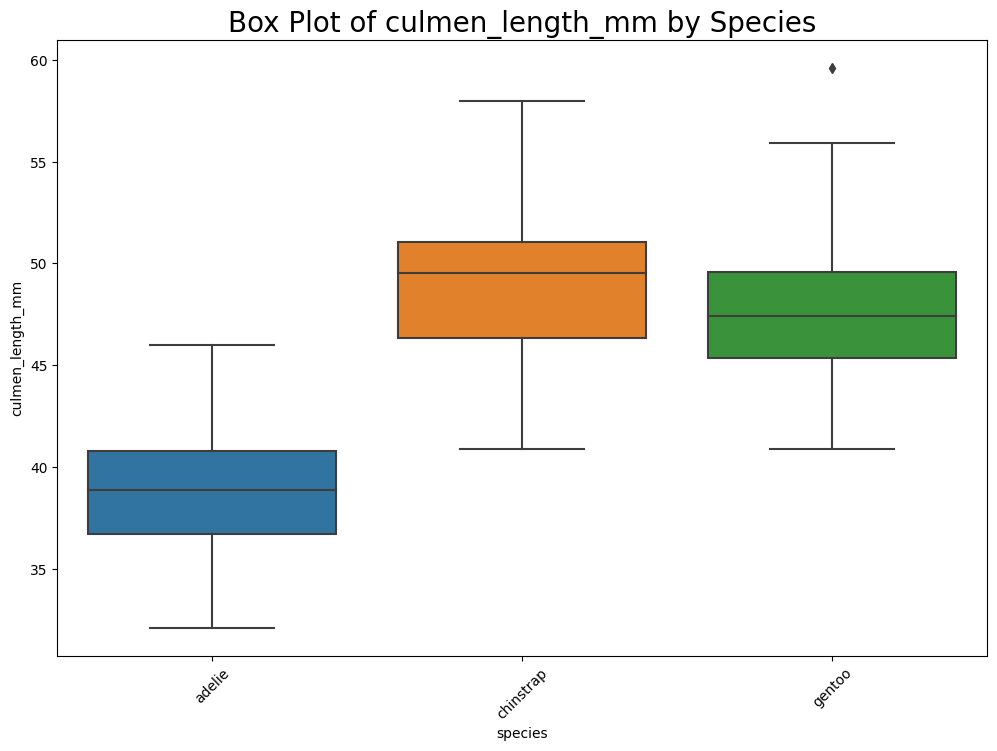

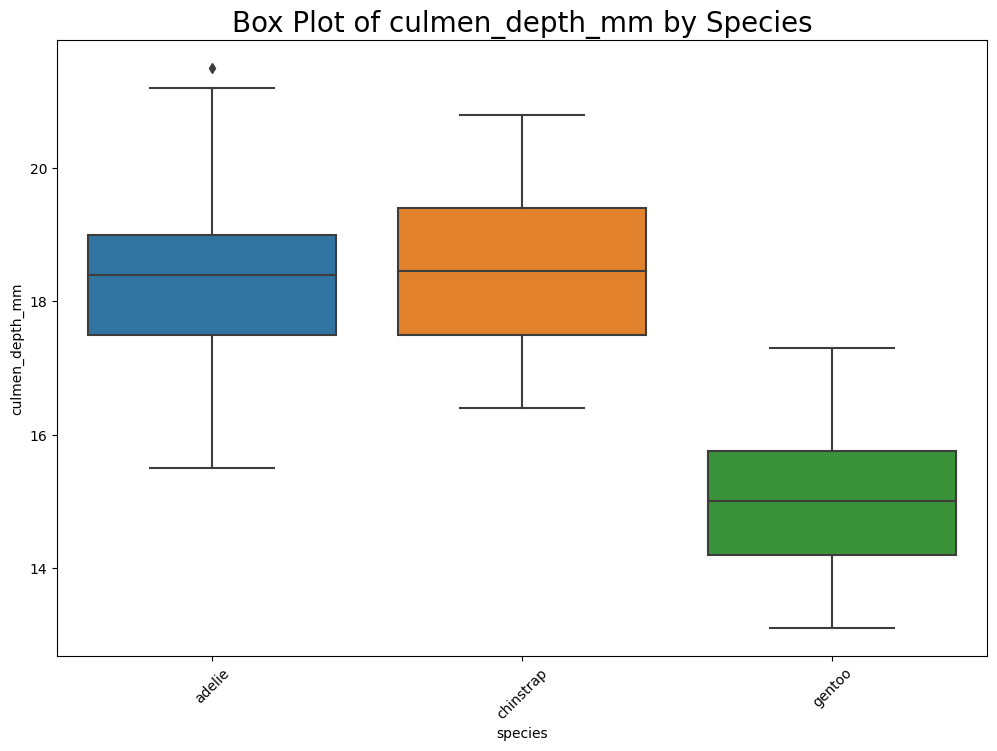

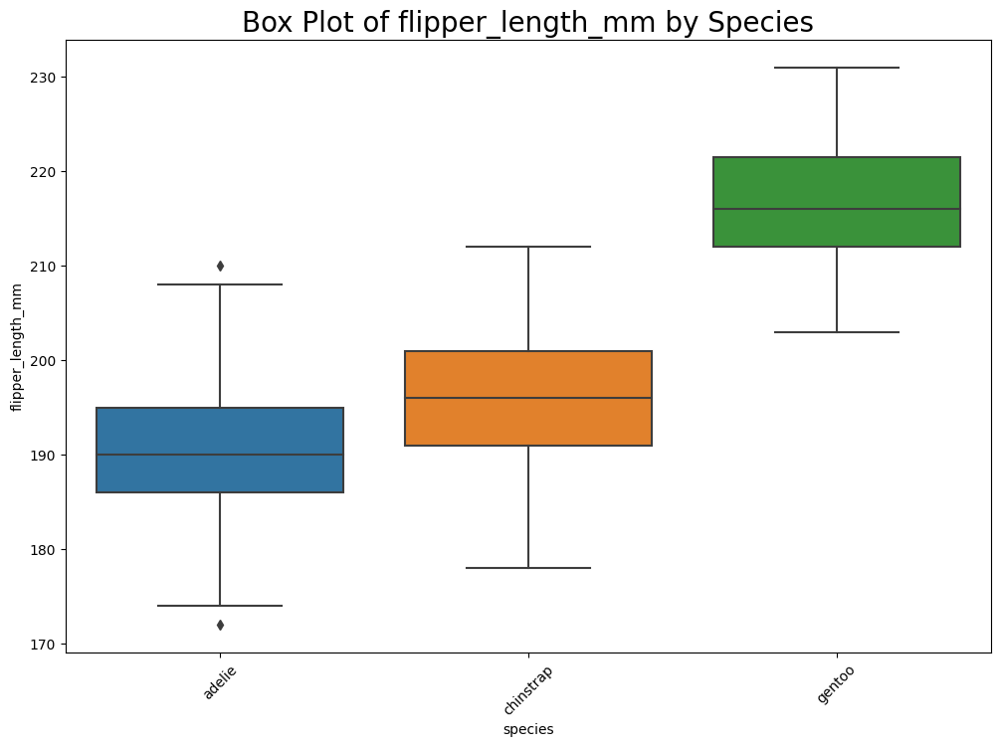

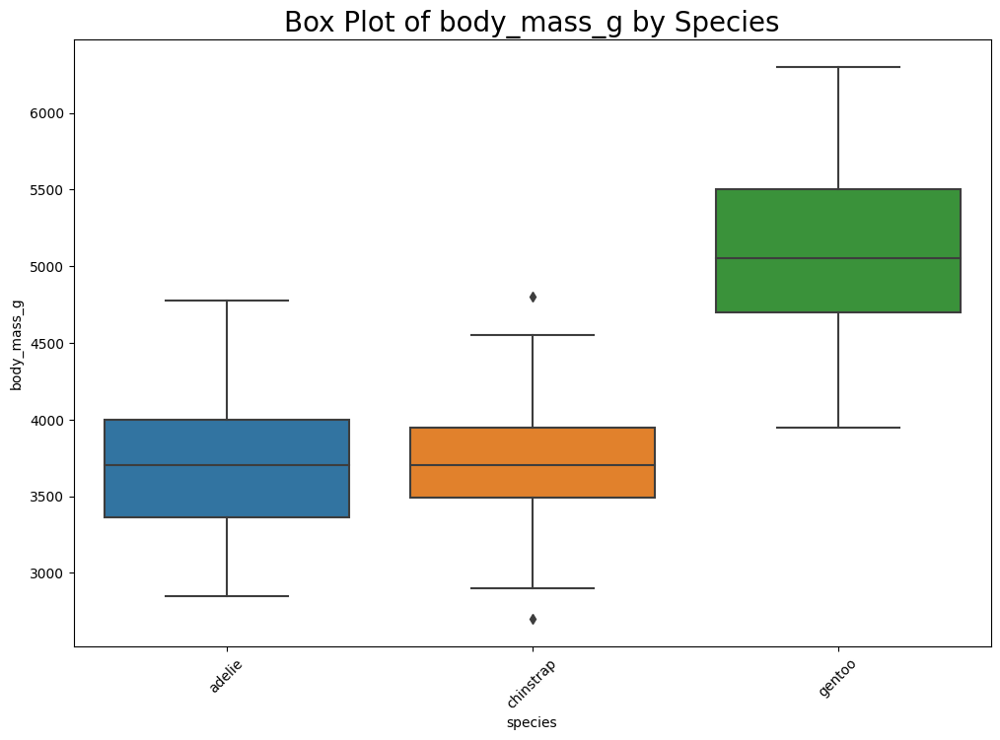

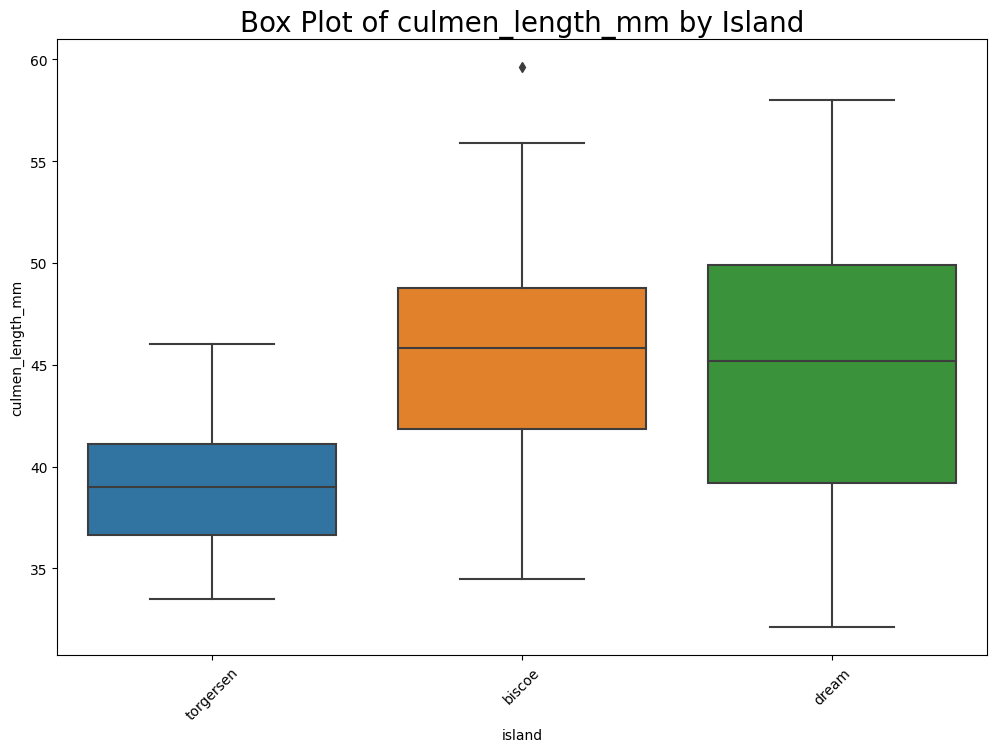

...

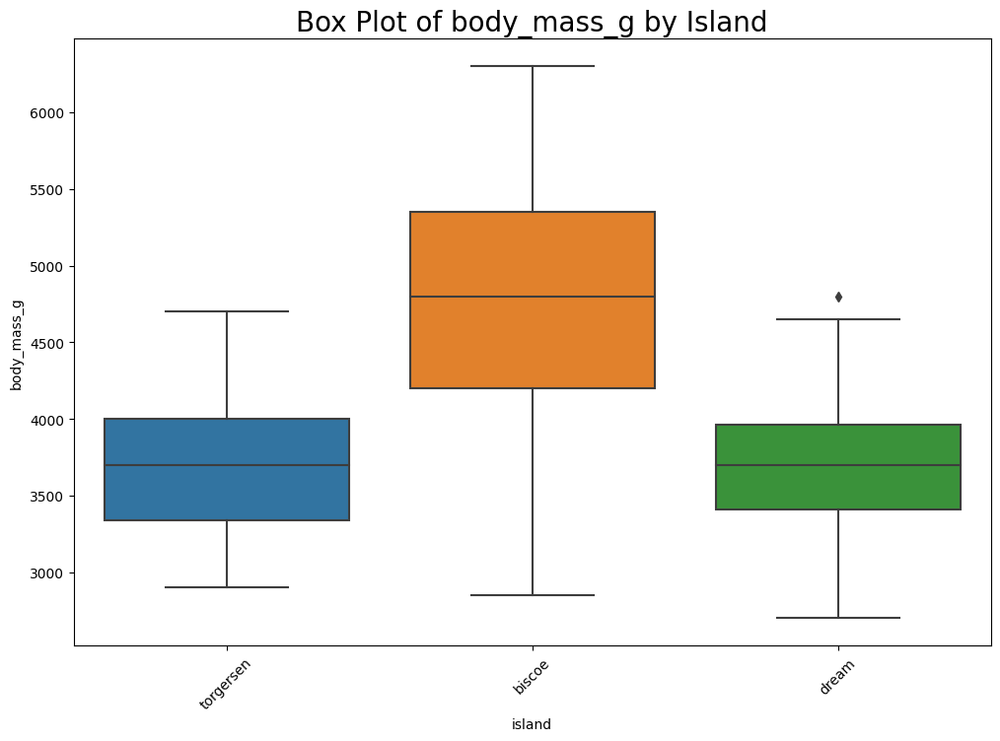

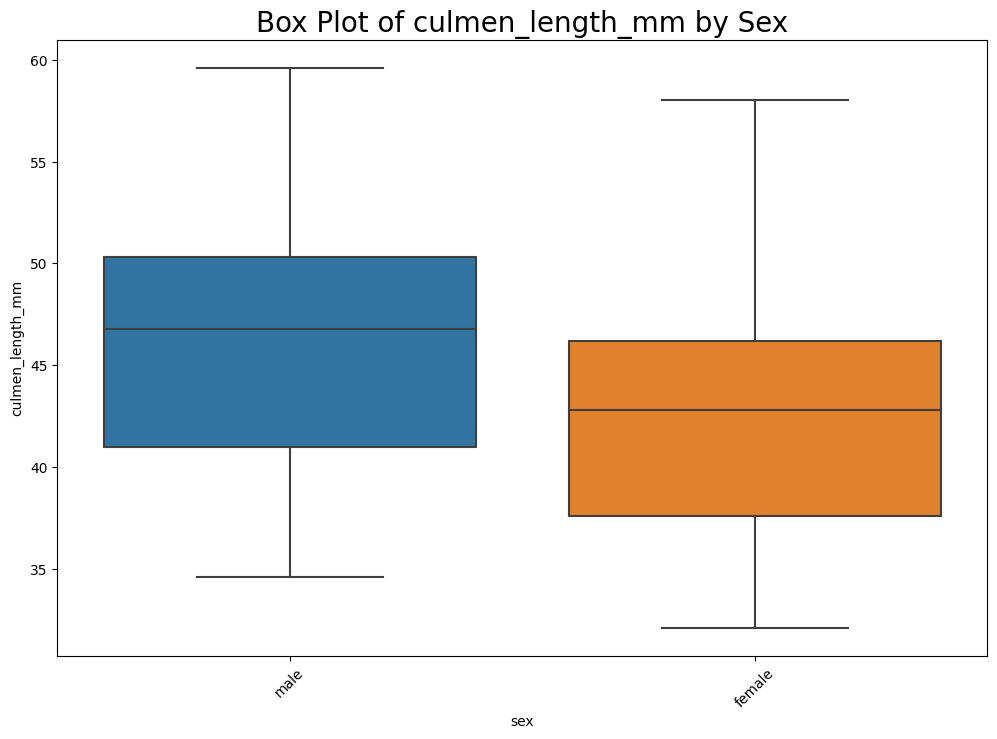

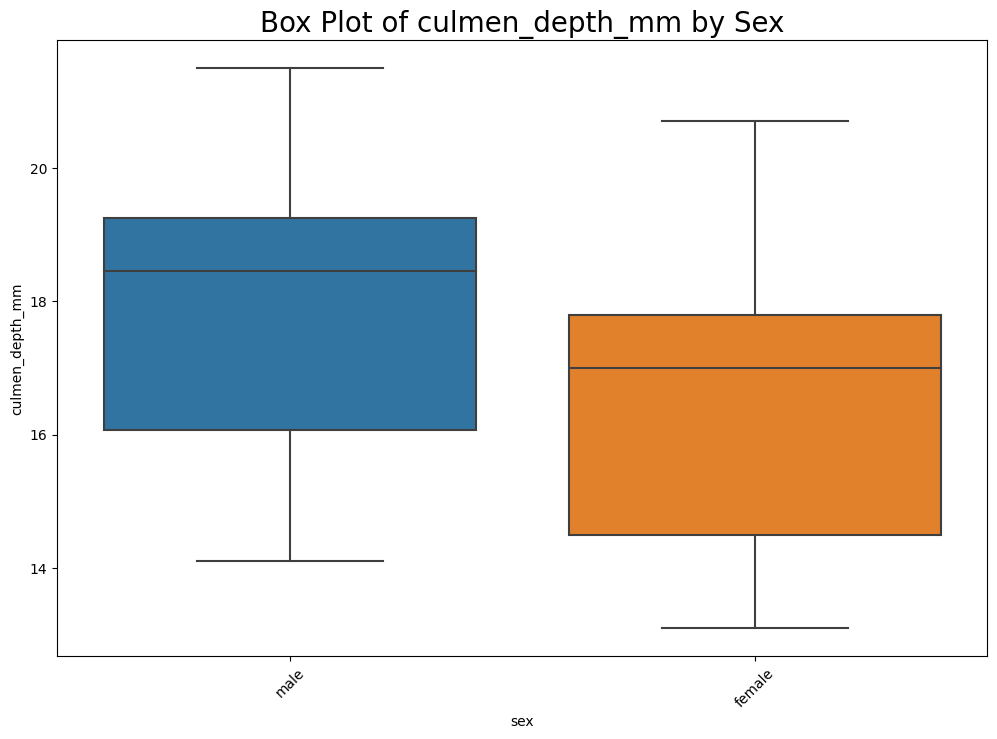

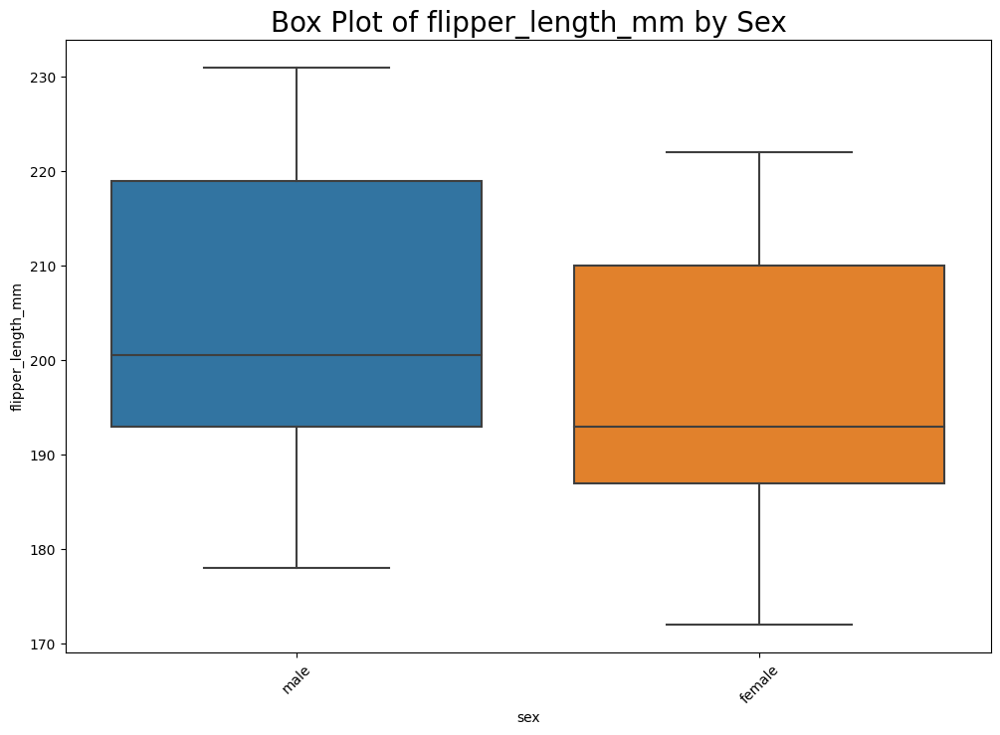

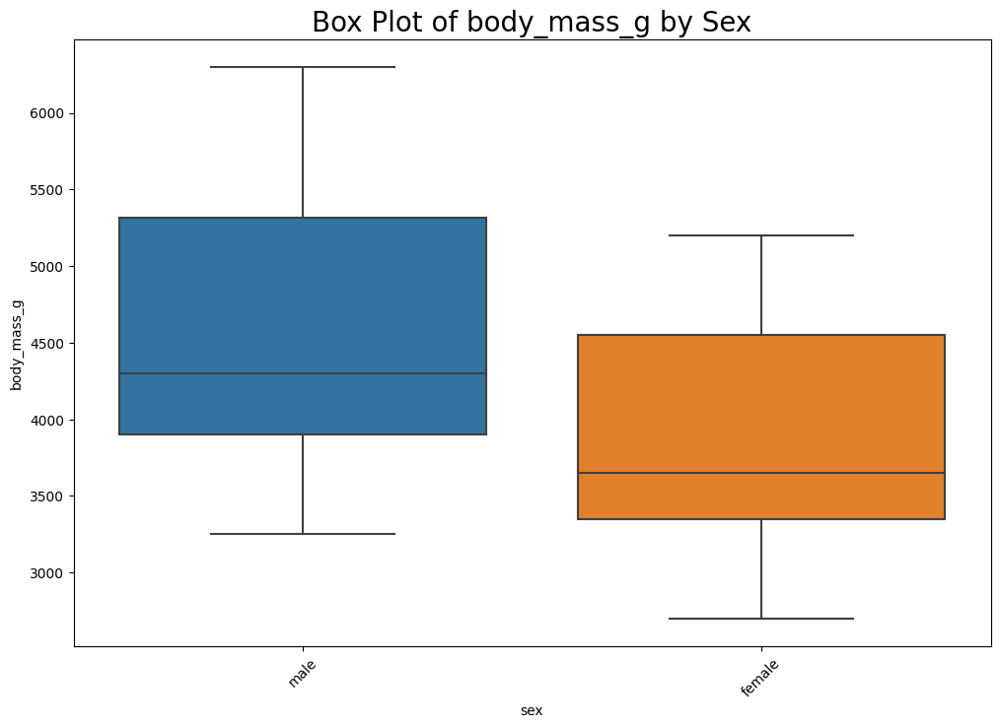

In [36]:
def plot_boxplots_for_group_with_simplified_stats(df, group):
    for col in numerical_columns:
        plt.figure(figsize=(12, 8))
        ax = sns.boxplot(x=group, y=col, data=df)

        # Annotating statistics could be simplified or adjusted to prevent misalignment
        # For instance, annotate only median value for each group directly onto the plot
        # This reduces complexity and focuses on the most critical statistic

        plt.title(f'Box Plot of {col} by {group.capitalize()}', fontsize=20)
        plt.xticks(rotation=45)
        plt.show()

plot_boxplots_for_group_with_simplified_stats(df1, 'species')
plot_boxplots_for_group_with_simplified_stats(df1, 'island')
plot_boxplots_for_group_with_simplified_stats(df1, 'sex')


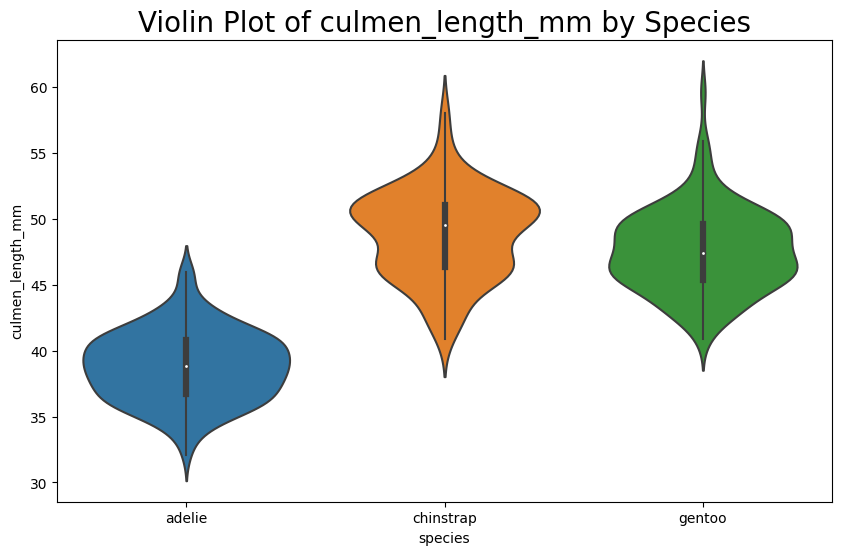

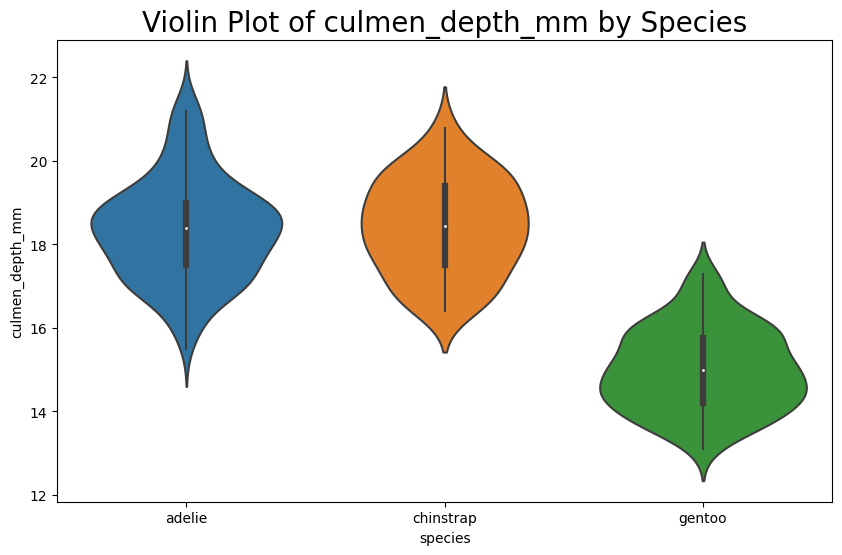

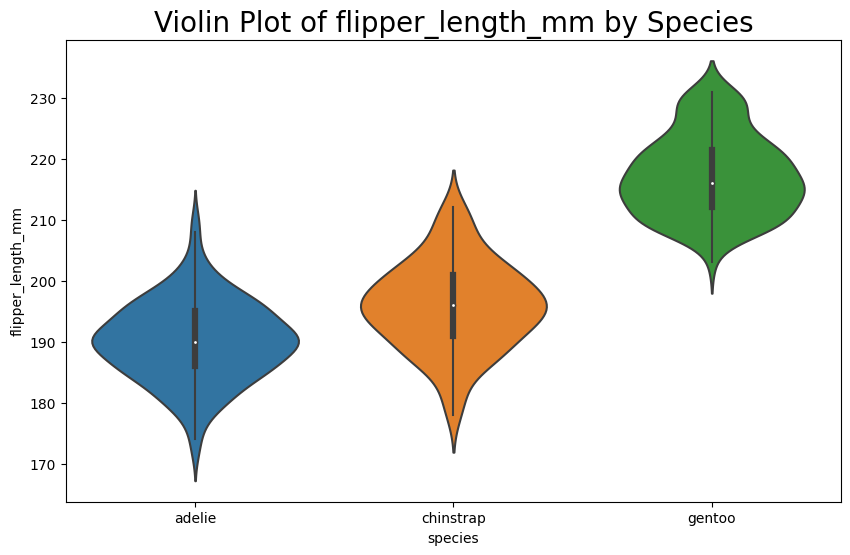

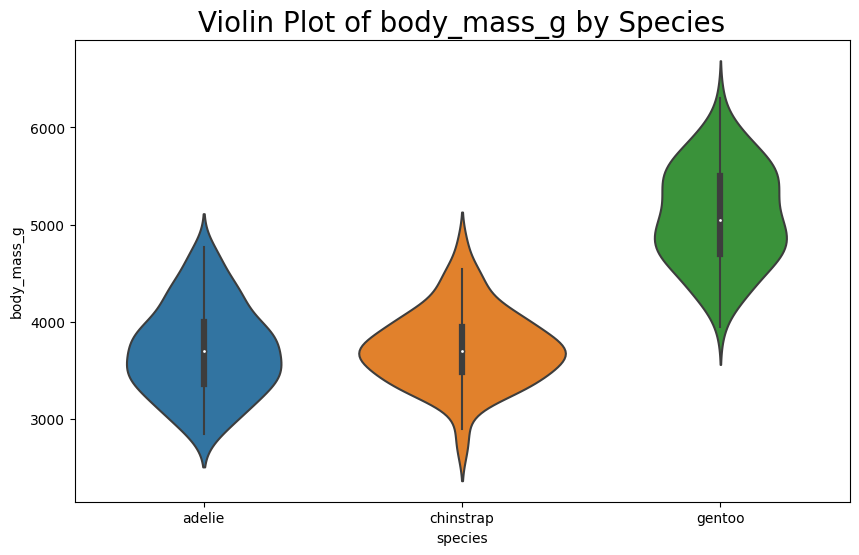

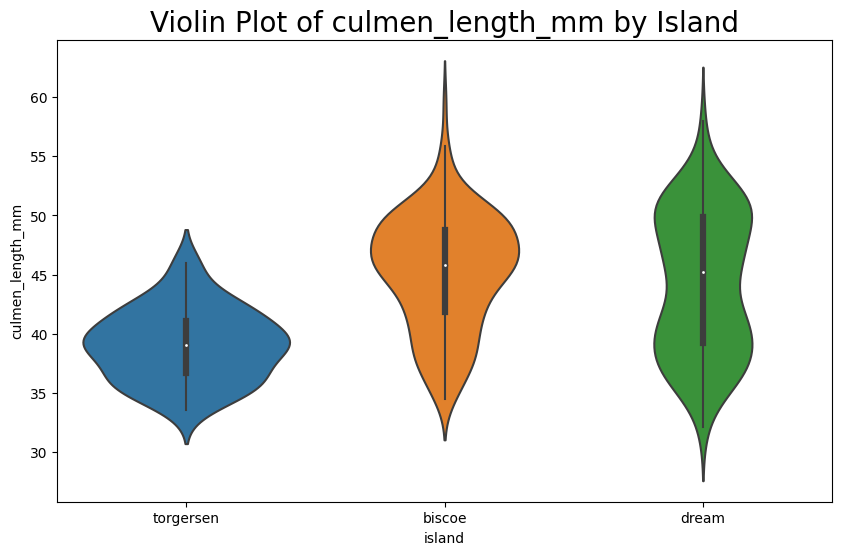

...

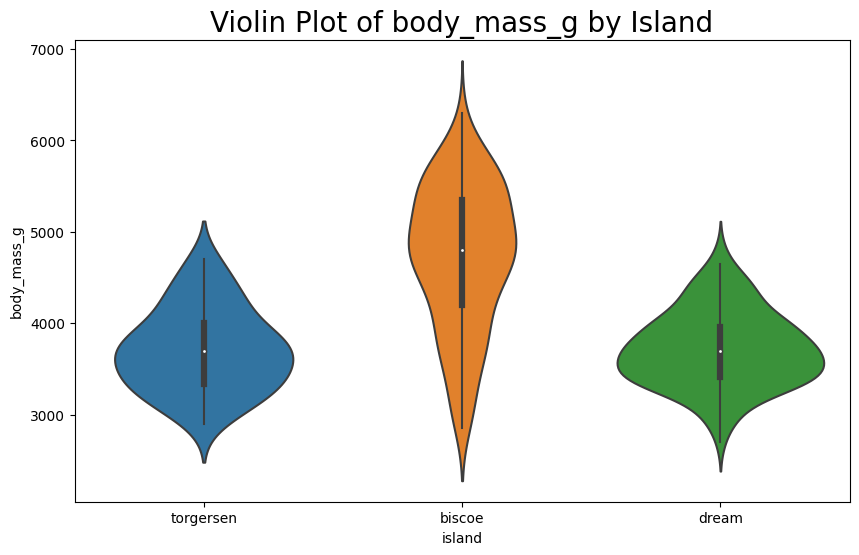

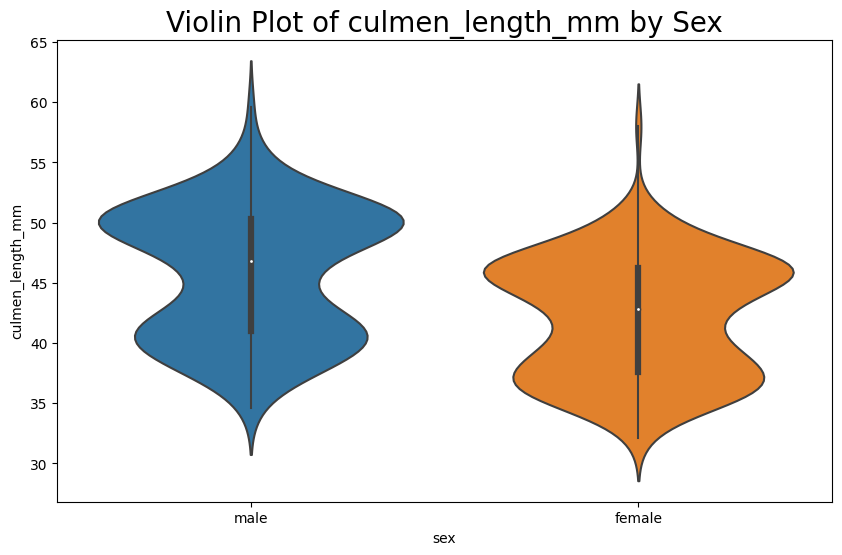

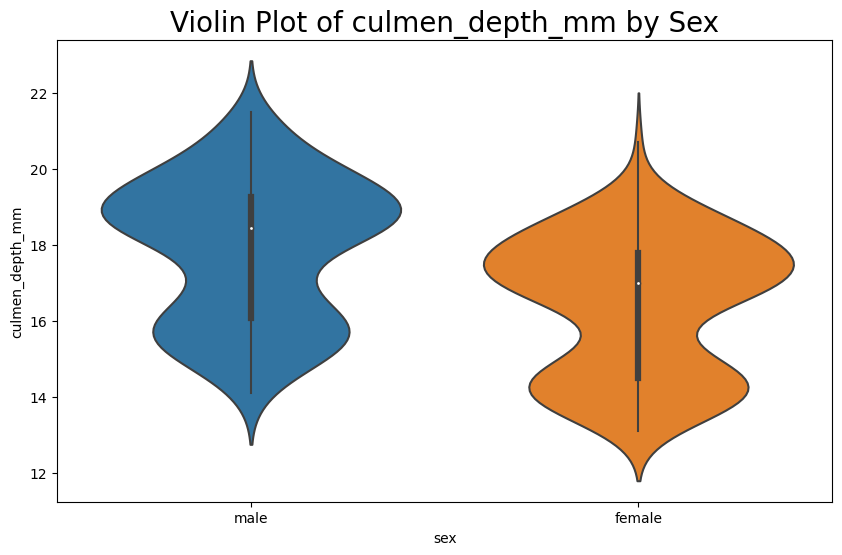

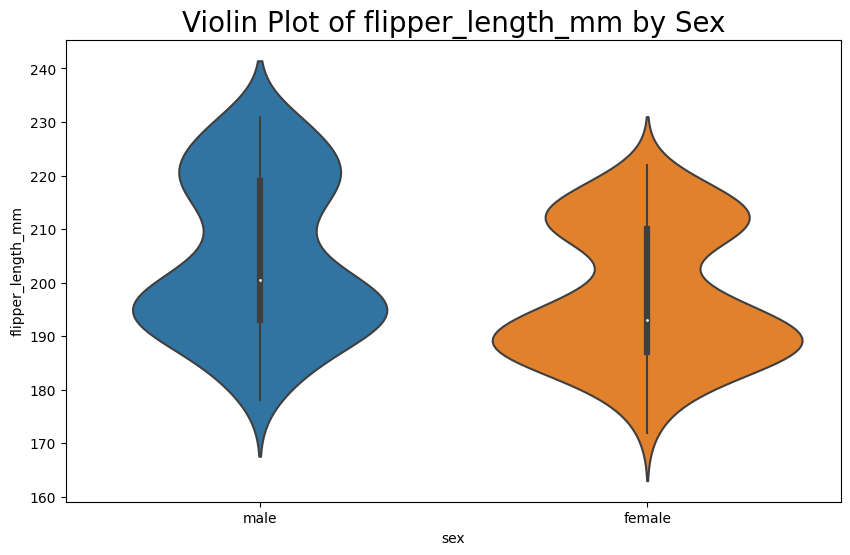

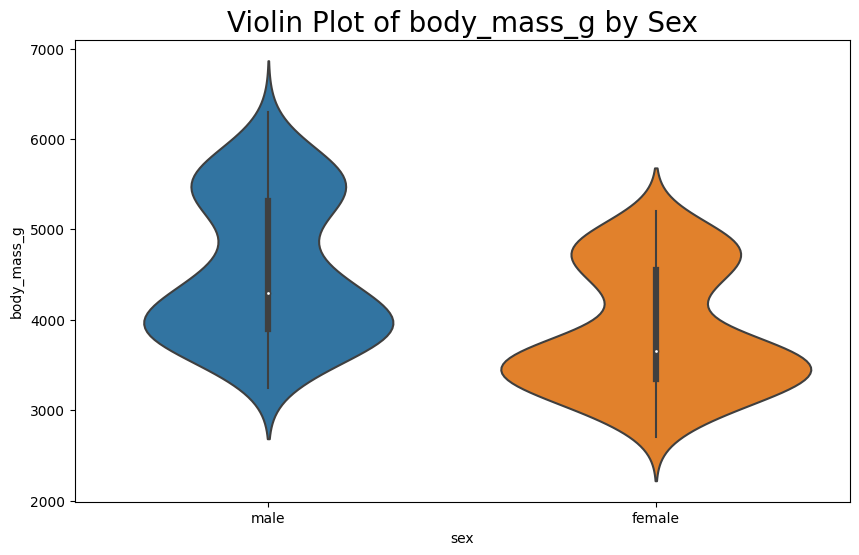

In [37]:
def plot_violinplots_for_group(df, group):
    for col in numerical_columns:
        plt.figure(figsize=(10, 6))
        sns.violinplot(x=group, y=col, data=df)
        plt.title(f'Violin Plot of {col} by {group.capitalize()}', fontsize=20)
        plt.show()

plot_violinplots_for_group(df1, 'species')
plot_violinplots_for_group(df1, 'island')
plot_violinplots_for_group(df1, 'sex')

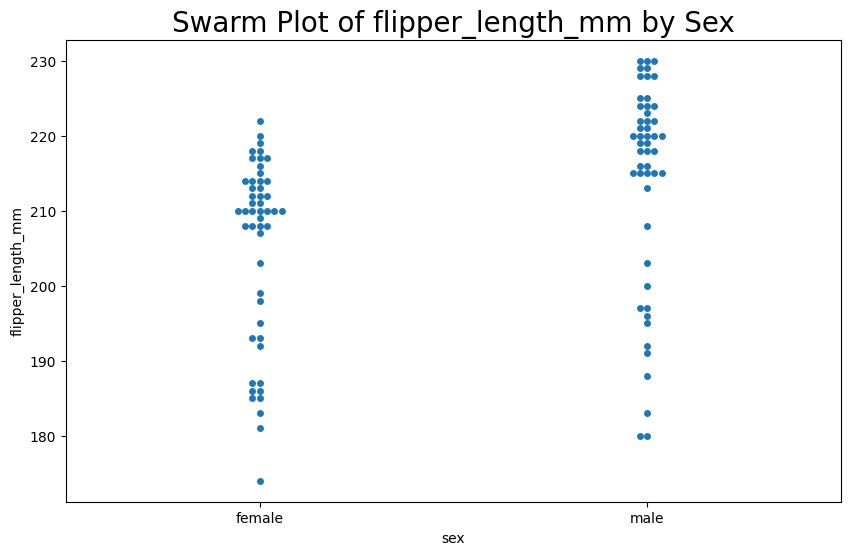

In [38]:
def plot_swarm_for_group(df, group, column):
    plt.figure(figsize=(10, 6))
    sns.swarmplot(x=group, y=column, data=df)
    plt.title(f'Swarm Plot of {column} by {group.capitalize()}', fontsize=20)
    plt.show()

plot_swarm_for_group(df1[df1['island'] == 'biscoe'].sample(100), 'sex', 'flipper_length_mm')


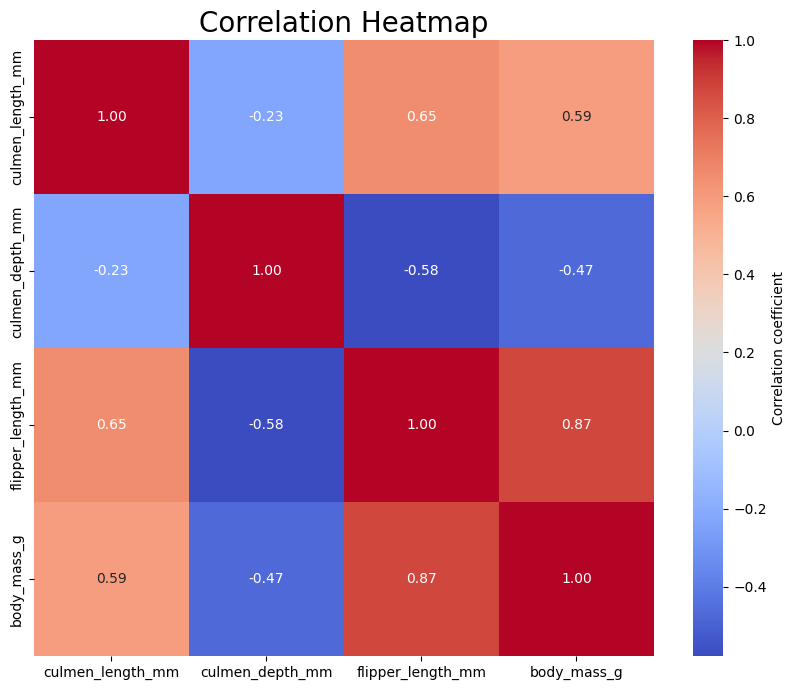

In [39]:
def plot_correlation_heatmap(df):
    corr = df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation coefficient'})
    plt.title('Correlation Heatmap', fontsize=20)
    plt.show()

plot_correlation_heatmap(df1[numerical_columns])

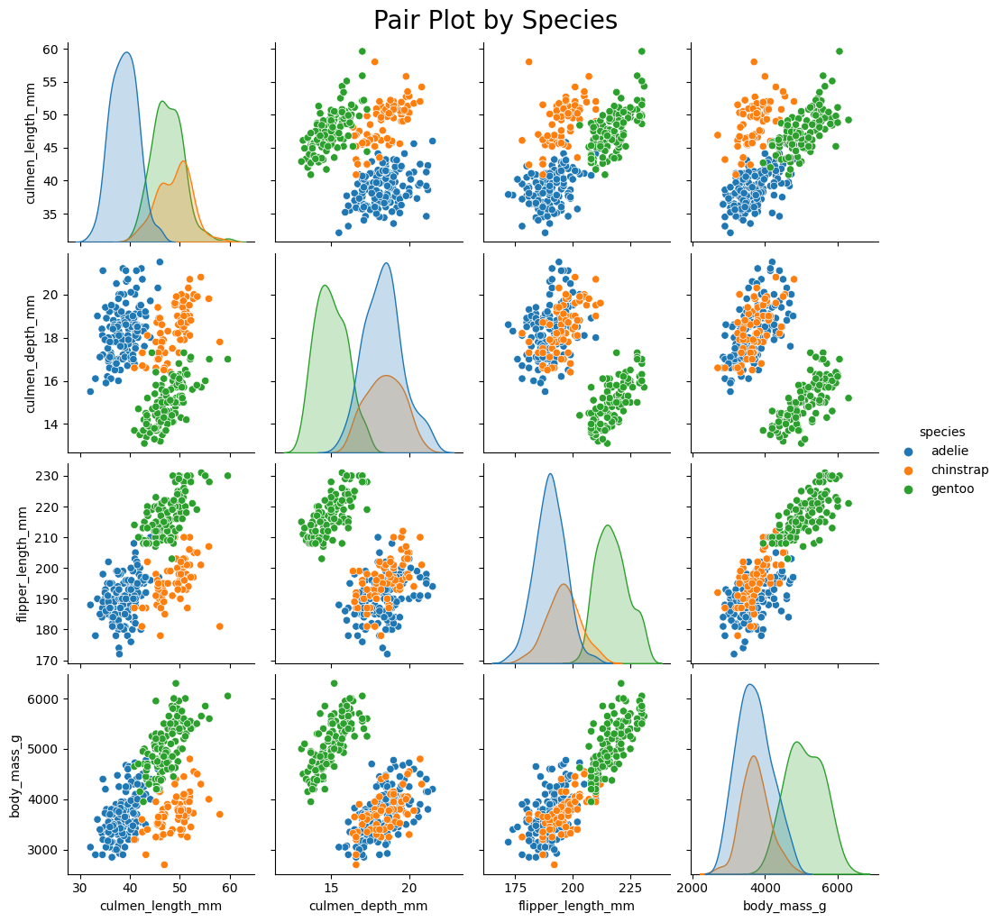

In [40]:
def plot_pairplot_for_group(df, group):
    sns.pairplot(df, hue=group)
    plt.suptitle(f'Pair Plot by {group.capitalize()}', fontsize=20, y=1.02)
    plt.show()

plot_pairplot_for_group(df1, 'species')


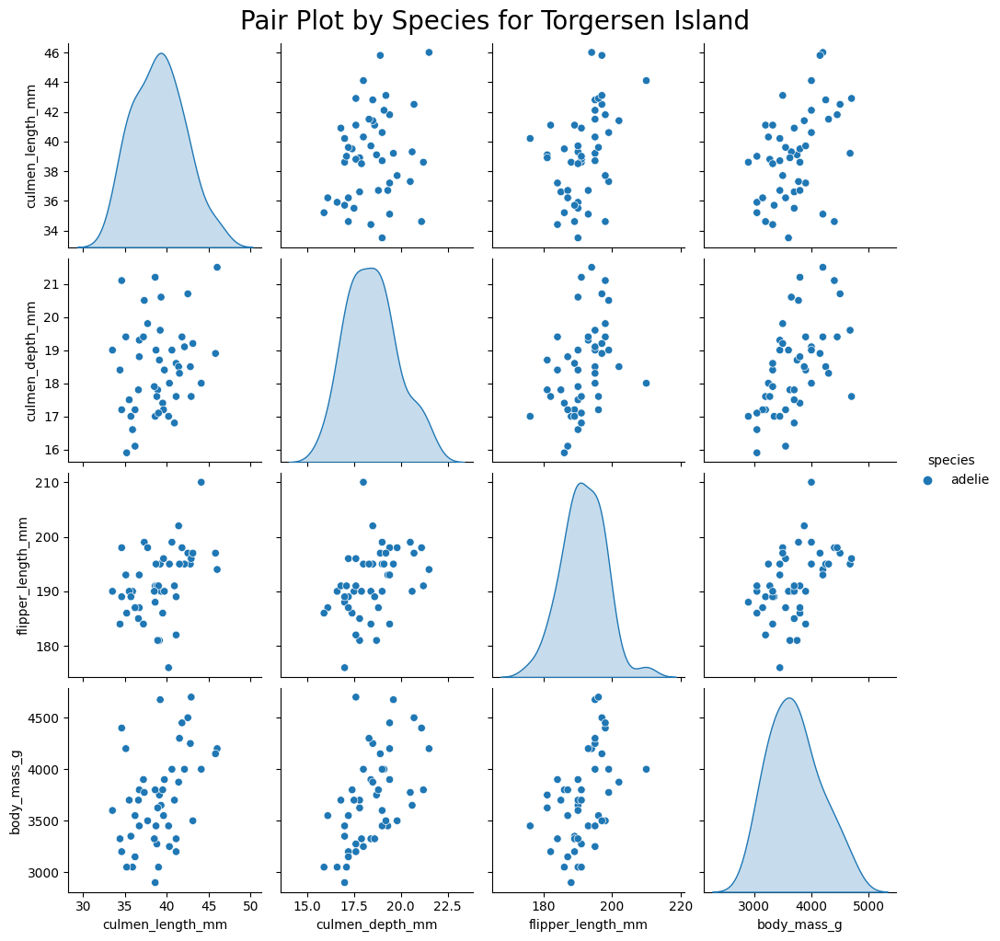

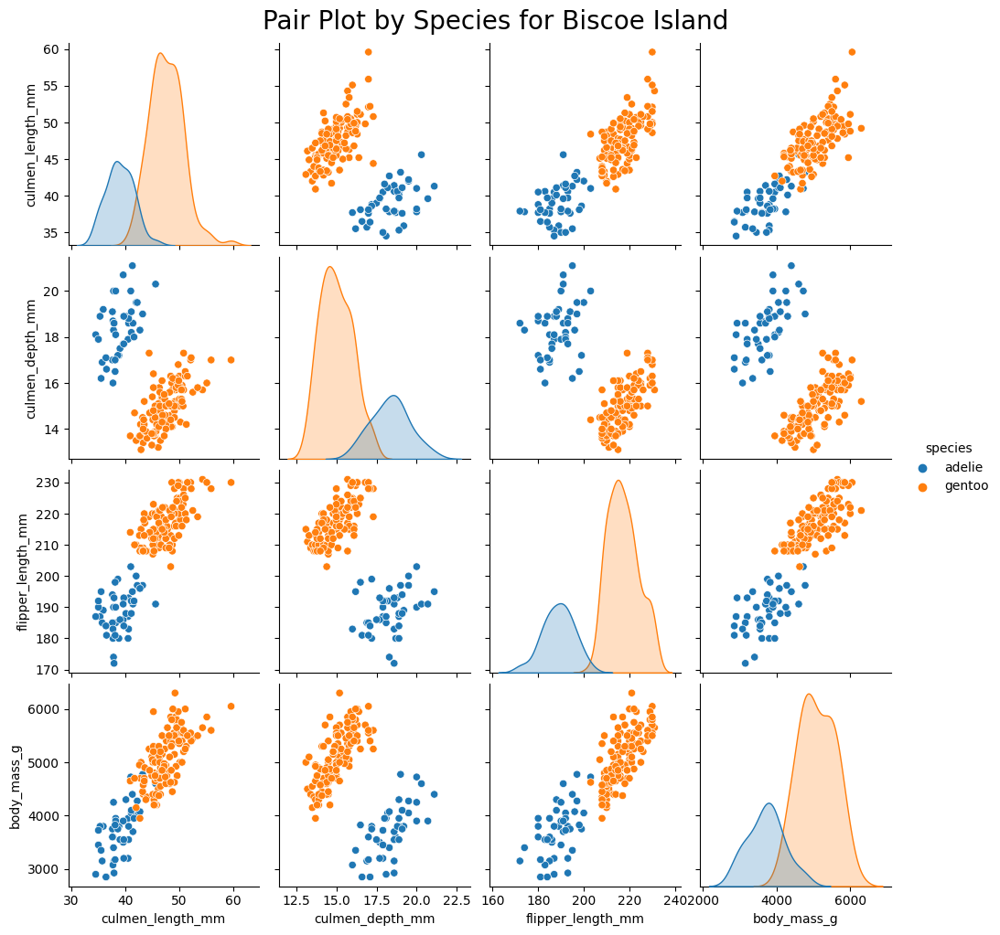

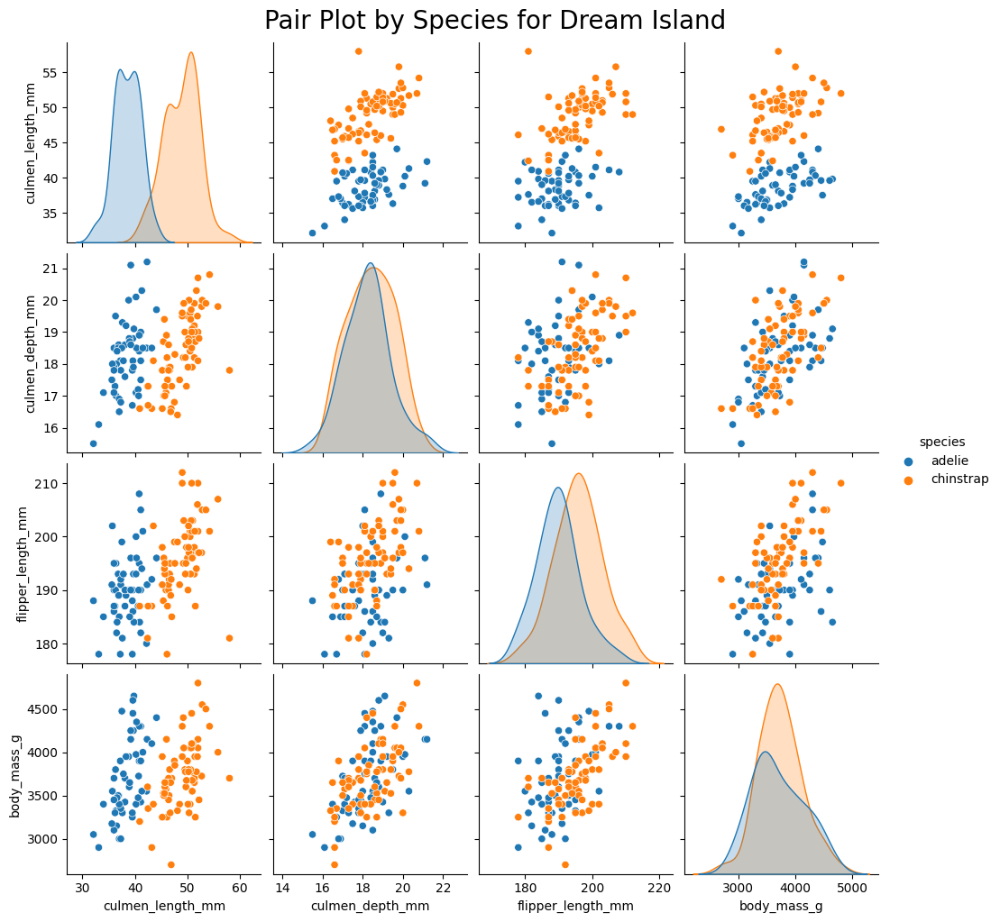

In [41]:
def plot_pairplot_for_group_per_island(island_dfs, group):
    for island, df in island_dfs.items():
        sns.pairplot(df, hue=group)
        plt.suptitle(f'Pair Plot by {group.capitalize()} for {island.capitalize()} Island', fontsize=20, y=1.02)
        plt.show()

plot_pairplot_for_group_per_island(island_dfs, 'species')


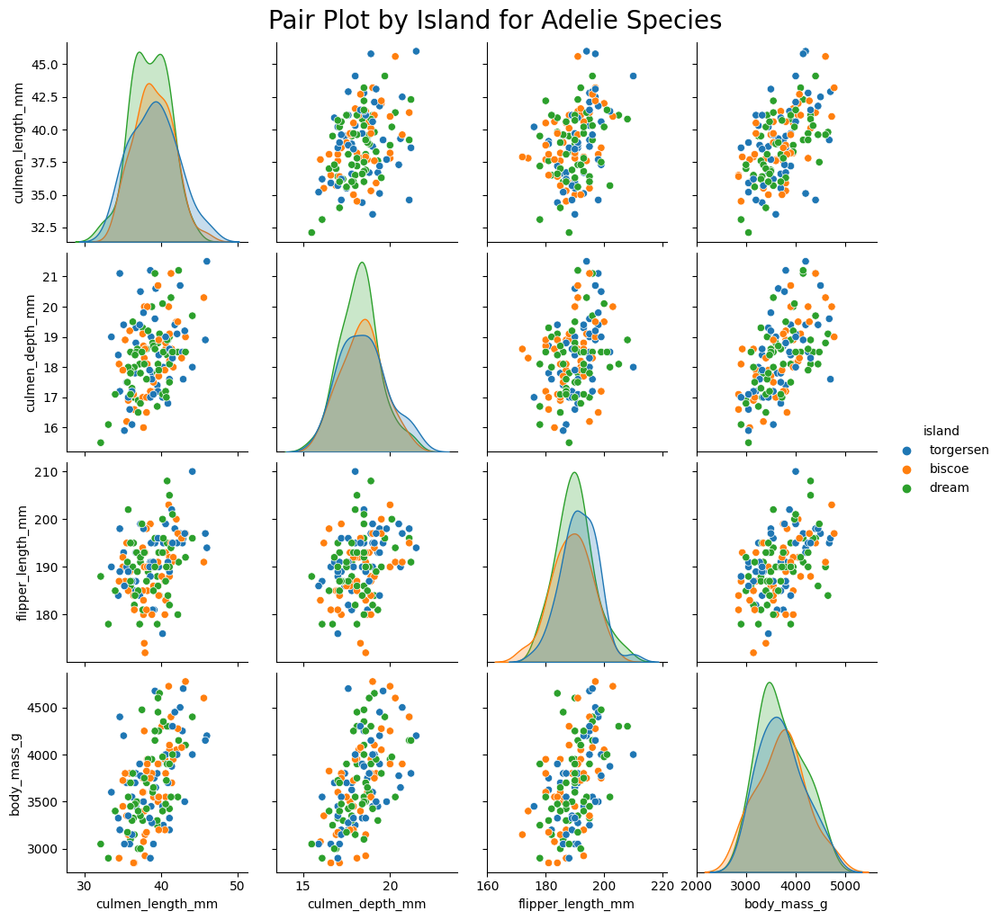

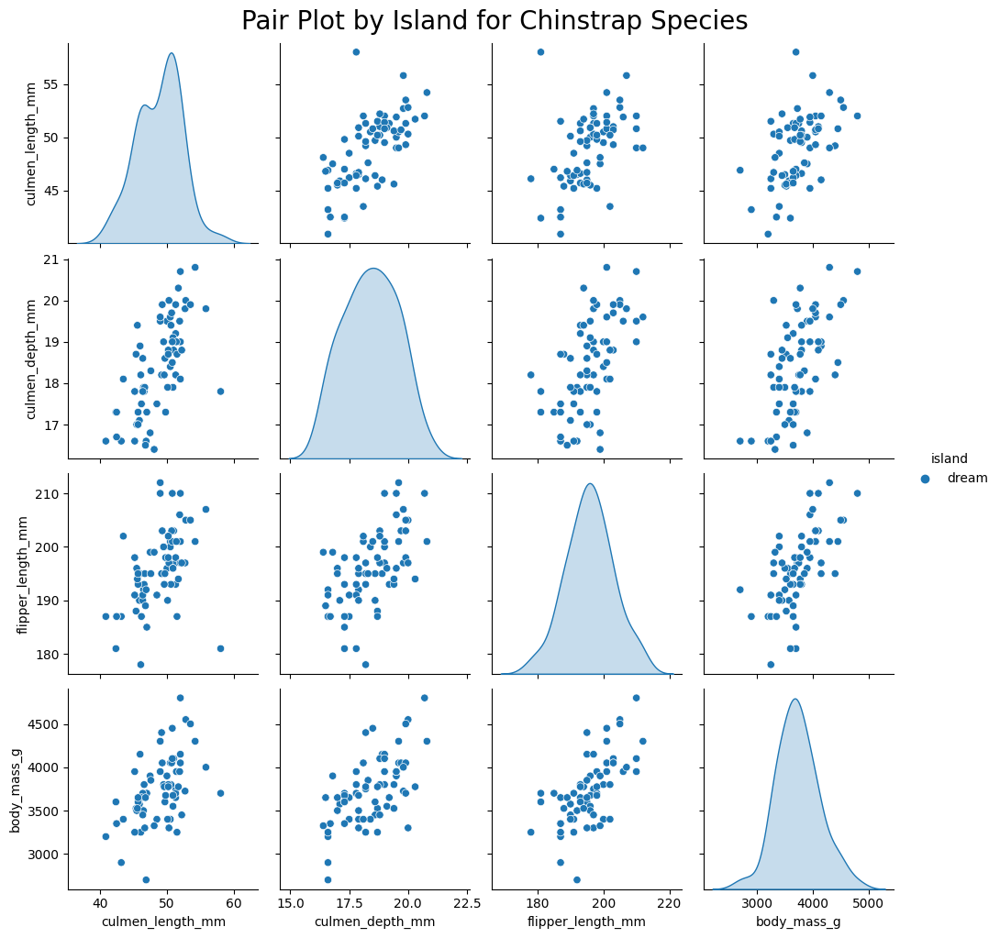

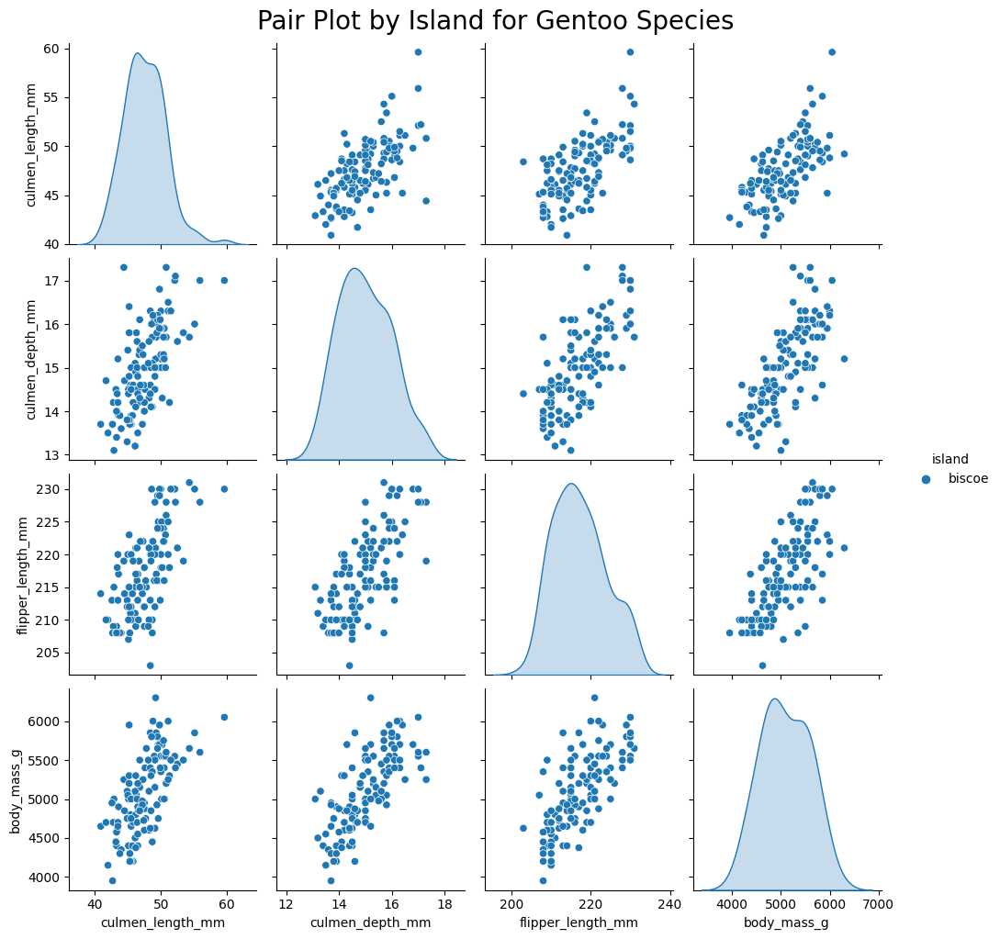

In [42]:
def plot_pairplot_for_group_per_species(species_dfs, group):
    for species, df in species_dfs.items():
        sns.pairplot(df, hue=group)
        plt.suptitle(f'Pair Plot by {group.capitalize()} for {species.capitalize()} Species', fontsize=20, y=1.02)
        plt.show()

plot_pairplot_for_group_per_species(species_dfs, 'island')


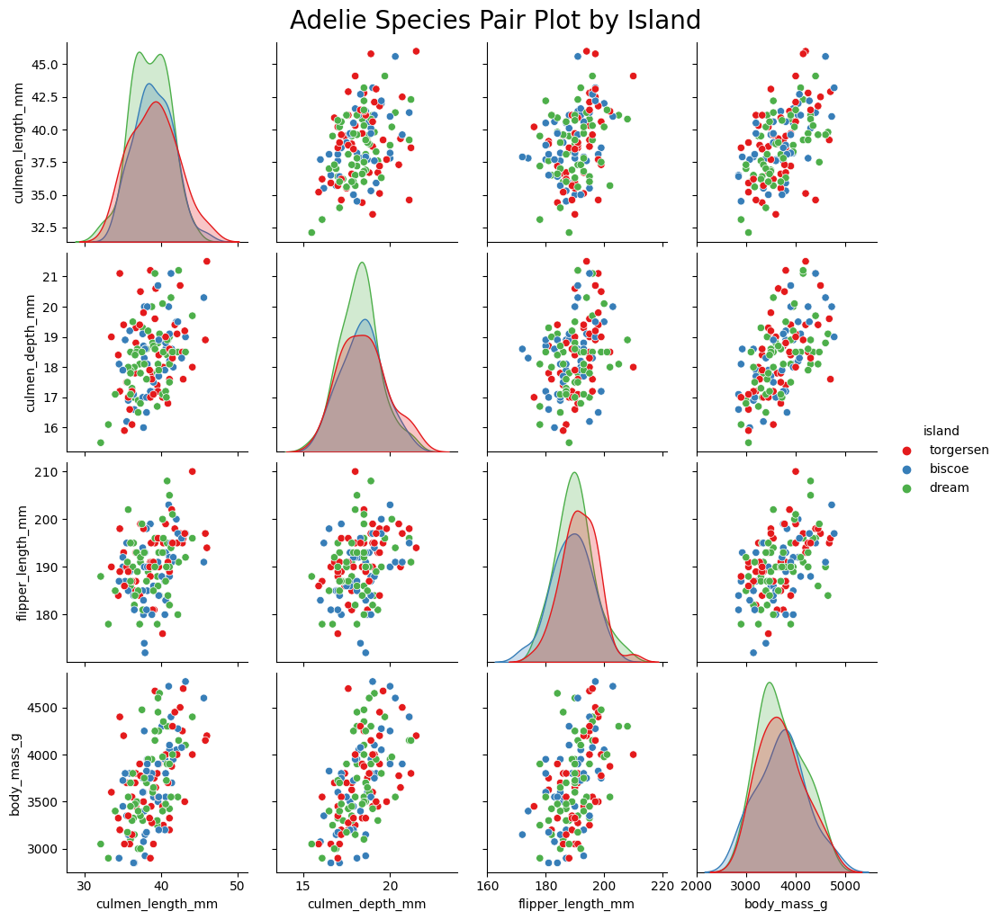

In [43]:
def plot_pairplot_adelie_by_island(df, species_name):
    adelie_df = df[df['species'].str.lower() == species_name.lower()]

    sns.pairplot(adelie_df, hue='island', palette='Set1')
    plt.suptitle(f'Adelie Species Pair Plot by Island', fontsize=20, y=1.02)
    plt.show()
plot_pairplot_adelie_by_island(df1, 'adelie')
